<h1> Amazon Apparel Recommendations </h1>



### [4.3] Overview of the data

In [173]:
#import all the necessary packages.
from tqdm import tqdm
import datetime
import requests
import itertools
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [2]:
# we have give a json file which consists of all information about
# the products
# loading the data using pandas' read_json file.
data = pd.read_json('tops_fashion.json')


In [3]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


### Terminology:
What is a dataset? <br>
Rows and columns <br>
Data-point <br>
Feature/variable <br>







In [4]:
# each product/item has 19 features in the raw dataset.
data.columns # prints column-names or feature-names.

Index(['asin', 'author', 'availability', 'availability_type', 'brand', 'color',
       'editorial_reivew', 'editorial_review', 'formatted_price',
       'large_image_url', 'manufacturer', 'medium_image_url', 'model',
       'product_type_name', 'publisher', 'reviews', 'sku', 'small_image_url',
       'title'],
      dtype='object')

Of these 19 features, we will be using only 6 features in this workshop.
    1. asin  ( Amazon standard identification number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [5]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [6]:
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() # prints the top rows in the table.

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


### [5.1] Missing data for various features.

####  Basic stats for the feature: product_type_name

In [7]:
# We have total 72 unique type of product_type_names
print(data['product_type_name'].describe())

# 91.62% (167794/183138) of the products are shirts,


count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [9]:
# names of different product types
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [18]:
# find the 10 most frequent product_type_names.
product_type_count = Counter(list(data['product_type_name']))
print("The 20 most common product type are as follows:",'\n',product_type_count.most_common(20))

The 20 most common product type are as follows: 
 [('SHIRT', 167794), ('APPAREL', 3549), ('BOOKS_1973_AND_LATER', 3336), ('DRESS', 1584), ('SPORTING_GOODS', 1281), ('SWEATER', 837), ('OUTERWEAR', 796), ('OUTDOOR_RECREATION_PRODUCT', 729), ('ACCESSORY', 636), ('UNDERWEAR', 425), ('PANTS', 363), ('ORCA_SHIRT', 290), ('BLAZER', 249), ('SHOES', 198), ('SLEEPWEAR', 142), ('SKIRT', 107), ('BRA', 95), ('HEALTH_PERSONAL_CARE', 92), ('TOYS_AND_GAMES', 80), ('MISC_OTHER', 62)]


####  Basic stats for the feature: brand

In [13]:
# there are 10577 unique brands
print(data['brand'].describe())

# 183138 - 182987 = 151 missing values.

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [17]:
brand_count = Counter(list(data['brand']))
print("The 20 most common brands are as follows:",'\n',brand_count.most_common(20))

The 20 most common brands are as follows: 
 [('Zago', 223), ('XQS', 222), ('Yayun', 215), ('YUNY', 198), ('XiaoTianXin-women clothes', 193), ('Generic', 192), ('Boohoo', 190), ('Alion', 188), ('Abetteric', 187), ('TheMogan', 187), ('xiaokong', 186), ('Sheng XiWomen', 185), ('UUYUK', 185), ('Splendid', 184), ('TOOGOO(R)', 184), ('WILLTOO', 184), ('Acquaa', 183), ('Aeropostale', 179), ('WANSHIYISHE', 179), ('Ulla Popken', 178)]


####  Basic stats for the feature: color

In [19]:

print(data['color'].describe())


# we have 7380 unique colors
# 7.2% of products are black in color
# 64956 of 183138 products have brand information. That's approx 35.4%.

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [25]:
color_count = Counter(list(data['color']))
print("The 20 most common color is:",'\n',color_count.most_common(20))

The 20 most common color is: 
 [(None, 118182), ('Black', 13207), ('White', 8616), ('Blue', 3570), ('Red', 2289), ('Pink', 1842), ('Grey', 1499), ('*', 1388), ('Green', 1258), ('Multi', 1203), ('Gray', 1189), ('Purple', 951), ('Navy', 846), ('Brown', 561), ('Yellow', 527), ('Orange', 524), ('Beige', 498), ('Multicolor', 463), ('Ivory', 380), ('Multicoloured', 348)]


####  Basic stats for the feature: formatted_price

In [22]:
 
print(data['formatted_price'].describe())

# Only 28,395 (15.5% of whole data) products with price information

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [26]:
price_count = Counter(list(data['formatted_price']))
print("The 20 most common price per item is:",'\n',price_count.most_common(10))

The 20 most common price per item is: 
 [(None, 154743), ('$19.99', 945), ('$9.99', 749), ('$9.50', 601), ('$14.99', 472), ('$7.50', 463), ('$24.99', 414), ('$29.99', 370), ('$8.99', 343), ('$9.01', 336)]


#### Basic stats for the feature: title


In [27]:
print(data['title'].describe())

# All of the products have a title. 
# Titles are fairly descriptive of what the product is. 
# We use titles extensively in this workshop 
# as they are short and informative.


count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


In [28]:
data.to_pickle('180k_apparel_data')

   We save data files at every major step in our processing in "pickle" files. If you are stuck anywhere (or) if some code takes too long to run on your laptop, you may use the pickle files we give you to speed things up.

In [31]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


In [32]:
# consider products which have price information
# data['formatted_price'].isnull() => gives the information 
#about the dataframe row's which have null values price == None|Null
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [33]:
# consider products which have color information
# data['color'].isnull() => gives the information about the dataframe row's which have null values price == None|Null
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


#### We brought down the number of data points from 183K  to 28K.

We are processing only 28K points so that most of the workshop participants can run this code on thier laptops in a reasonable amount of time. <br> 

For those of you who have powerful computers and some time to spare, you are recommended to use all of the 183K images.


In [34]:
data.to_pickle('28k_apparel_data')

In [23]:
# You can download all these 28k images using this code below.
# You do NOT need to run this code and hence it is commented.


'''
from PIL import Image
import requests
from io import BytesIO

for index, row in images.iterrows():
        url = row['large_image_url']
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img.save('images/28k_images/'+row['asin']+'.jpeg')


'''

"\nfrom PIL import Image\nimport requests\nfrom io import BytesIO\n\nfor index, row in images.iterrows():\n        url = row['large_image_url']\n        response = requests.get(url)\n        img = Image.open(BytesIO(response.content))\n        img.save('images/28k_images/'+row['asin']+'.jpeg')\n\n\n"

### [5.2] Remove near duplicate items

#### [5.2.1] Understand about duplicates.

In [69]:
# read data from pickle file from previous stage
data = pd.read_pickle('28k_apparel_data')

# find number of products that have duplicate titles.
print(sum(data.duplicated('title')))
# we have 2325 products which have same title but different color


2325


#### These shirts are exactly same except in size (S, M,L,XL)

<table>
<tr> 
<td><img src="dedupe/B00AQ4GMCK.jpeg",width=100,height=100> :B00AQ4GMCK</td>
<td><img src="dedupe/B00AQ4GMTS.jpeg",width=100,height=100> :B00AQ4GMTS</td>
</tr>
<tr> 
<td><img src="dedupe/B00AQ4GMLQ.jpeg",width=100,height=100> :B00AQ4GMLQ</td>
<td><img src="dedupe/B00AQ4GN3I.jpeg",width=100,height=100> :B00AQ4GN3I</td>
</tr>
</table>

#### These shirts exactly same except  in color

<table>
<tr> 
<td><img src="dedupe/B00G278GZ6.jpeg",width=100,height=100> :B00G278GZ6</td>
<td><img src="dedupe/B00G278W6O.jpeg",width=100,height=100> :B00G278W6O</td>
</tr>
<tr> 
<td><img src="dedupe/B00G278Z2A.jpeg",width=100,height=100> :B00G278Z2A</td>
<td><img src="dedupe/B00G2786X8.jpeg",width=100,height=100> :B00G2786X8</td>
</tr>
</table>

#### In our data there are many duplicate products like the above examples, we need to de-dupe them for better results.


#### [5.2.2] Remove duplicates : Part 1

In [8]:
# read data from pickle file from previous stage
data = pd.read_pickle('28k_apparel_data')

In [9]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel Short...,$7.50


In [10]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [11]:
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


#### Some examples of dupliacte titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [12]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [13]:
stage1_asin_dedup = []
x = 0
y = 0
data_points = data_sorted.shape[0]
while x < data_points and y < data_points:
    x_previous = x
    
    a = data['title'].loc[indices[x]].split()
    
    y = x + 1
    
    while y < data_points:
        
        b = data['title'].loc[indices[y]].split()
        
        length = max(len(a), len(b))
        
        count = 0
        
        for d in itertools.zip_longest(a,b):
            if d[0] == d[1]:
                count += 1
            
        if (length - count) > 3:
            stage1_asin_dedup.append(data['asin'].loc[indices[x]])
            
            if y == data_points - 1:
                stage1_asin_dedup.append(data['asin'].loc[indices[y]])
                
            x = y
            break
        else:
            y += 1
                
    if x_previous == x:
        break
        

In [14]:
data = data.loc[data['asin'].isin(stage1_asin_dedup)]

#### We removed  the dupliactes which differ only at the end.

In [15]:
print('Number of data points : ', data.shape[0])

Number of data points :  16317


In [17]:
data.to_pickle('16k_apperal_data')

#### [5.2.3] Remove duplicates : Part 2

<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [80]:
i = indices.pop()

In [81]:
i

118987

In [82]:
data = pd.read_pickle('17k_apperal_data')

In [83]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about an hour to run on a decent computer.

indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [84]:
# from whole previous products we will consider only 
# the products that are found in previous cell 
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [85]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16435


In [ ]:
data.to_pickle('pickels/16k_apperal_data')
# Storing these products in a pickle file
# candidates who wants to download these files instead 
# of 180K they can download and use them from the Google Drive folder.

# 6. Text pre-processing

In [18]:
data = pd.read_pickle('16k_apperal_data')

# NLTK download stop words. [RUN ONLY ONCE]
# goto Terminal (Linux/Mac) or Command-Prompt (Window) 
# In the temrinal, type these commands
# $python3
# $import nltk
# $nltk.download()

In [19]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'him', 'such', 'ain', 'ma', "shouldn't", 'doing', 'my', 'being', 'themselves', "doesn't", 'were', 'few', 'most', "you'll", "needn't", 'while', 'is', 'and', 'about', 'once', 'a', 'he', 'will', 'ours', 'an', 'how', 'them', 'haven', 'off', 'as', 'why', 'own', 'because', 'himself', 'been', 'i', 'same', 'through', 'yourself', 'above', "weren't", 'below', 'having', 'hasn', 'in', 'shouldn', 'hers', 'y', 'had', 'yourselves', 'until', 'she', 'they', "mustn't", 'shan', 'under', 'all', 'both', 'now', 'during', 'this', 'wouldn', 'mustn', 'on', 'o', "she's", 'too', 'should', 'than', 're', 'needn', 'just', "you've", 'does', 'myself', 'before', 'no', 'have', "won't", 'again', 'into', 'your', 'other', "shan't", 'each', 'after', 'doesn', 'more', 'her', 'aren', 'hadn', "you'd", 've', 'you', 'his', 'their', 'couldn', 'wasn', 'nor', 'me', 'was', 'did', 'theirs', 'with', 'who', 'at', 'further', 'what', 'only', 'but', 'don', "hadn't", "don't", 'its', 'any', 'so', 'herself', "hasn't", 'i

In [20]:
start_time = time.clock()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.clock() - start_time, "seconds")

8.371921569500426 seconds


In [21]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
43,B0079BMKDS,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,featherlite ladies silky smooth pique white xl,$13.53


In [23]:
data.to_pickle('16k_apperal_data_preprocessed')

## Stemming 

In [ ]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
print(stemmer.stem('arguing'))
print(stemmer.stem('fishing'))


# We tried using stemming on our titles and it didnot work very well. 


# [8] Text based product similarity

In [7]:
data = pd.read_pickle('16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
43,B0079BMKDS,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,featherlite ladies silky smooth pique white xl,$13.53


In [167]:
# Utility Functions which we will use through the rest of the workshop.


#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of words along with the frequency of each 
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

## [8.2] Bag of Words (BoW) on product titles.

In [6]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.
# title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(corpus) returns 
# the a sparase matrix of dimensions #data_points * #words_in_corpus

# What is a sparse vector?

# title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc



(16317, 12678)

In [7]:
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)


# Lets get similar products for product ID 1152 and 104 using Bag of Words

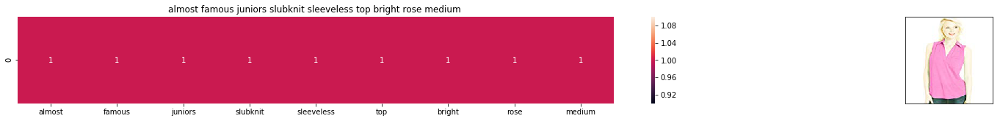

ASIN : B01CO4GLPM
Brand: Almost Famous
Title: almost famous juniors slubknit sleeveless top bright rose medium 
Euclidean similarity with the query image : 0.0


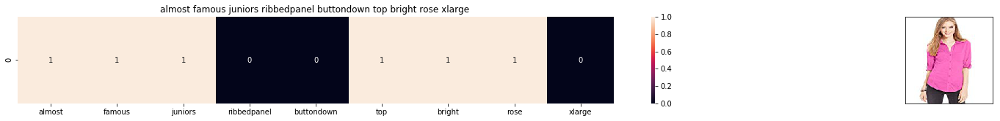

ASIN : B01CEUX0MI
Brand: Almost Famous
Title: almost famous juniors ribbedpanel buttondown top bright rose xlarge 
Euclidean similarity with the query image : 2.449489742783178


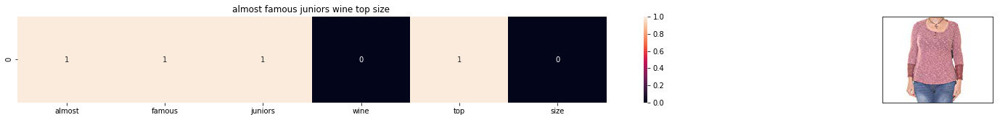

ASIN : B01M3RLP9B
Brand: Almost Famous
Title: almost famous juniors wine top size 
Euclidean similarity with the query image : 2.6457513110645907


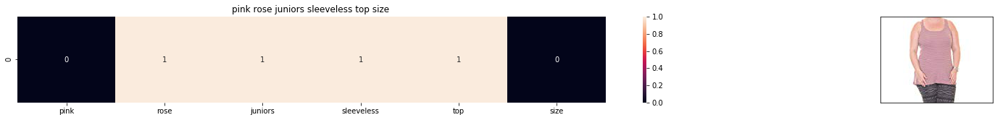

ASIN : B01MG5KJCQ
Brand: PINK ROSE
Title: pink rose juniors sleeveless top size 
Euclidean similarity with the query image : 2.6457513110645907


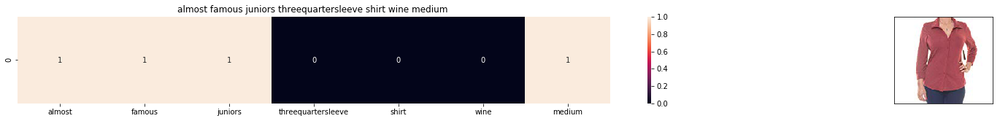

ASIN : B01MTRWVKO
Brand: Almost Famous
Title: almost famous juniors threequartersleeve shirt wine medium 
Euclidean similarity with the query image : 2.8284271247461903


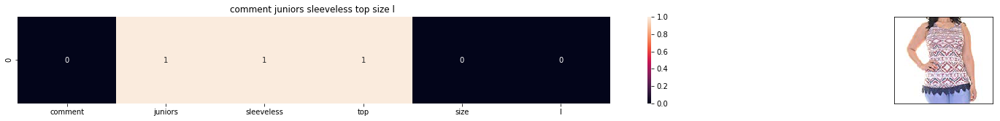

ASIN : B01N764SDX
Brand: No Comment
Title: comment juniors sleeveless top size l 
Euclidean similarity with the query image : 2.8284271247461903


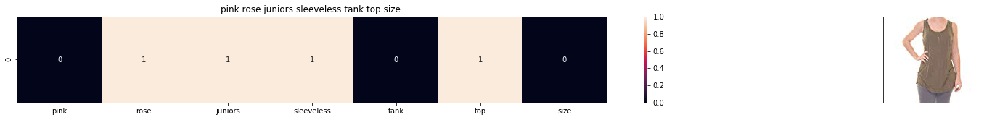

ASIN : B06XWXZJ45
Brand: PINK ROSE
Title: pink rose juniors sleeveless tank top size 
Euclidean similarity with the query image : 2.8284271247461903


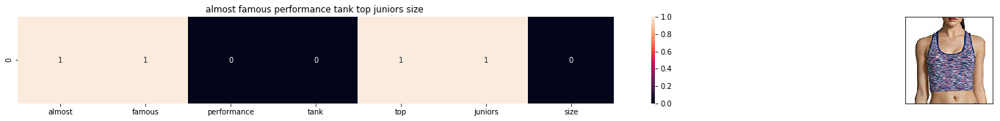

ASIN : B01N5EE096
Brand: Almost Famous
Title: almost famous performance tank top juniors size 
Euclidean similarity with the query image : 2.8284271247461903


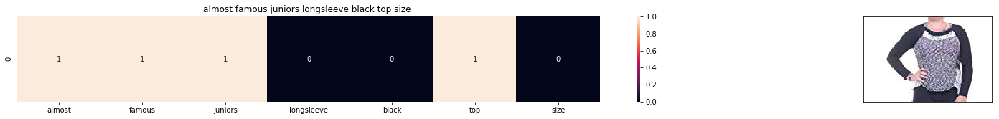

ASIN : B06XRPPVQC
Brand: Almost Famous
Title: almost famous juniors longsleeve black top size 
Euclidean similarity with the query image : 2.8284271247461903


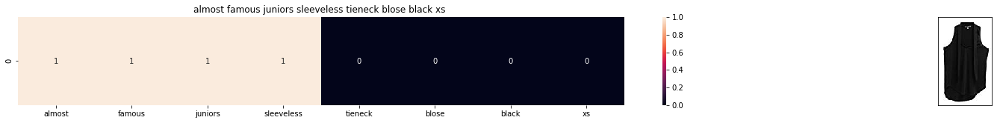

ASIN : B0745HMCJY
Brand: Almost Famous
Title: almost famous juniors sleeveless tieneck blose black xs 
Euclidean similarity with the query image : 3.0


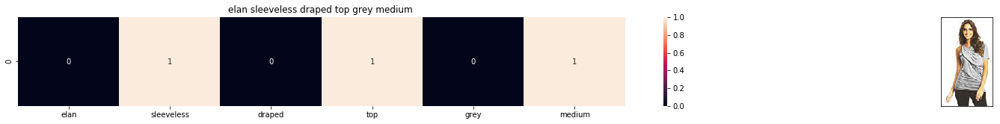

ASIN : B072HTQY64
Brand: ELAN
Title: elan sleeveless draped top grey medium 
Euclidean similarity with the query image : 3.0


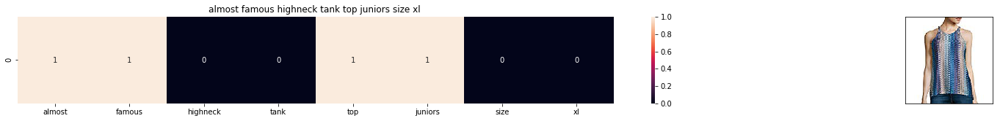

ASIN : B01MR9VMSE
Brand: Almost Famous
Title: almost famous highneck tank top juniors size xl 
Euclidean similarity with the query image : 3.0


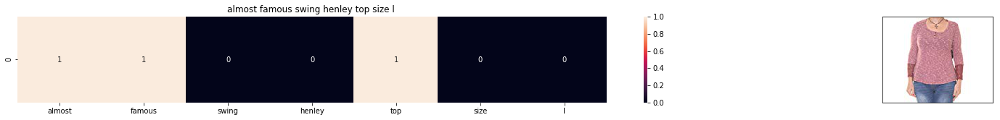

ASIN : B01MAZCL6C
Brand: Almost Famous
Title: almost famous swing henley top size l 
Euclidean similarity with the query image : 3.0


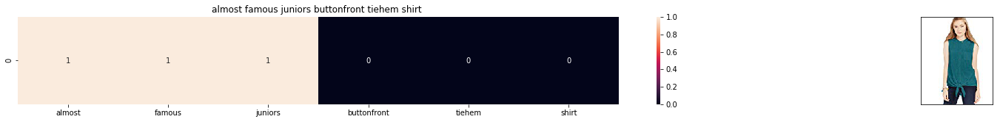

ASIN : B01L7D9KZY
Brand: Younique
Title: almost famous juniors buttonfront tiehem shirt 
Euclidean similarity with the query image : 3.0


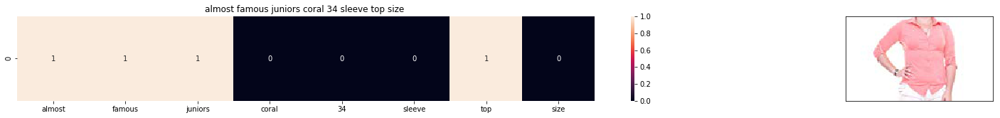

ASIN : B072NY56CZ
Brand: Almost Famous
Title: almost famous juniors coral 34 sleeve top size 
Euclidean similarity with the query image : 3.0


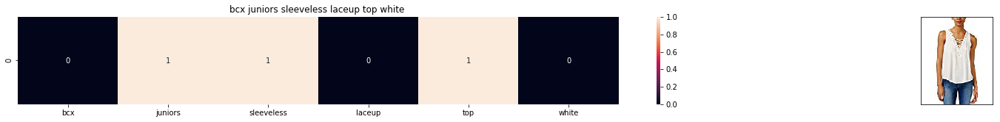

ASIN : B0713P6PKP
Brand: BCX
Title: bcx juniors sleeveless laceup top white 
Euclidean similarity with the query image : 3.0


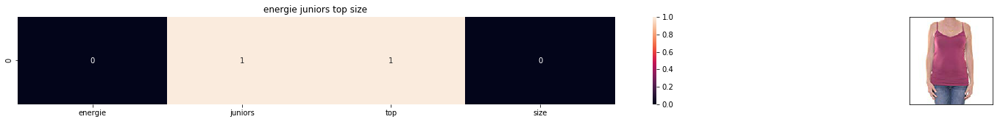

ASIN : B01LXDHZRT
Brand: Energie
Title: energie juniors top size 
Euclidean similarity with the query image : 3.0


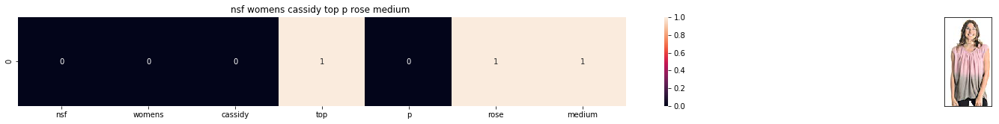

ASIN : B073C75L6C
Brand: F/S N
Title: nsf womens cassidy top p rose medium 
Euclidean similarity with the query image : 3.0


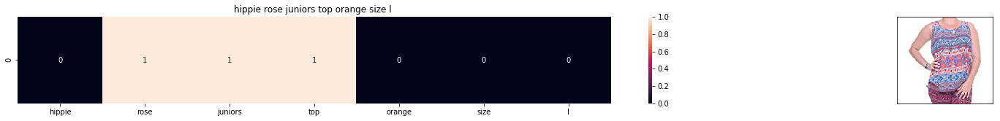

ASIN : B072F297YS
Brand: Hippie Rose
Title: hippie rose juniors top orange size l 
Euclidean similarity with the query image : 3.0


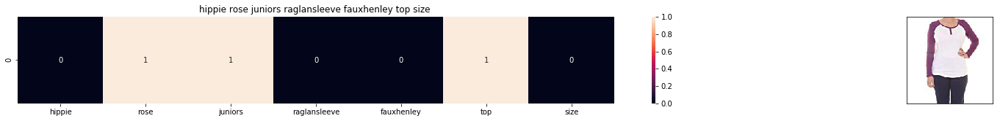

ASIN : B01M9GVBZY
Brand: Hippie Rose
Title: hippie rose juniors raglansleeve fauxhenley top size 
Euclidean similarity with the query image : 3.1622776601683795


In [8]:
#call the bag-of-words model for a product to get similar products.
bag_of_words_model(1152, 20) # change the index if you want to.

#try 12566
#try 931

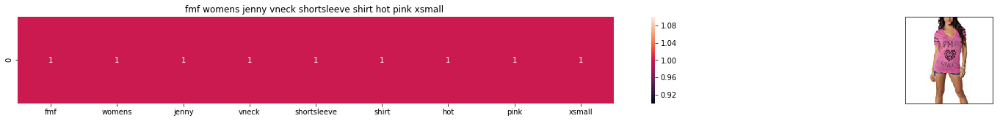

ASIN : B00HSDO8LO
Brand: FMF
Title: fmf womens jenny vneck shortsleeve shirt hot pink xsmall 
Euclidean similarity with the query image : 0.0


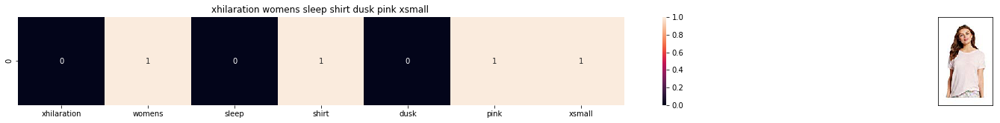

ASIN : B06Y1DD5R9
Brand: Xhilaration
Title: xhilaration womens sleep shirt dusk pink xsmall 
Euclidean similarity with the query image : 2.8284271247461903


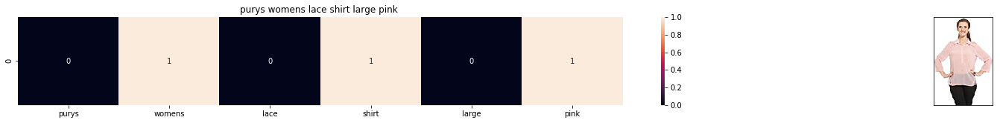

ASIN : B00X5ZS9NM
Brand: Purys
Title: purys womens lace shirt large pink 
Euclidean similarity with the query image : 3.0


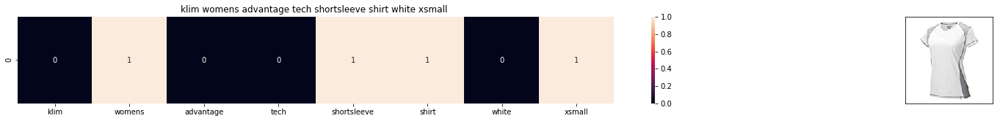

ASIN : B00NQDXMM6
Brand: Klim
Title: klim womens advantage tech shortsleeve shirt white xsmall 
Euclidean similarity with the query image : 3.0


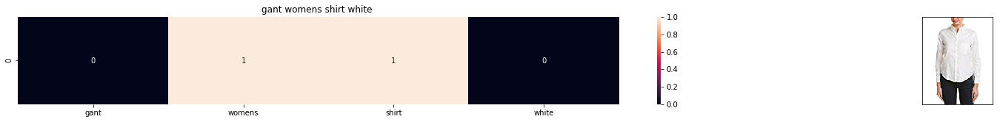

ASIN : B01N80ZGZX
Brand: GANT
Title: gant womens shirt white 
Euclidean similarity with the query image : 3.0


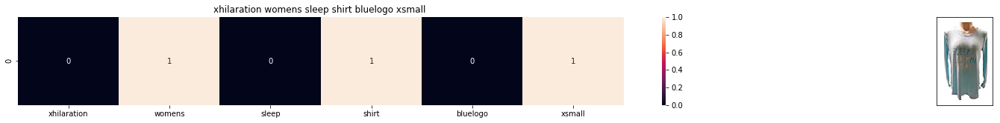

ASIN : B072369PPJ
Brand: Xhilaration
Title: xhilaration womens sleep shirt bluelogo xsmall 
Euclidean similarity with the query image : 3.0


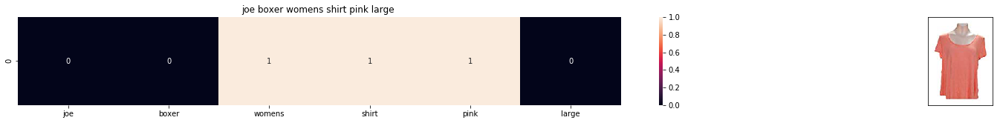

ASIN : B06XXPKHC3
Brand: Joe Boxer
Title: joe boxer womens shirt pink large 
Euclidean similarity with the query image : 3.0


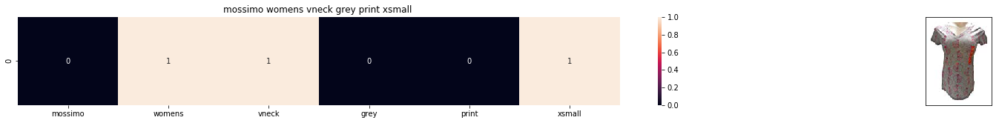

ASIN : B071R3MLRV
Brand: Mossimo
Title: mossimo womens vneck grey print xsmall 
Euclidean similarity with the query image : 3.0


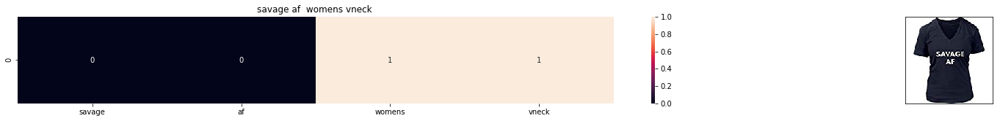

ASIN : B071ZZM42X
Brand: Savage AF
Title: savage af  womens vneck 
Euclidean similarity with the query image : 3.0


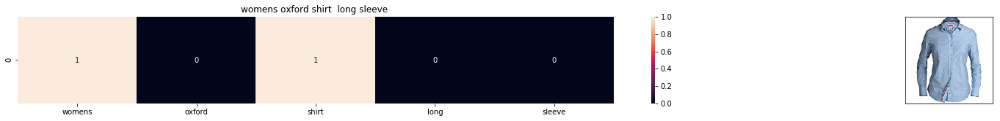

ASIN : B01577JZOC
Brand: Boast
Title: womens oxford shirt  long sleeve 
Euclidean similarity with the query image : 3.1622776601683795


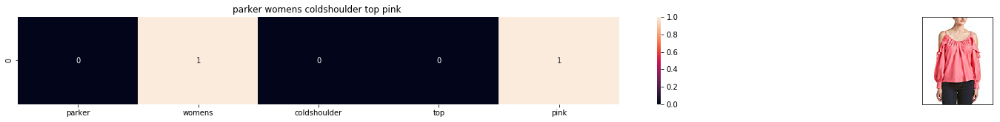

ASIN : B01MZ735IP
Brand: Parker
Title: parker womens coldshoulder top pink 
Euclidean similarity with the query image : 3.1622776601683795


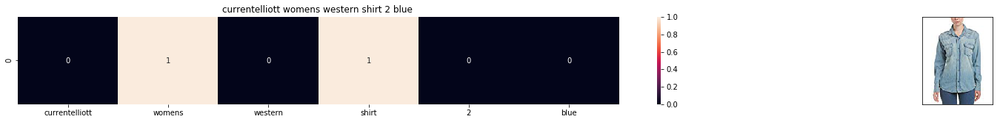

ASIN : B071KFYN7R
Brand: Current/Elliott
Title: currentelliott womens western shirt 2 blue 
Euclidean similarity with the query image : 3.1622776601683795


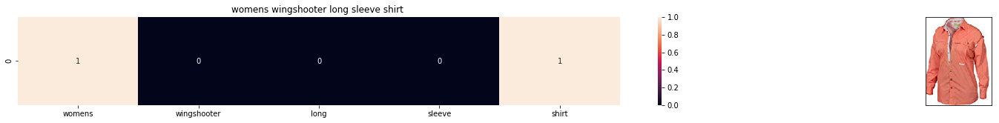

ASIN : B01BNWY6CQ
Brand: Drake
Title: womens wingshooter long sleeve shirt 
Euclidean similarity with the query image : 3.1622776601683795


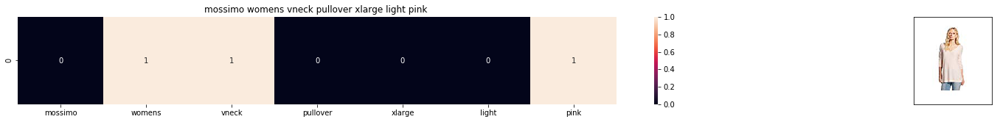

ASIN : B01LX0BW3U
Brand: Mossimo
Title: mossimo womens vneck pullover xlarge light pink 
Euclidean similarity with the query image : 3.1622776601683795


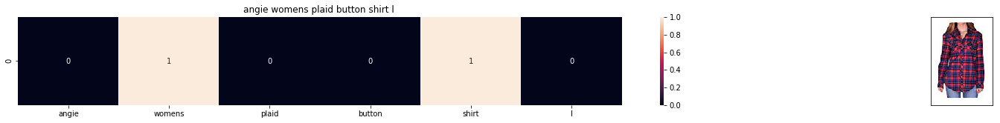

ASIN : B06XKHQ5P5
Brand: Angie
Title: angie womens plaid button shirt l 
Euclidean similarity with the query image : 3.1622776601683795


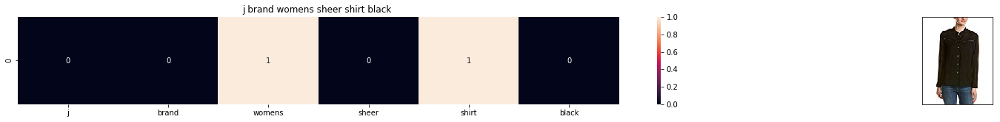

ASIN : B013L1V8PK
Brand: J Brand Jeans
Title: j brand womens sheer shirt black 
Euclidean similarity with the query image : 3.1622776601683795


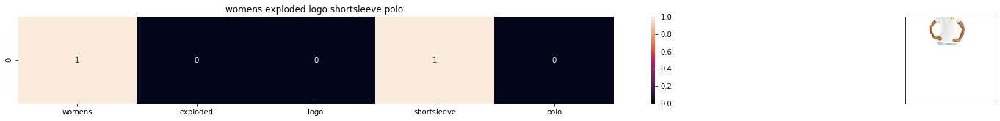

ASIN : B004KPUL78
Brand: Under Armour
Title: womens exploded logo shortsleeve polo 
Euclidean similarity with the query image : 3.1622776601683795


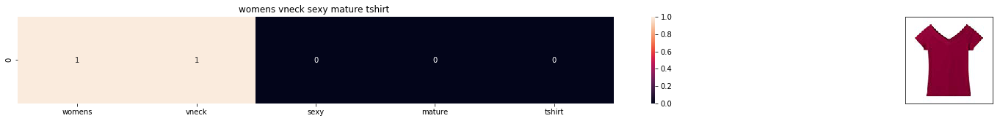

ASIN : B074KBRNX5
Brand: Sunshine
Title: womens vneck sexy mature tshirt 
Euclidean similarity with the query image : 3.1622776601683795


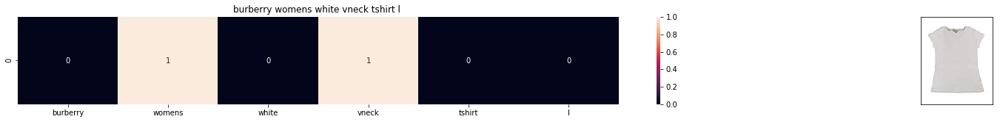

ASIN : B072YLH4NS
Brand: BURBERRY
Title: burberry womens white vneck tshirt l 
Euclidean similarity with the query image : 3.1622776601683795


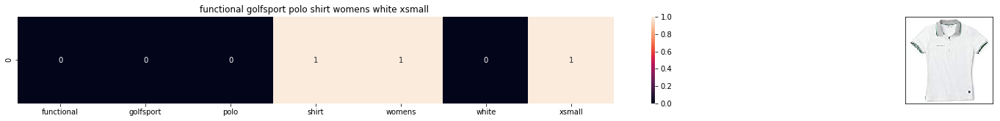

ASIN : B00E4O3U0A
Brand: BMW
Title: functional golfsport polo shirt womens white xsmall 
Euclidean similarity with the query image : 3.1622776601683795


In [9]:
bag_of_words_model(104, 20)

## [8.5] TF-IDF based product similarity

In [10]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])
# tfidf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc

In [11]:
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)


# Lets get similar products for product ID 1152 and 104 using TFIDF

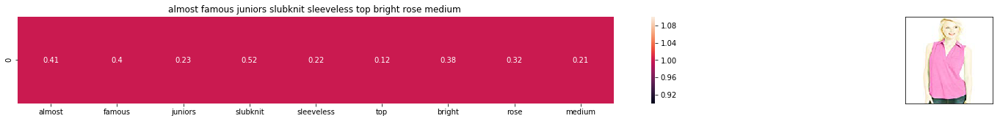

ASIN : B01CO4GLPM
BRAND : Almost Famous
Eucliden distance from the given image : 0.0


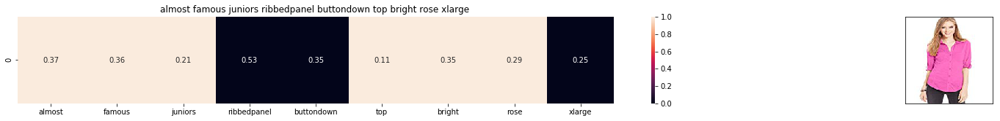

ASIN : B01CEUX0MI
BRAND : Almost Famous
Eucliden distance from the given image : 0.9085229124135179


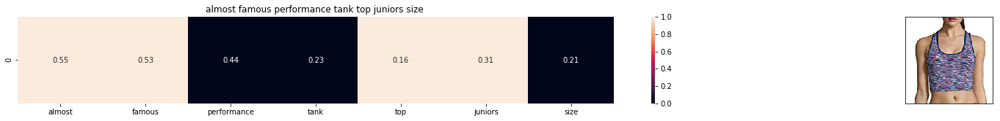

ASIN : B01N5EE096
BRAND : Almost Famous
Eucliden distance from the given image : 0.9721825542643368


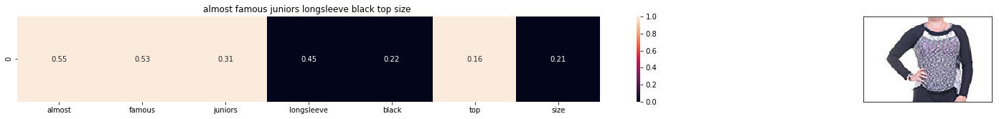

ASIN : B06XRPPVQC
BRAND : Almost Famous
Eucliden distance from the given image : 0.9731895292659414


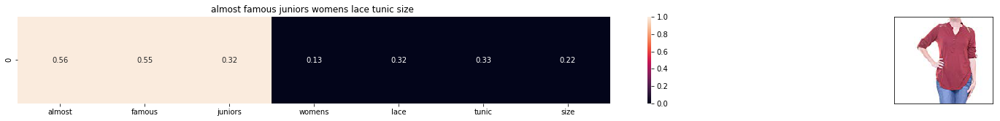

ASIN : B07289SXLV
BRAND : Almost Famous
Eucliden distance from the given image : 0.9758479643801911


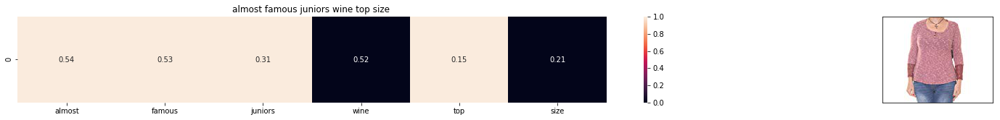

ASIN : B01M3RLP9B
BRAND : Almost Famous
Eucliden distance from the given image : 0.979812683222718


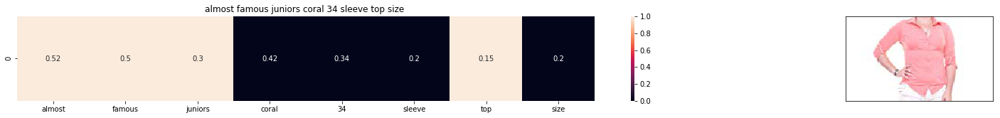

ASIN : B072NY56CZ
BRAND : Almost Famous
Eucliden distance from the given image : 1.0033504739815338


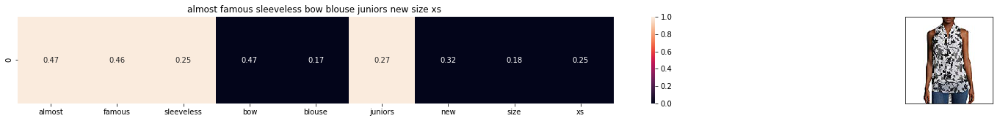

ASIN : B01M0NO52G
BRAND : Almost Famous
Eucliden distance from the given image : 1.0127984736775641


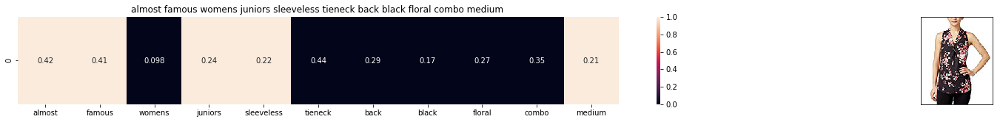

ASIN : B0738FTV95
BRAND : Almost Famous
Eucliden distance from the given image : 1.0220504572280016


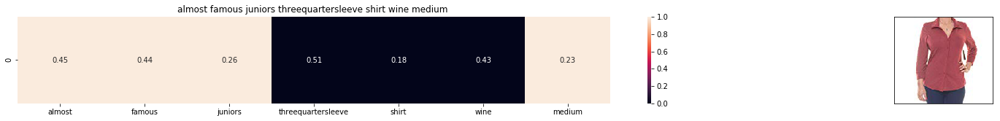

ASIN : B01MTRWVKO
BRAND : Almost Famous
Eucliden distance from the given image : 1.031573744138495


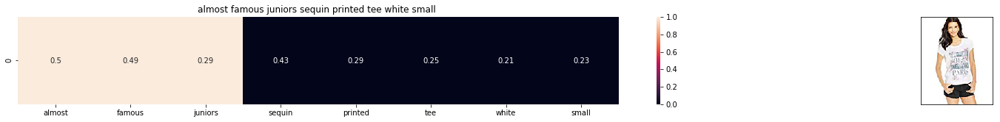

ASIN : B06XXQX6PJ
BRAND : Almost Famous
Eucliden distance from the given image : 1.034943465972535


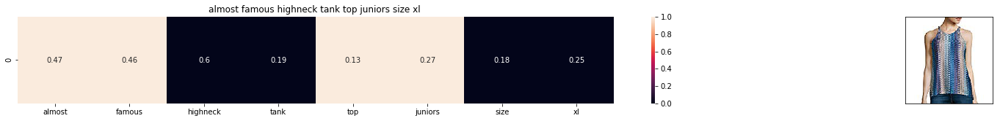

ASIN : B01MR9VMSE
BRAND : Almost Famous
Eucliden distance from the given image : 1.0496141281917752


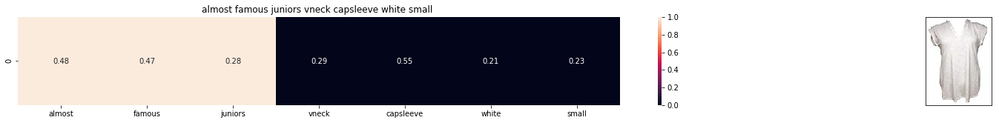

ASIN : B071HKKXW2
BRAND : Almost Famous
Eucliden distance from the given image : 1.0529162058321184


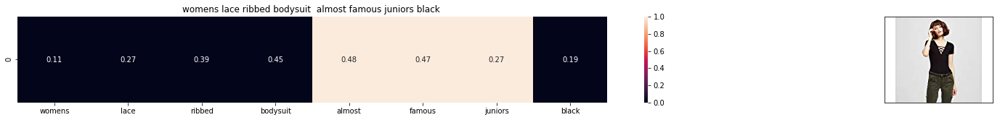

ASIN : B07582154N
BRAND : Almost Famous
Eucliden distance from the given image : 1.055059084324561


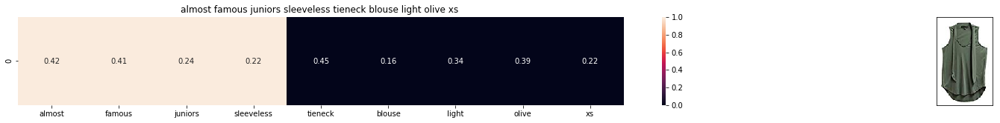

ASIN : B074R1JPF6
BRAND : Almost Famous
Eucliden distance from the given image : 1.0576678764339305


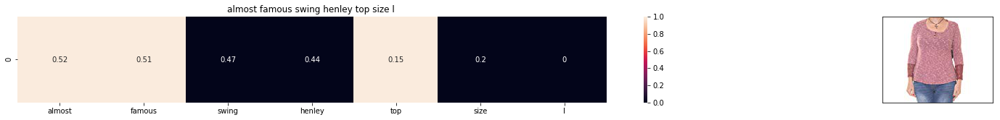

ASIN : B01MAZCL6C
BRAND : Almost Famous
Eucliden distance from the given image : 1.0685128873726255


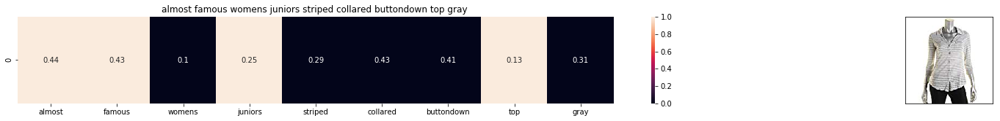

ASIN : B01M64P61L
BRAND : Almost Famous
Eucliden distance from the given image : 1.0734384014532719


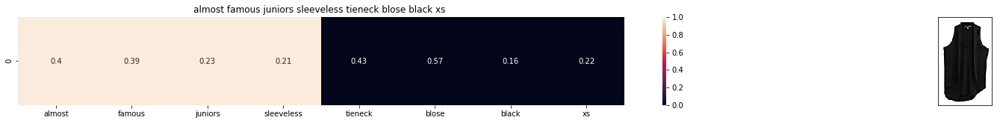

ASIN : B0745HMCJY
BRAND : Almost Famous
Eucliden distance from the given image : 1.0749458166966375


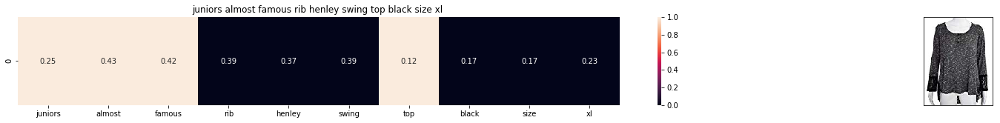

ASIN : B072M2W79L
BRAND : Almost Famous
Eucliden distance from the given image : 1.0791245983623547


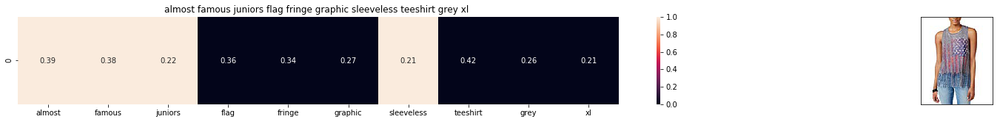

ASIN : B072BLFQDL
BRAND : Almost Famous
Eucliden distance from the given image : 1.0880359451497204


In [12]:
tfidf_model(1152, 20)
# in the output heat map each value represents the tfidf values of the label word, 
#the color represents the intersection with inputs title

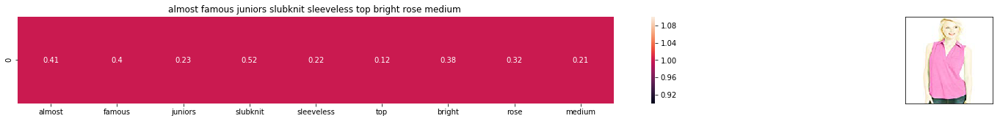

ASIN : B01CO4GLPM
BRAND : Almost Famous
Eucliden distance from the given image : 0.0


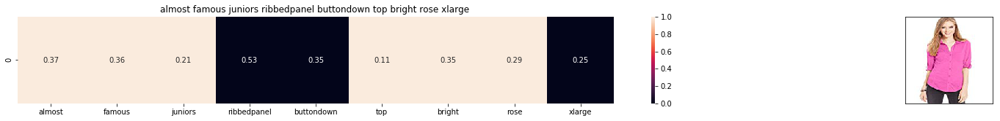

ASIN : B01CEUX0MI
BRAND : Almost Famous
Eucliden distance from the given image : 0.9085229124135179


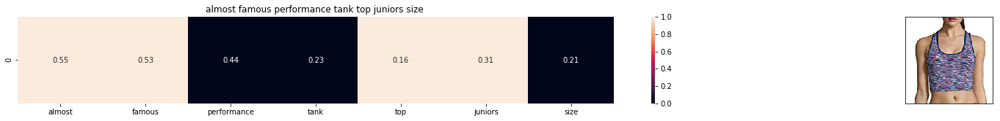

ASIN : B01N5EE096
BRAND : Almost Famous
Eucliden distance from the given image : 0.9721825542643368


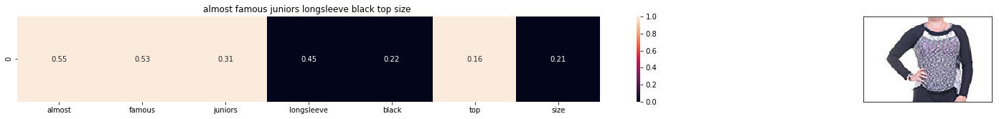

ASIN : B06XRPPVQC
BRAND : Almost Famous
Eucliden distance from the given image : 0.9731895292659414


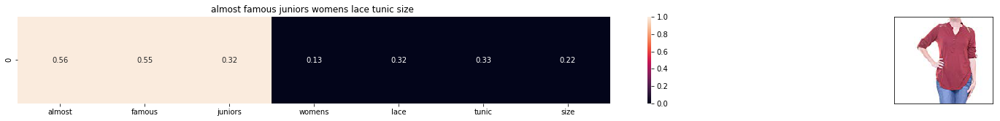

ASIN : B07289SXLV
BRAND : Almost Famous
Eucliden distance from the given image : 0.9758479643801911


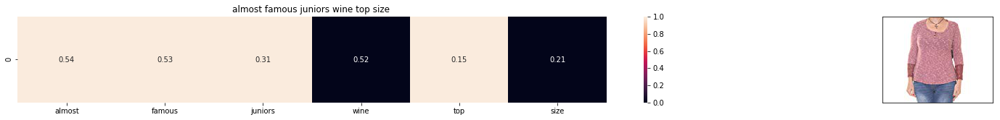

ASIN : B01M3RLP9B
BRAND : Almost Famous
Eucliden distance from the given image : 0.979812683222718


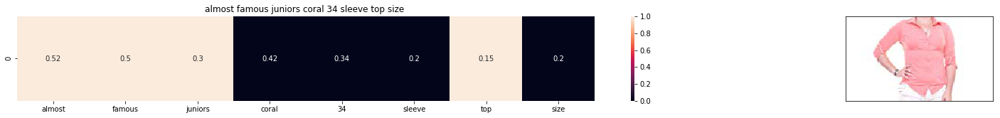

ASIN : B072NY56CZ
BRAND : Almost Famous
Eucliden distance from the given image : 1.0033504739815338


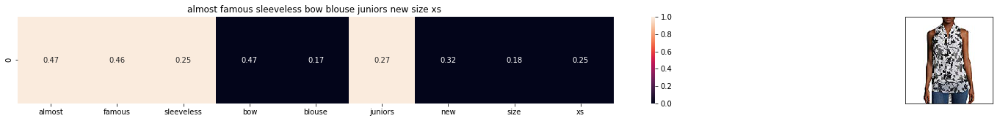

ASIN : B01M0NO52G
BRAND : Almost Famous
Eucliden distance from the given image : 1.0127984736775641


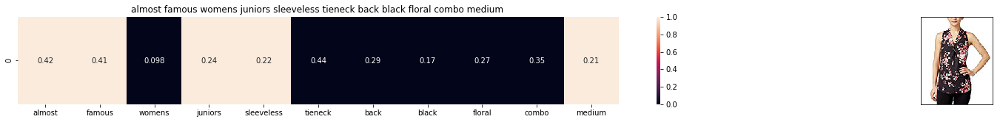

ASIN : B0738FTV95
BRAND : Almost Famous
Eucliden distance from the given image : 1.0220504572280016


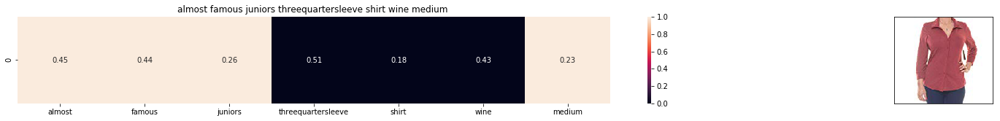

ASIN : B01MTRWVKO
BRAND : Almost Famous
Eucliden distance from the given image : 1.031573744138495


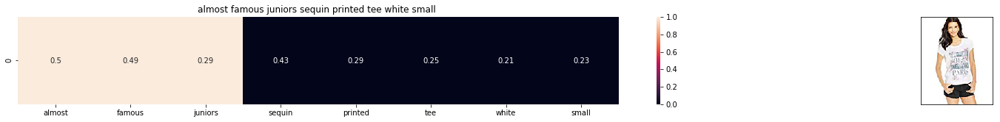

ASIN : B06XXQX6PJ
BRAND : Almost Famous
Eucliden distance from the given image : 1.034943465972535


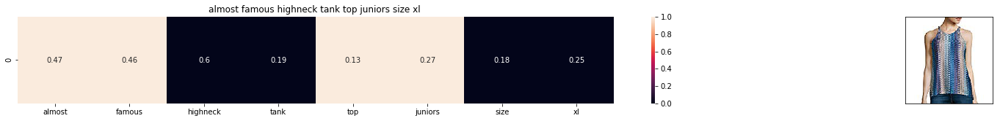

ASIN : B01MR9VMSE
BRAND : Almost Famous
Eucliden distance from the given image : 1.0496141281917752


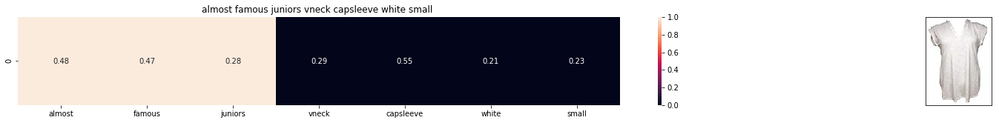

ASIN : B071HKKXW2
BRAND : Almost Famous
Eucliden distance from the given image : 1.0529162058321184


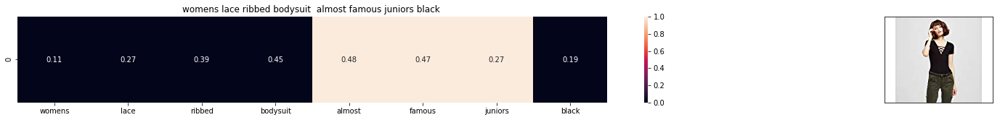

ASIN : B07582154N
BRAND : Almost Famous
Eucliden distance from the given image : 1.055059084324561


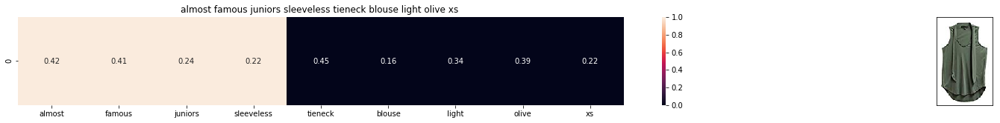

ASIN : B074R1JPF6
BRAND : Almost Famous
Eucliden distance from the given image : 1.0576678764339305


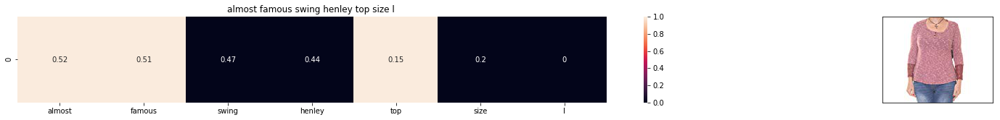

ASIN : B01MAZCL6C
BRAND : Almost Famous
Eucliden distance from the given image : 1.0685128873726255


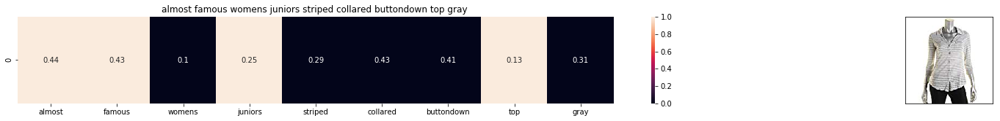

ASIN : B01M64P61L
BRAND : Almost Famous
Eucliden distance from the given image : 1.0734384014532719


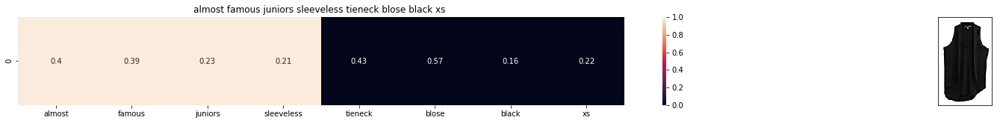

ASIN : B0745HMCJY
BRAND : Almost Famous
Eucliden distance from the given image : 1.0749458166966375


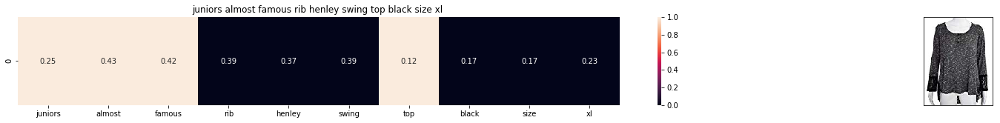

ASIN : B072M2W79L
BRAND : Almost Famous
Eucliden distance from the given image : 1.0791245983623547


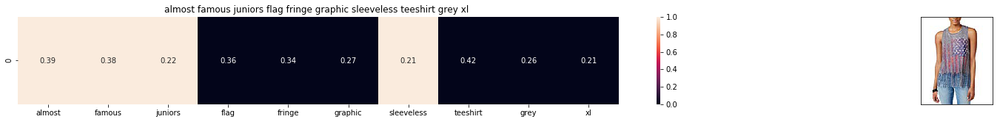

ASIN : B072BLFQDL
BRAND : Almost Famous
Eucliden distance from the given image : 1.0880359451497204


In [13]:
tfidf_model(1152, 20)

## [8.5] IDF based product similarity

In [168]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

In [169]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [170]:
# we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
       
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        

In [171]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
        

# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

# Lets get similar products for product ID 1152 and 104 using IDF

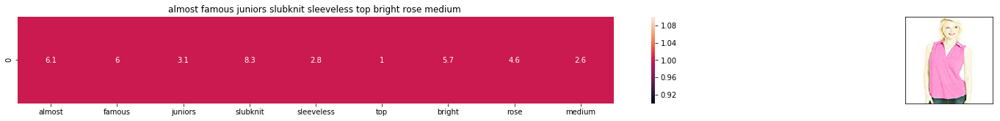

ASIN : B01CO4GLPM
Brand : Almost Famous
euclidean distance from the given image : 0.0


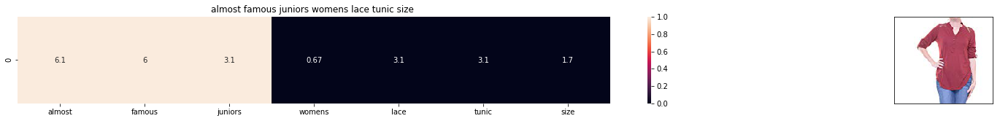

ASIN : B07289SXLV
Brand : Almost Famous
euclidean distance from the given image : 12.671037527221781


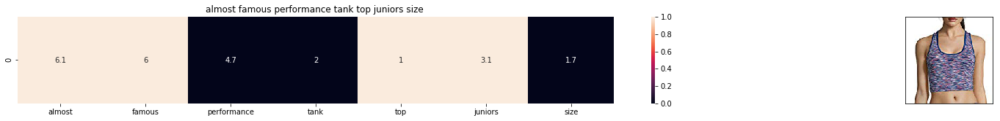

ASIN : B01N5EE096
Brand : Almost Famous
euclidean distance from the given image : 12.885260070678425


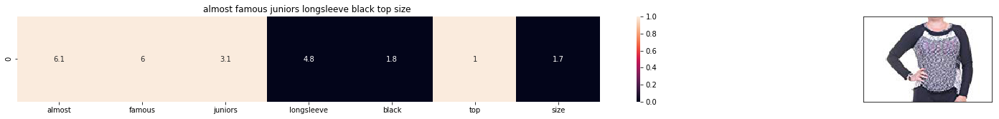

ASIN : B06XRPPVQC
Brand : Almost Famous
euclidean distance from the given image : 12.910606513463065


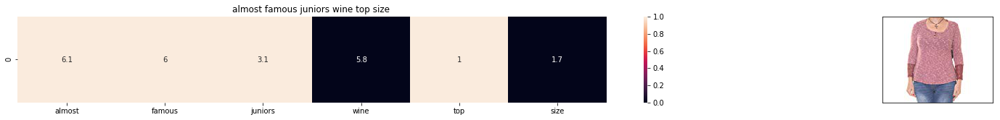

ASIN : B01M3RLP9B
Brand : Almost Famous
euclidean distance from the given image : 13.183505633575624


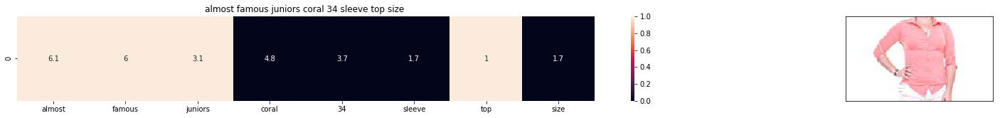

ASIN : B072NY56CZ
Brand : Almost Famous
euclidean distance from the given image : 13.398767995572548


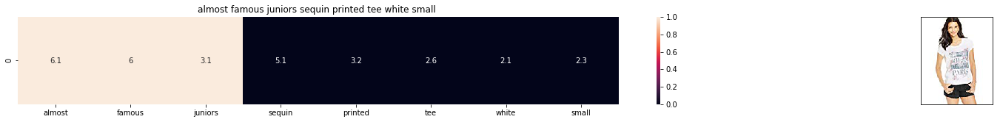

ASIN : B06XXQX6PJ
Brand : Almost Famous
euclidean distance from the given image : 13.779560362021115


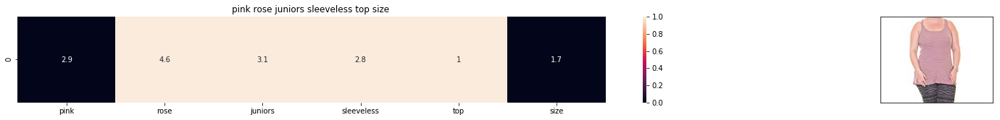

ASIN : B01MG5KJCQ
Brand : PINK ROSE
euclidean distance from the given image : 13.883575680183178


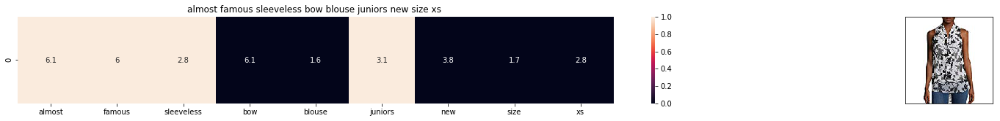

ASIN : B01M0NO52G
Brand : Almost Famous
euclidean distance from the given image : 14.00501109116014


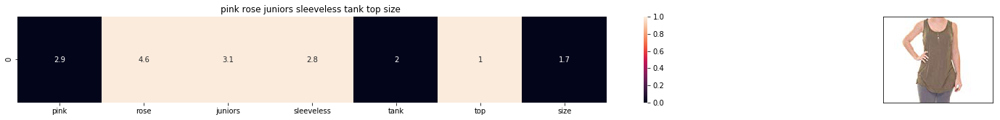

ASIN : B06XWXZJ45
Brand : PINK ROSE
euclidean distance from the given image : 14.020660813147344


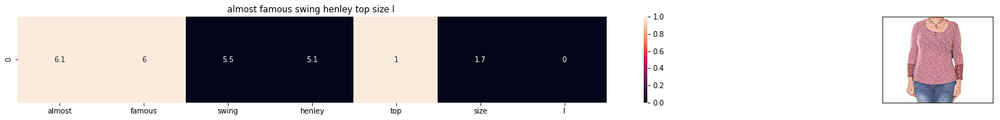

ASIN : B01MAZCL6C
Brand : Almost Famous
euclidean distance from the given image : 14.309679379862494


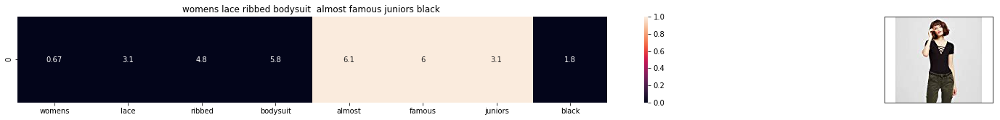

ASIN : B07582154N
Brand : Almost Famous
euclidean distance from the given image : 14.415085980475057


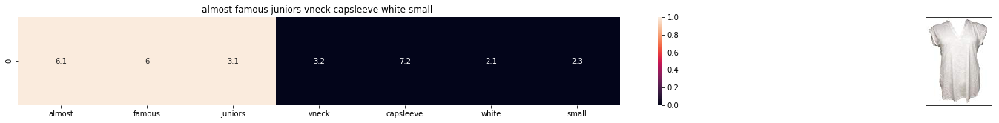

ASIN : B071HKKXW2
Brand : Almost Famous
euclidean distance from the given image : 14.497077506452907


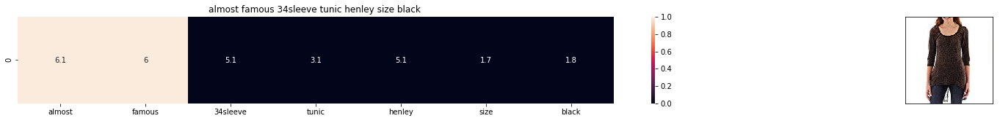

ASIN : B01I2IRKLI
Brand : Almost Famous
euclidean distance from the given image : 14.649243693941434


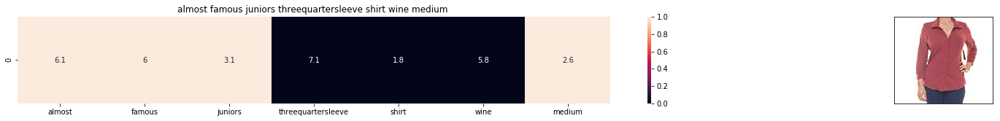

ASIN : B01MTRWVKO
Brand : Almost Famous
euclidean distance from the given image : 14.778666937214103


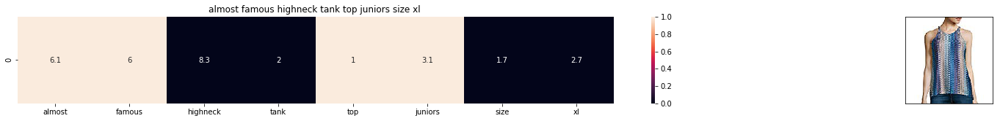

ASIN : B01MR9VMSE
Brand : Almost Famous
euclidean distance from the given image : 14.841421856243489


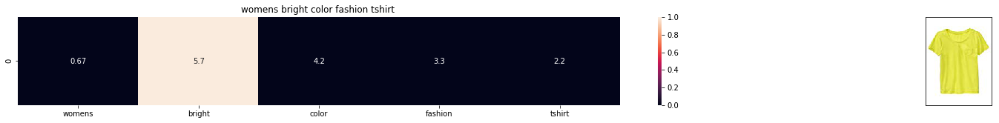

ASIN : B074KTZ1HN
Brand : Magic
euclidean distance from the given image : 14.894622050967977


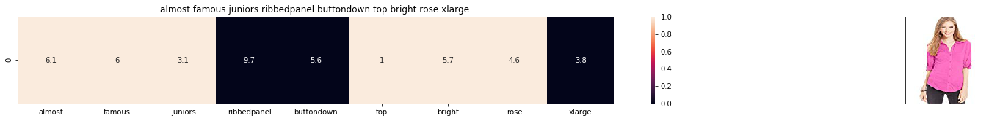

ASIN : B01CEUX0MI
Brand : Almost Famous
euclidean distance from the given image : 14.95951600601709


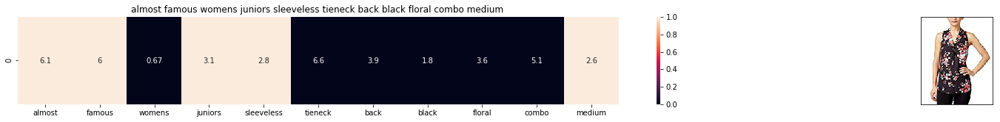

ASIN : B0738FTV95
Brand : Almost Famous
euclidean distance from the given image : 14.983946979817423


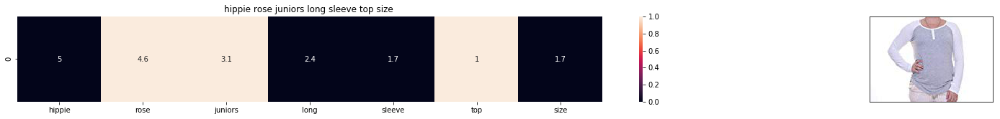

ASIN : B071YPFKN2
Brand : Hippie Rose
euclidean distance from the given image : 15.025857102683675


In [174]:
idf_model(1152,20)

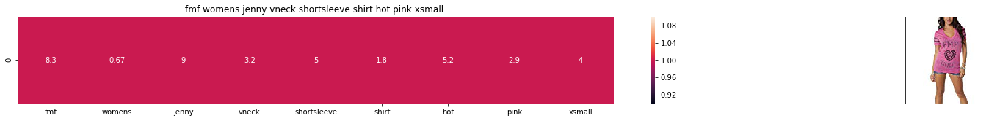

ASIN : B00HSDO8LO
Brand : FMF
euclidean distance from the given image : 0.0


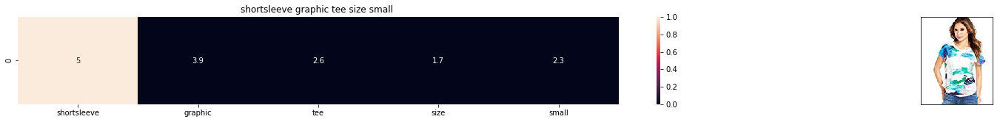

ASIN : B01L2ZTKFM
Brand : One Clothing
euclidean distance from the given image : 15.699169375179116


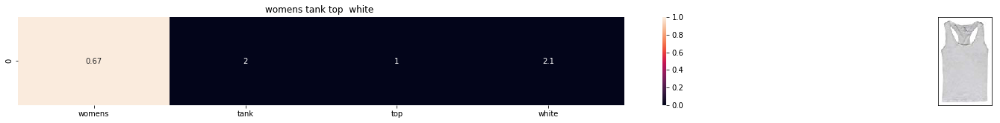

ASIN : B00JPOZ9GM
Brand : Sofra
euclidean distance from the given image : 15.7963798659663


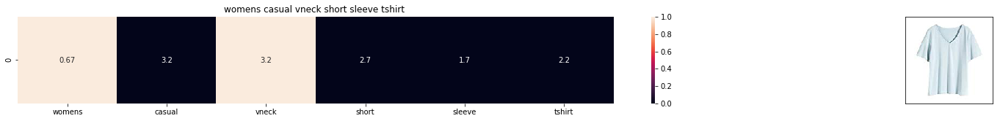

ASIN : B074V45DCX
Brand : Rain
euclidean distance from the given image : 15.974207116811751


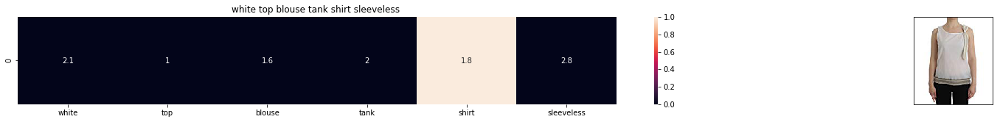

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
euclidean distance from the given image : 16.02991177140063


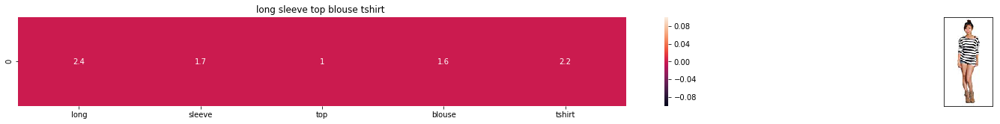

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from the given image : 16.06313941394237


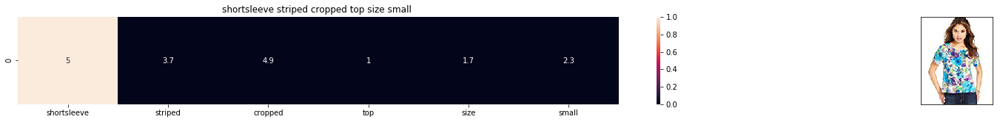

ASIN : B01L2ZE6QK
Brand : One Clothing
euclidean distance from the given image : 16.22998446342123


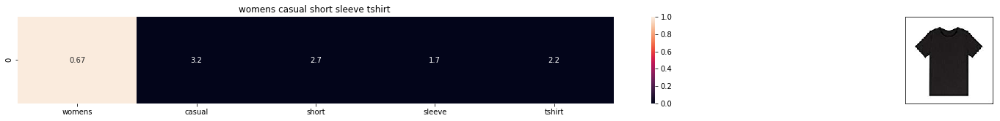

ASIN : B074T9KG9Q
Brand : Rain
euclidean distance from the given image : 16.300422935771415


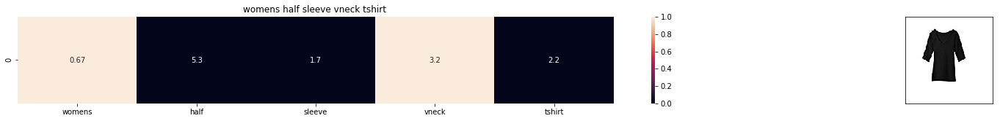

ASIN : B074W2LPYR
Brand : SNOW
euclidean distance from the given image : 16.318024304267144


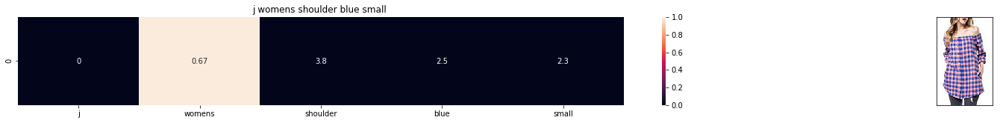

ASIN : B07583CQFT
Brand : Very J
euclidean distance from the given image : 16.33116738116125


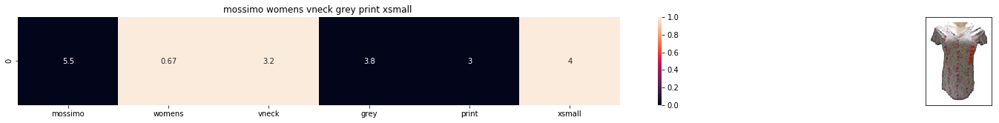

ASIN : B071R3MLRV
Brand : Mossimo
euclidean distance from the given image : 16.371820272313467


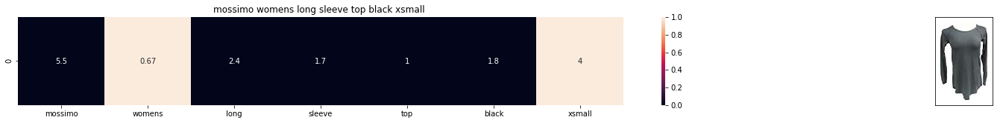

ASIN : B07173L752
Brand : Mossimo
euclidean distance from the given image : 16.37510359837592


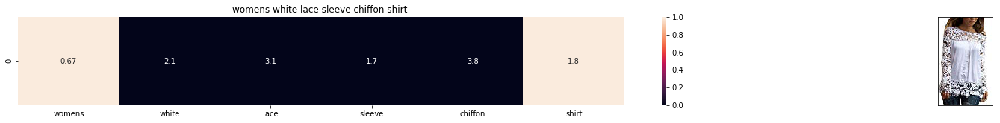

ASIN : B073JWSM1V
Brand : Fuming
euclidean distance from the given image : 16.38815983717403


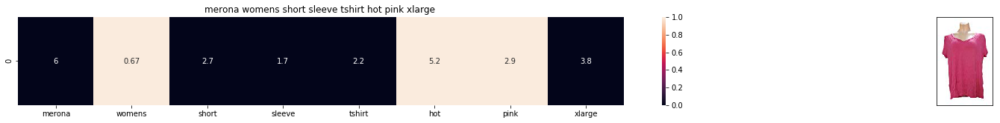

ASIN : B06XYNTBRH
Brand : Merona
euclidean distance from the given image : 16.437464360973433


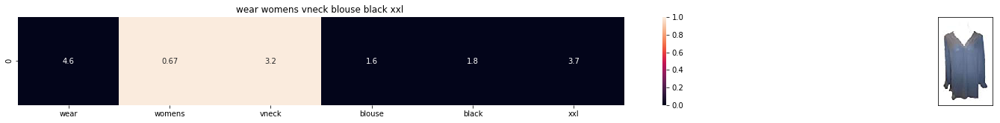

ASIN : B06Y6FH453
Brand : Who What Wear
euclidean distance from the given image : 16.449502913354642


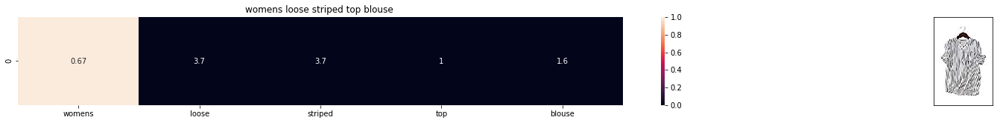

ASIN : B00ZZMYBRG
Brand : HP-LEISURE
euclidean distance from the given image : 16.48209975830143


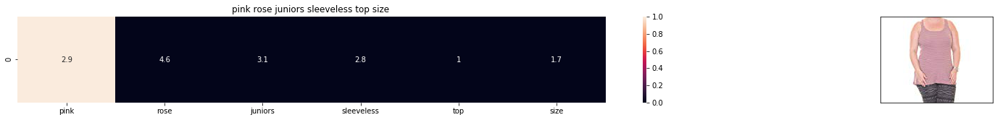

ASIN : B01MG5KJCQ
Brand : PINK ROSE
euclidean distance from the given image : 16.57777791967016


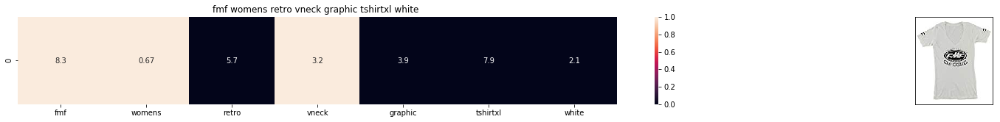

ASIN : B01N9TP2LB
Brand : FMF
euclidean distance from the given image : 16.59909718412104


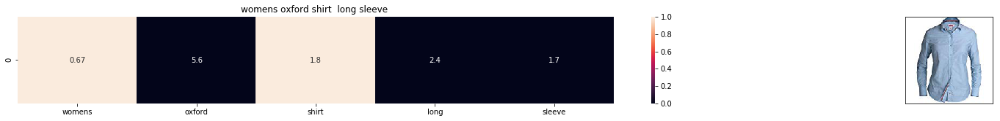

ASIN : B01577JZOC
Brand : Boast
euclidean distance from the given image : 16.64490535407758


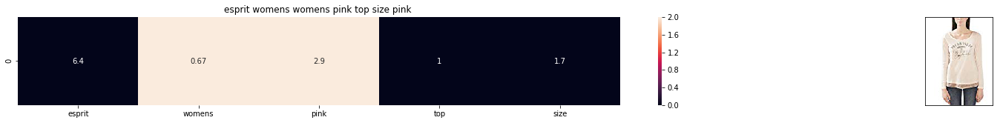

ASIN : B01N408GQ0
Brand : Esprit
euclidean distance from the given image : 16.650903366082236


In [175]:
idf_model(104,20)

# [9] Text Semantics based product similarity

In [176]:

# credits: https://www.kaggle.com/c/word2vec-nlp-tutorial#part-2-word-vectors
# Custom Word2Vec using your own text data.
# Do NOT RUN this code.
# It is meant as a reference to build your own Word2Vec when you have 
# lots of data.

'''
# Set values for various parameters
num_features = 300    # Word vector dimensionality                      
min_word_count = 1    # Minimum word count                        
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size                                                                                    
downsampling = 1e-3   # Downsample setting for frequent words

# Initialize and train the model (this will take some time)
from gensim.models import word2vec
print ("Training model...")
model = word2vec.Word2Vec(sen_corpus, workers=num_workers, \
            size=num_features, min_count = min_word_count, \
            window = context)
    
'''

'\n# Set values for various parameters\nnum_features = 300    # Word vector dimensionality                      \nmin_word_count = 1    # Minimum word count                        \nnum_workers = 4       # Number of threads to run in parallel\ncontext = 10          # Context window size                                                                                    \ndownsampling = 1e-3   # Downsample setting for frequent words\n\n# Initialize and train the model (this will take some time)\nfrom gensim.models import word2vec\nprint ("Training model...")\nmodel = word2vec.Word2Vec(sen_corpus, workers=num_workers,             size=num_features, min_count = min_word_count,             window = context)\n    \n'

In [177]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

# in this project we are using a pretrained model by google
# its 3.3G file, once you load this into your memory 
# it occupies ~9Gb, so please do this step only if you have >12G of ram
# we will provide a pickle file wich contains a dict , 
# and it contains all our courpus words as keys and  model[word] as values
# To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# it's 1.9GB in size.

'''
model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
'''

#if you do NOT have RAM >= 12GB, use the code below.
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [178]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [179]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

### [9.2] Average Word2Vec product similarity.

In [180]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)


In [181]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        

# in the give heat map, each cell contains the euclidean distance between words i, j

 # Lets get similar products for product ID 1152 and 104 using Avg W2V

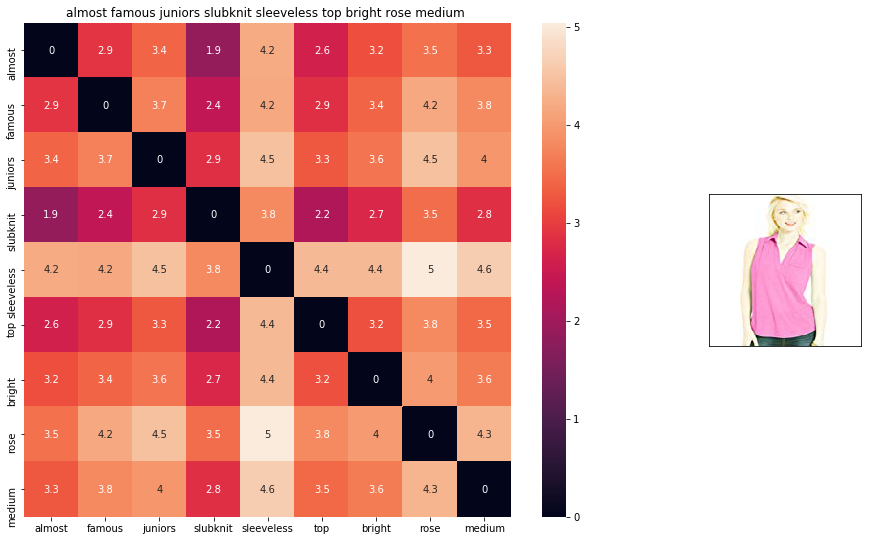

ASIN : B01CO4GLPM
BRAND : Almost Famous
euclidean distance from given input image : 0.0


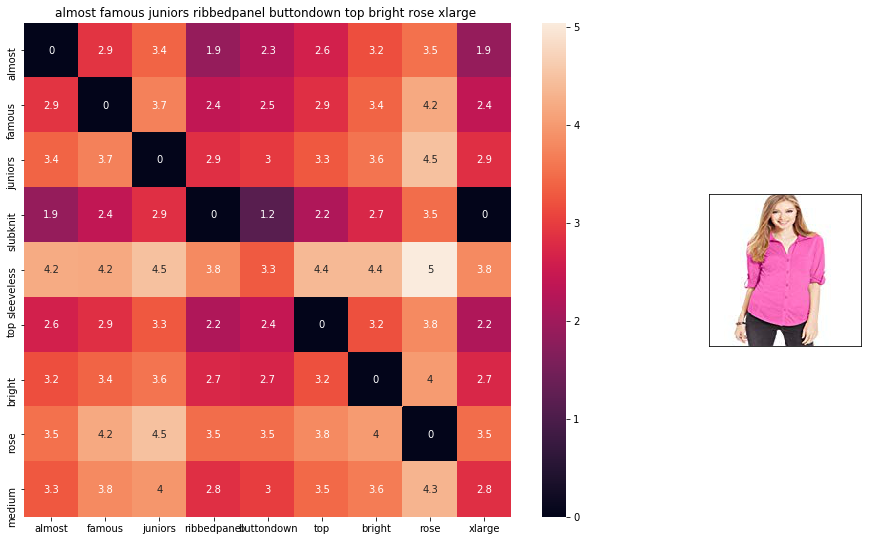

ASIN : B01CEUX0MI
BRAND : Almost Famous
euclidean distance from given input image : 0.4936696


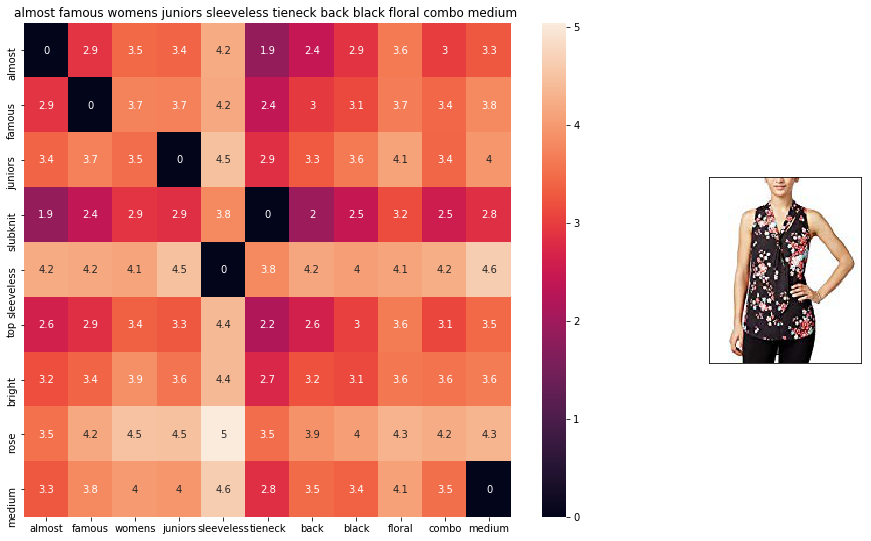

ASIN : B0738FTV95
BRAND : Almost Famous
euclidean distance from given input image : 0.7244961


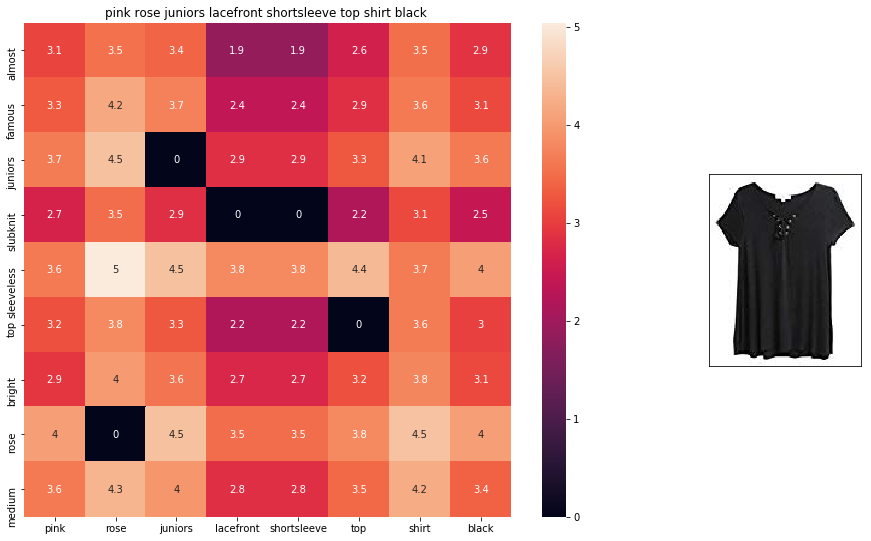

ASIN : B074RL282M
BRAND : PINK ROSE
euclidean distance from given input image : 0.7366627


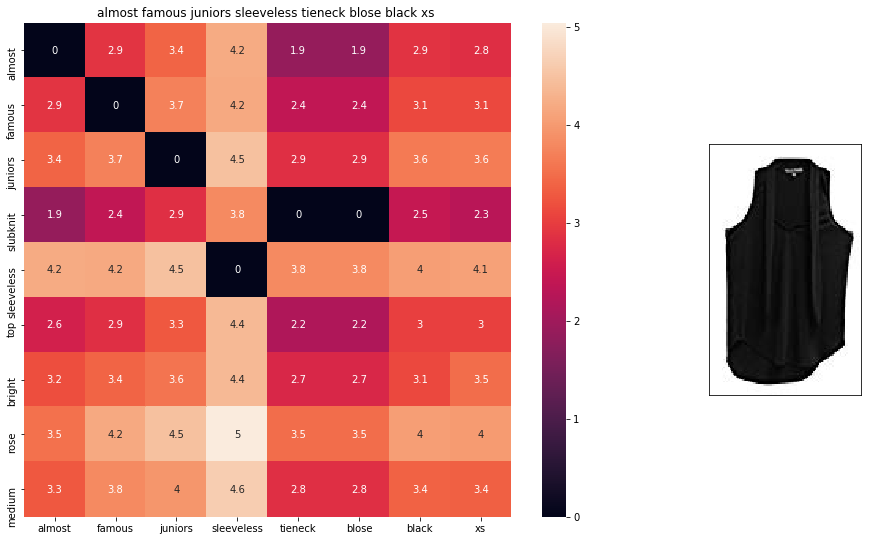

ASIN : B0745HMCJY
BRAND : Almost Famous
euclidean distance from given input image : 0.74822015


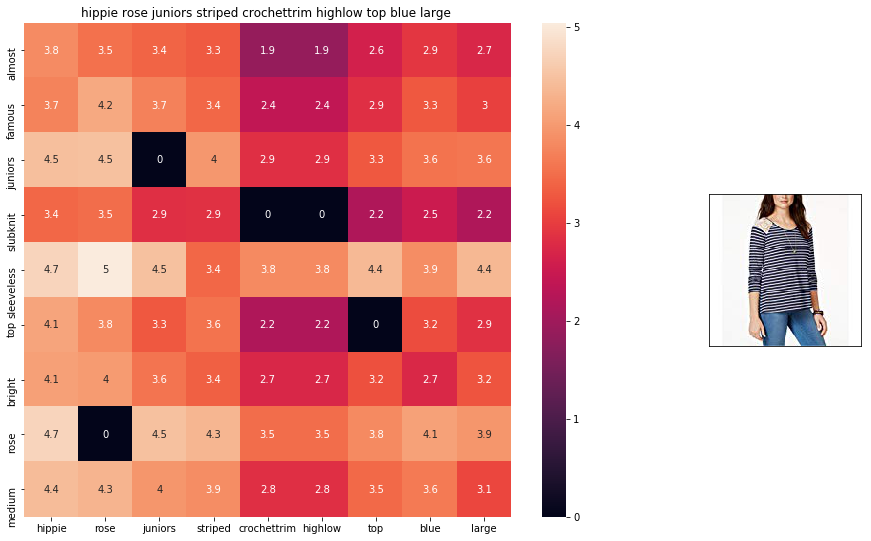

ASIN : B01N2GUQJI
BRAND : Hippie Rose
euclidean distance from given input image : 0.75492275


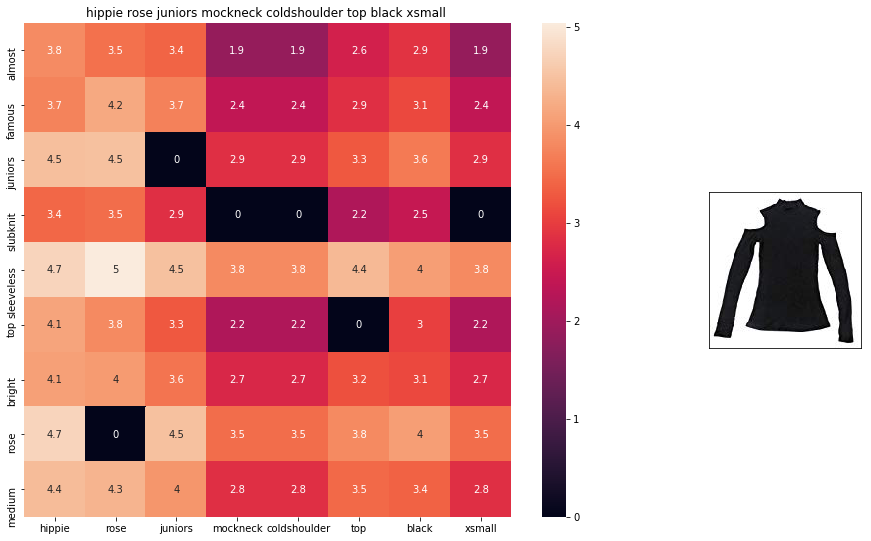

ASIN : B073DJFYG1
BRAND : Hippie Rose
euclidean distance from given input image : 0.7634584


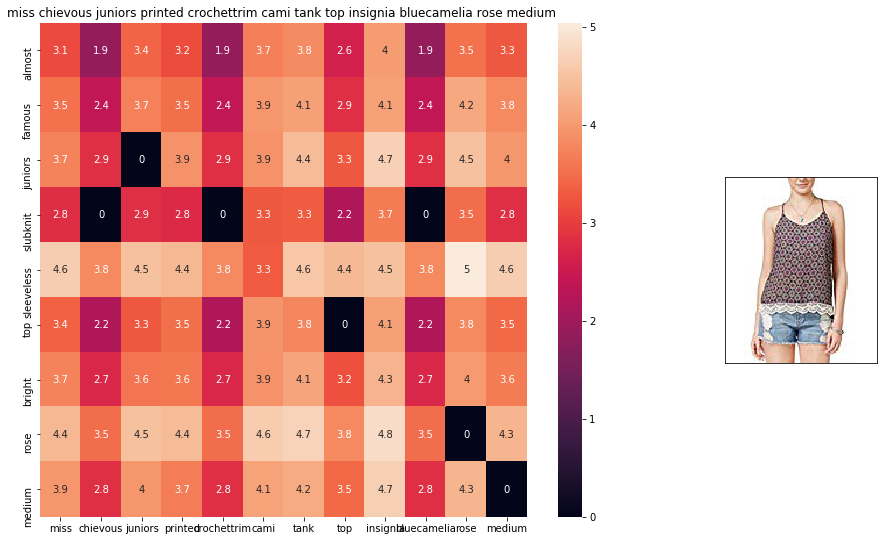

ASIN : B072TBP5FL
BRAND : Miss Chievous
euclidean distance from given input image : 0.7675409


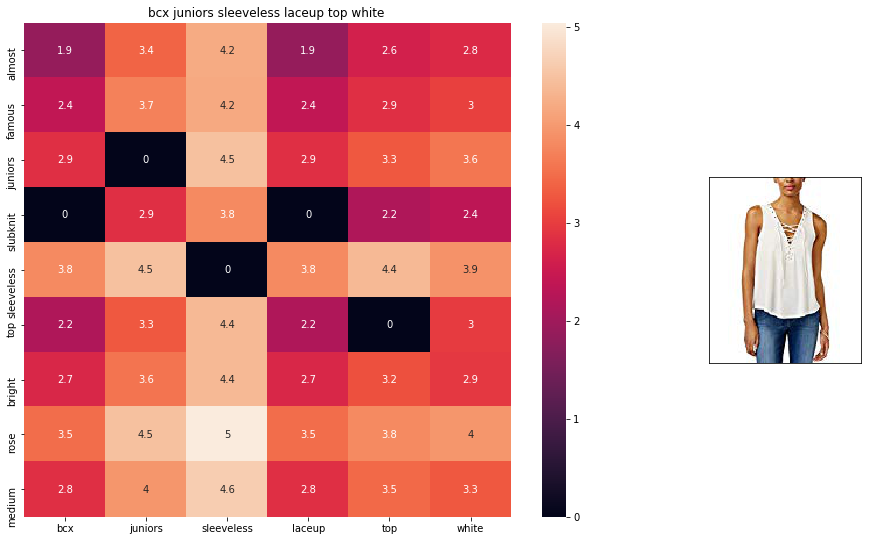

ASIN : B0713P6PKP
BRAND : BCX
euclidean distance from given input image : 0.77216387


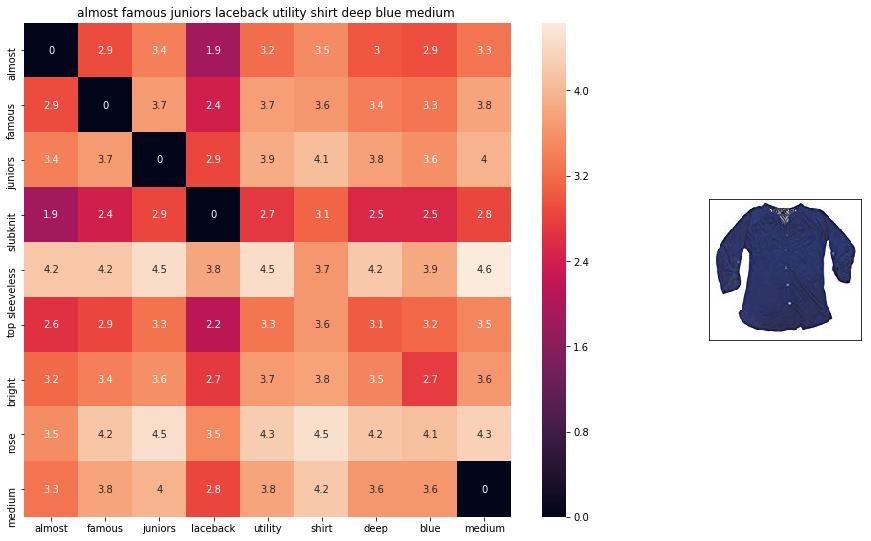

ASIN : B074RJZPN1
BRAND : Almost Famous
euclidean distance from given input image : 0.7755765


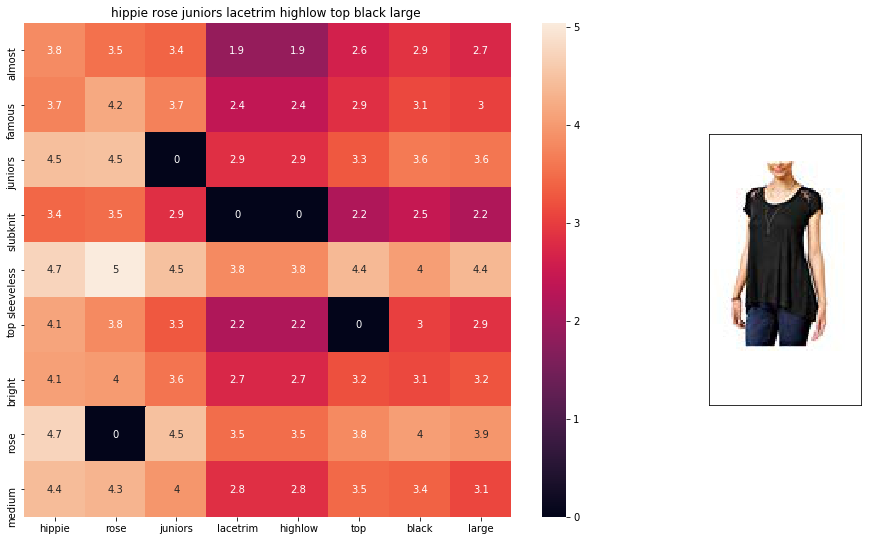

ASIN : B01NCO057A
BRAND : Hippie Rose
euclidean distance from given input image : 0.7827283


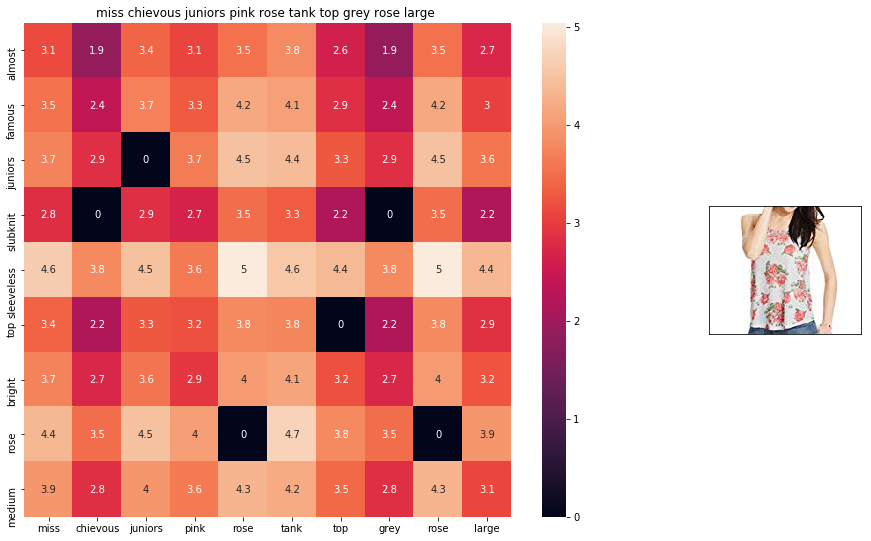

ASIN : B01JKRKZNK
BRAND : Miss Chievous
euclidean distance from given input image : 0.7904768


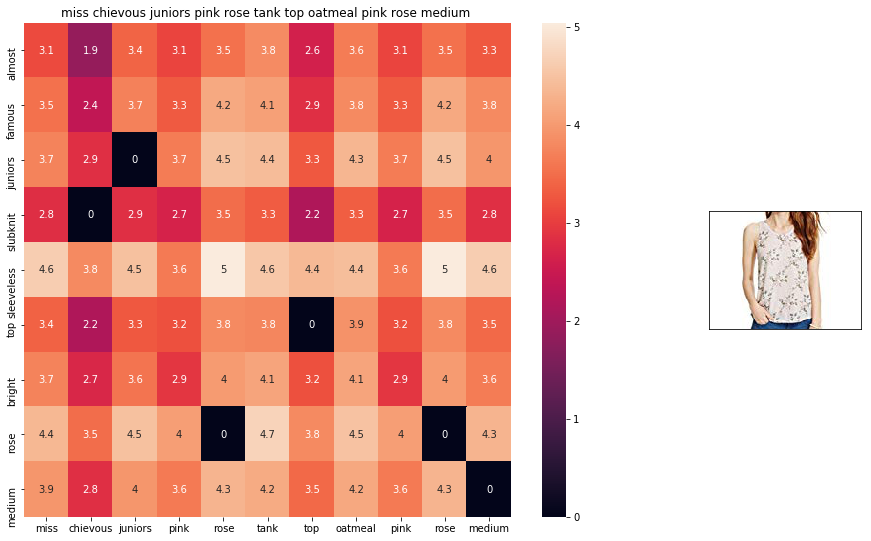

ASIN : B01JKQZ8R4
BRAND : Miss Chievous
euclidean distance from given input image : 0.7933993


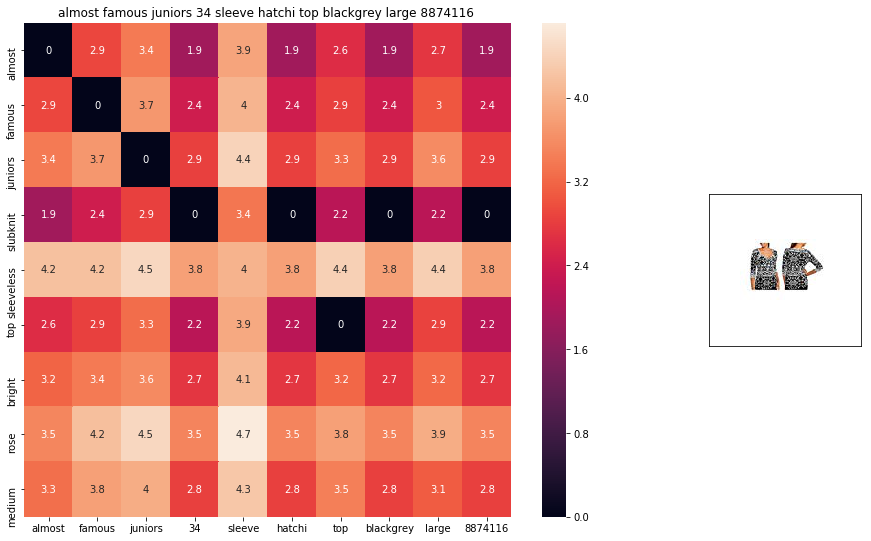

ASIN : B01GV3O5DW
BRAND : Almost Famous
euclidean distance from given input image : 0.79629797


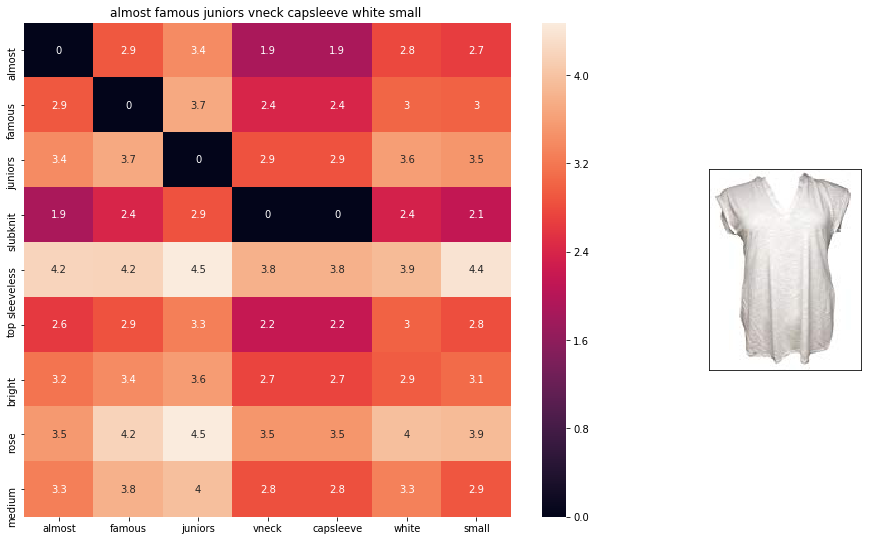

ASIN : B071HKKXW2
BRAND : Almost Famous
euclidean distance from given input image : 0.8036102


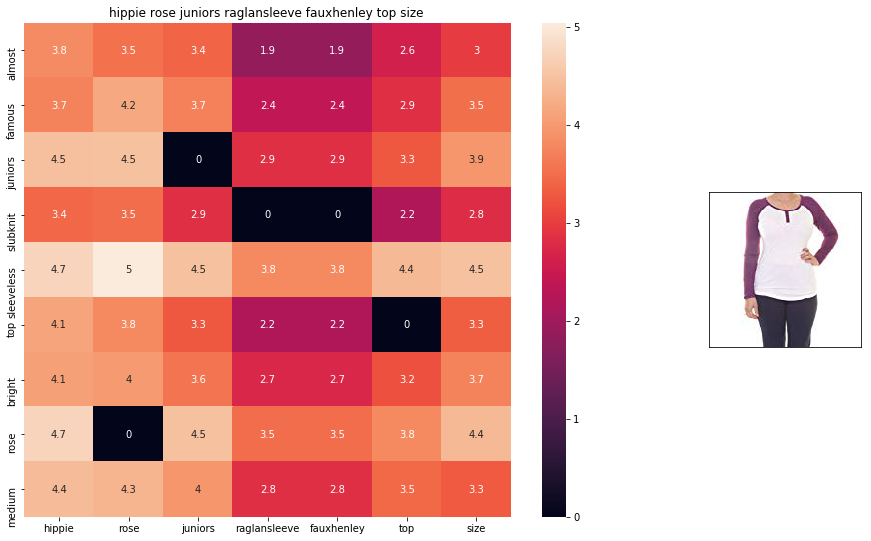

ASIN : B01M9GVBZY
BRAND : Hippie Rose
euclidean distance from given input image : 0.8101262


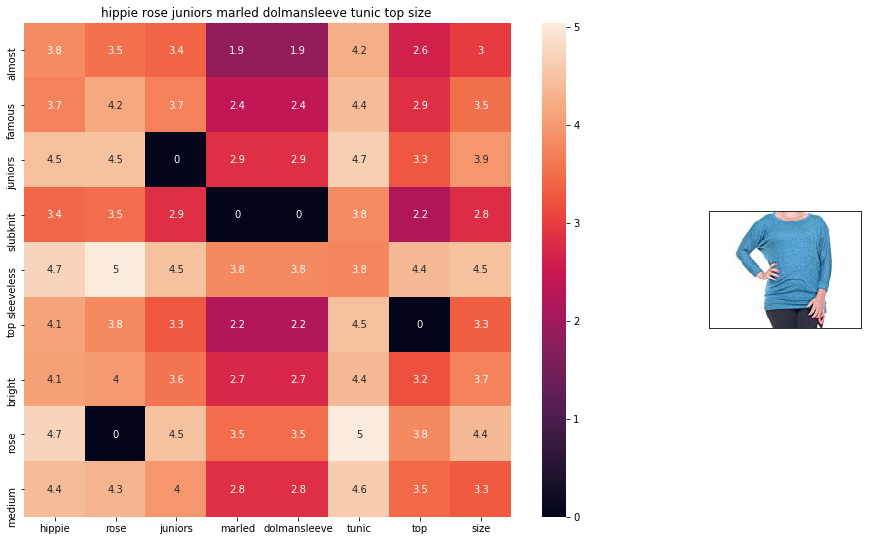

ASIN : B072HXX3W7
BRAND : Hippie Rose
euclidean distance from given input image : 0.8114562


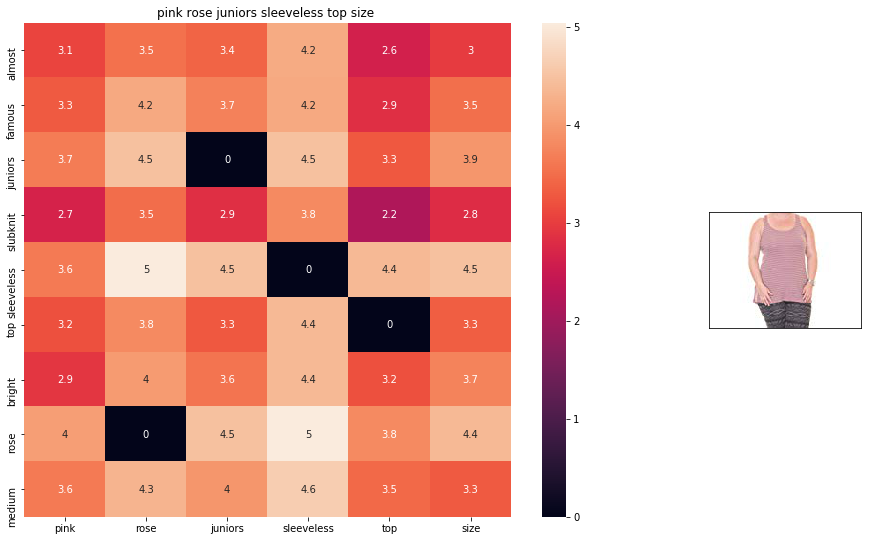

ASIN : B01MG5KJCQ
BRAND : PINK ROSE
euclidean distance from given input image : 0.81820023


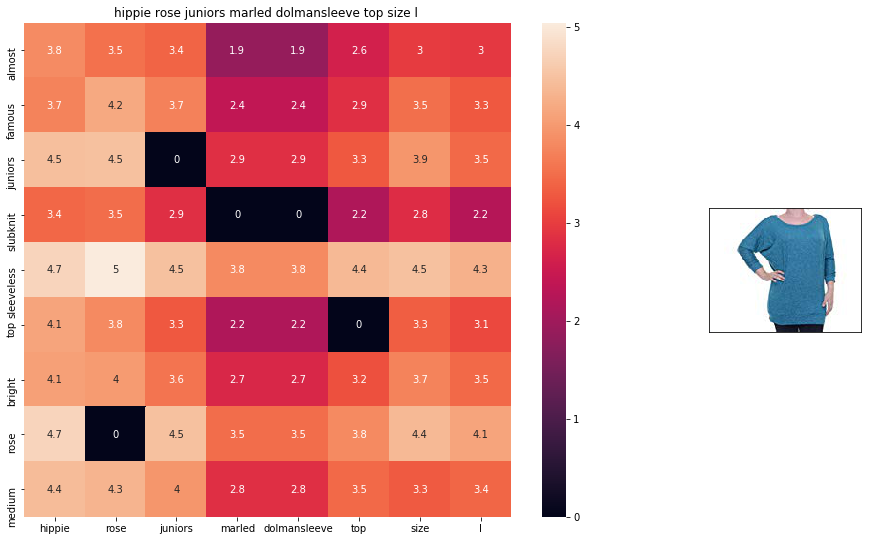

ASIN : B06XGNDTPS
BRAND : Hippie Rose
euclidean distance from given input image : 0.81873995


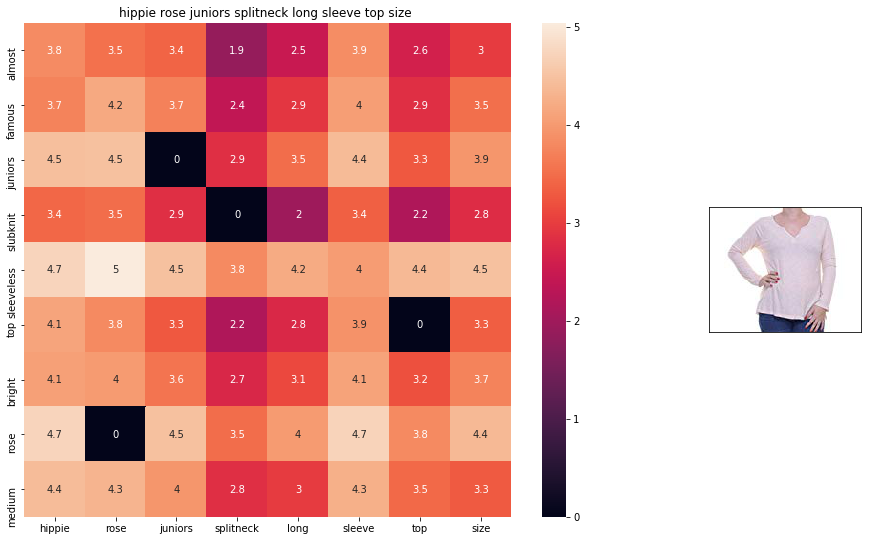

ASIN : B072B8NRP4
BRAND : Hippie Rose
euclidean distance from given input image : 0.81981725


In [182]:
avg_w2v_model(1152, 20)

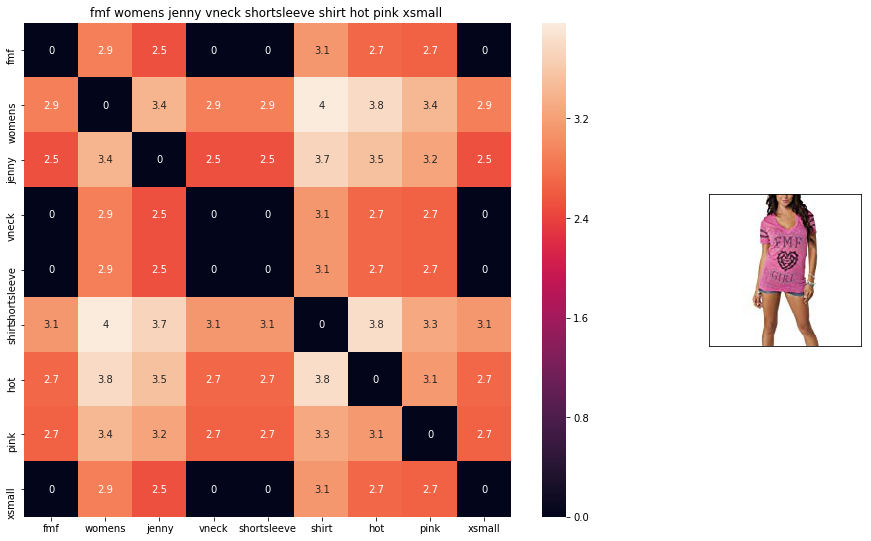

ASIN : B00HSDO8LO
BRAND : FMF
euclidean distance from given input image : 0.0


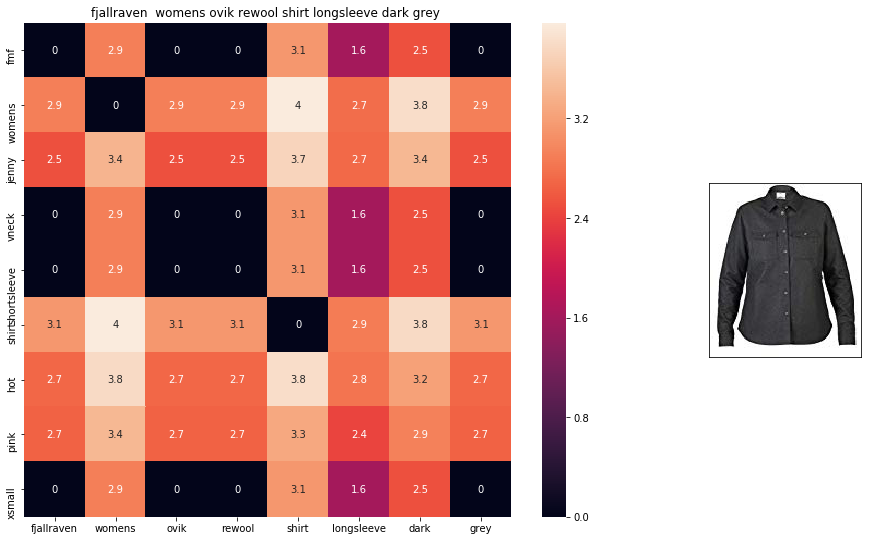

ASIN : B01N7RCYQ4
BRAND : Fjallraven
euclidean distance from given input image : 0.5404338


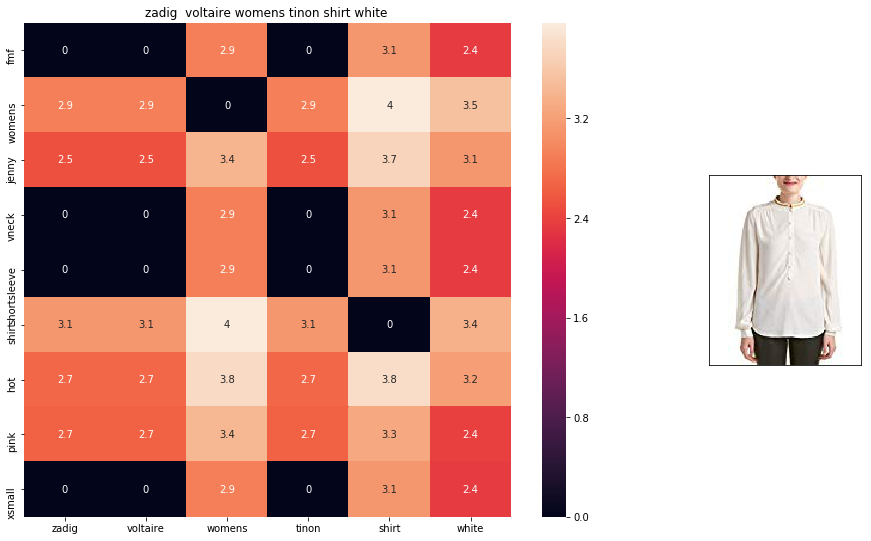

ASIN : B01MSYDSXA
BRAND : Zadig & Voltaire
euclidean distance from given input image : 0.5438039


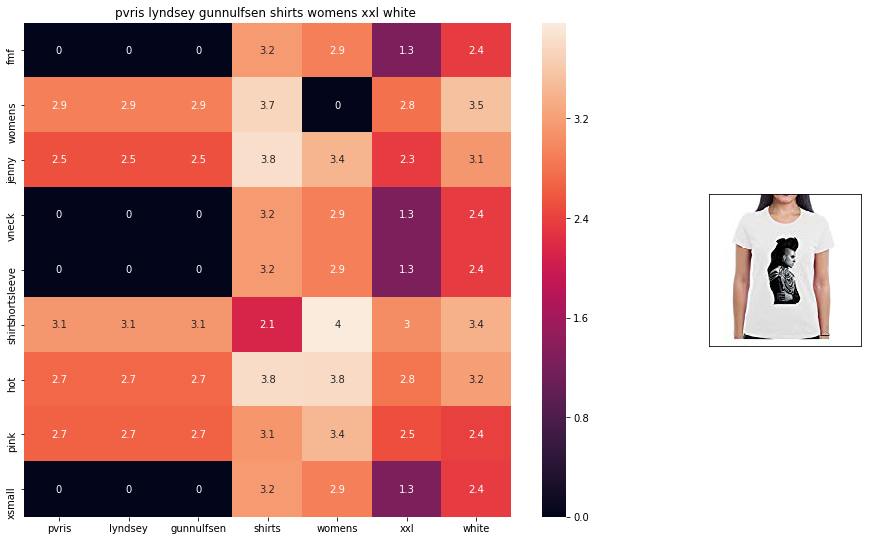

ASIN : B01JEGU97E
BRAND : heather trujillo
euclidean distance from given input image : 0.5839033


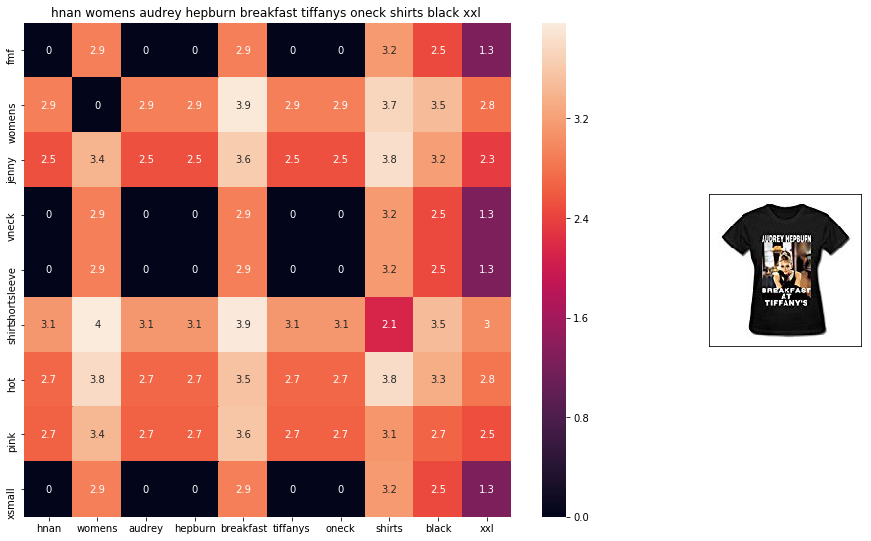

ASIN : B014SZ4F3K
BRAND : H'nan
euclidean distance from given input image : 0.58935


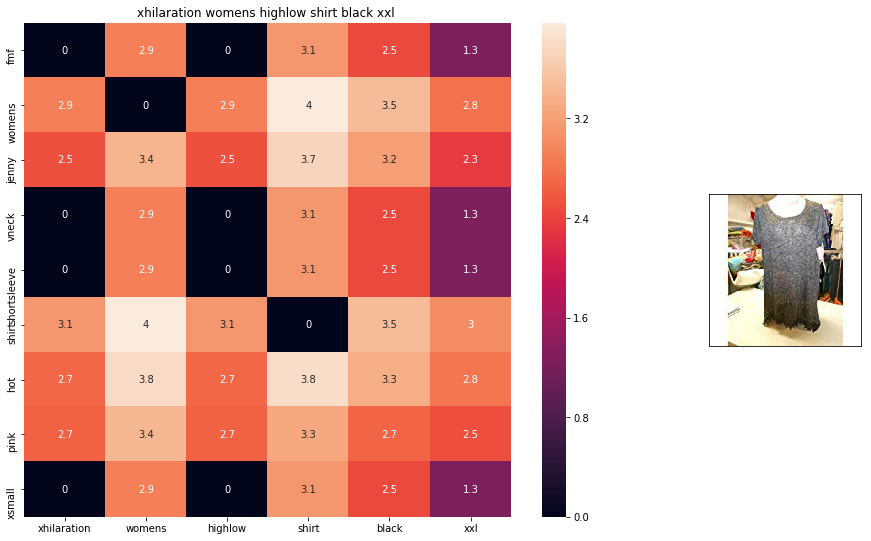

ASIN : B06Y1NF6M7
BRAND : Xhilaration
euclidean distance from given input image : 0.59101224


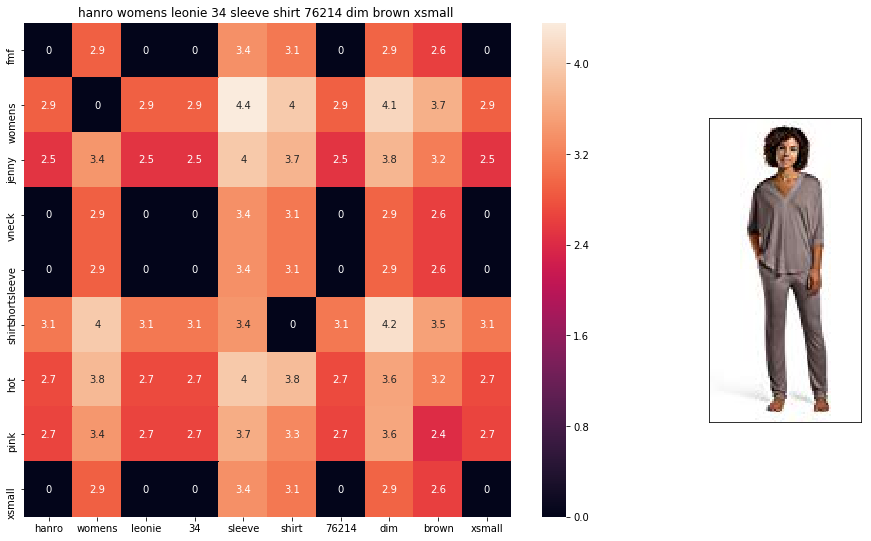

ASIN : B06Y3YRLP1
BRAND : HANRO
euclidean distance from given input image : 0.59440506


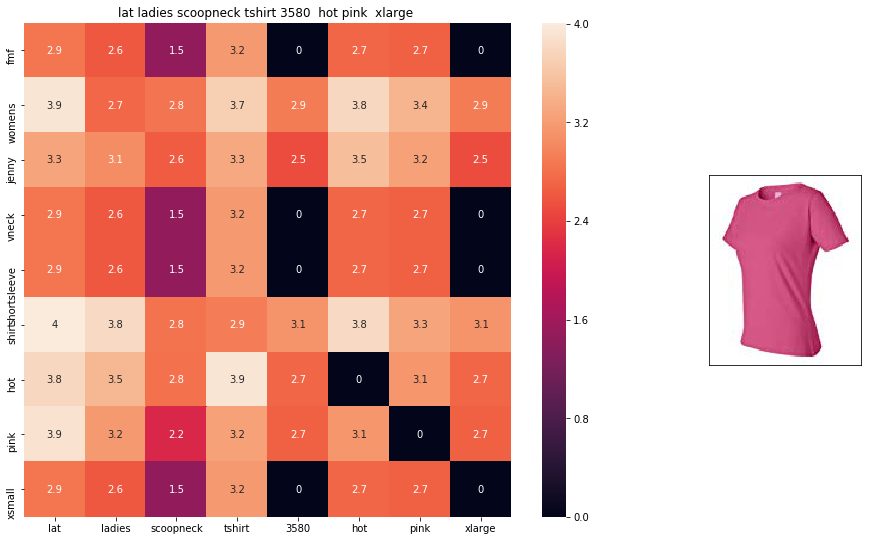

ASIN : B004L6JAGE
BRAND : L.A.T Sportswear
euclidean distance from given input image : 0.6032753


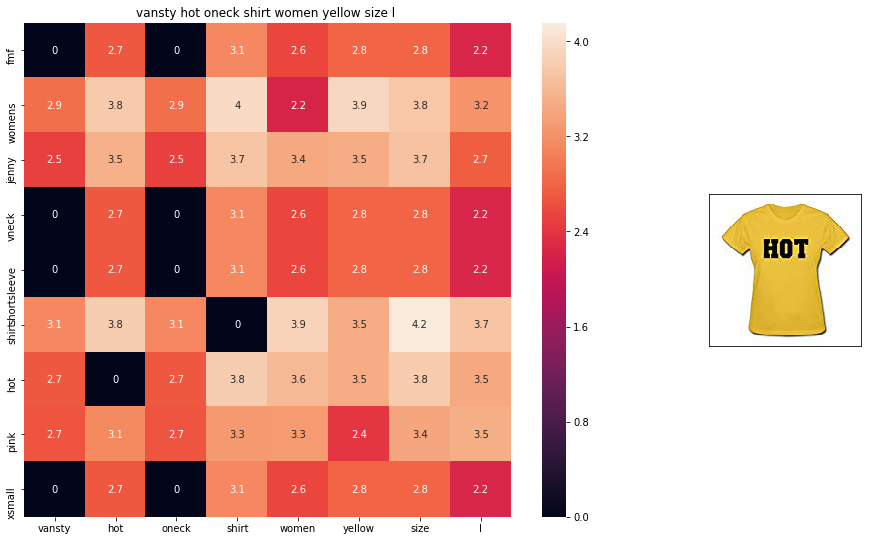

ASIN : B01EFSLASS
BRAND : Vansty
euclidean distance from given input image : 0.6166394


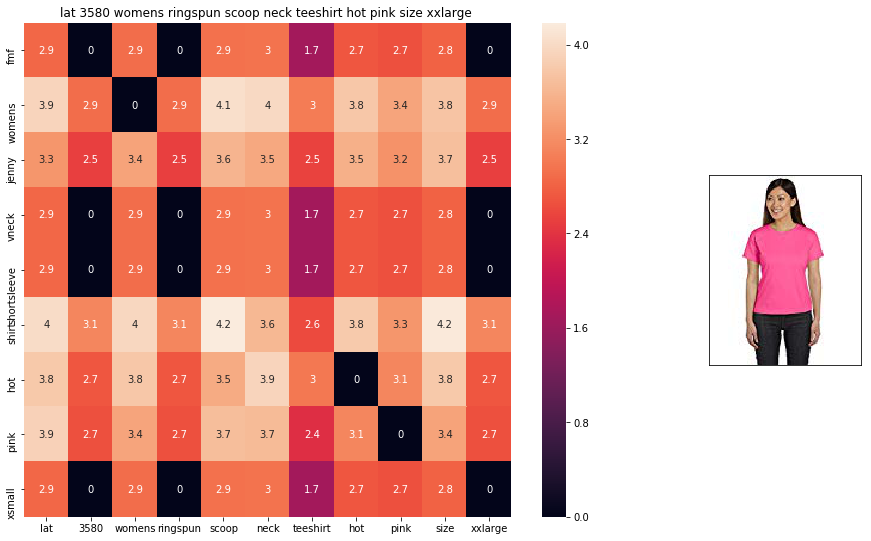

ASIN : B008P99GOE
BRAND : L.A.T Sportswear
euclidean distance from given input image : 0.61750895


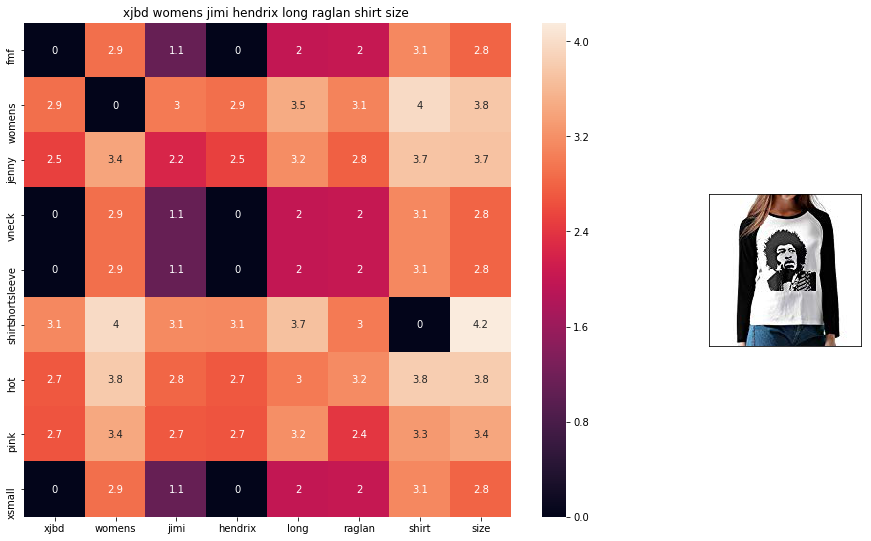

ASIN : B01M61UFBB
BRAND : XJBD
euclidean distance from given input image : 0.62247705


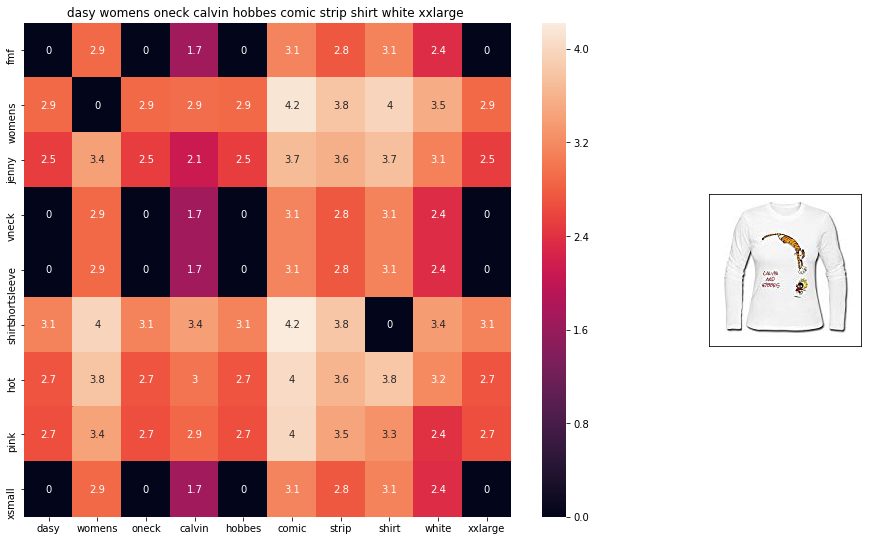

ASIN : B017VZKW0Y
BRAND : Dasy
euclidean distance from given input image : 0.62498504


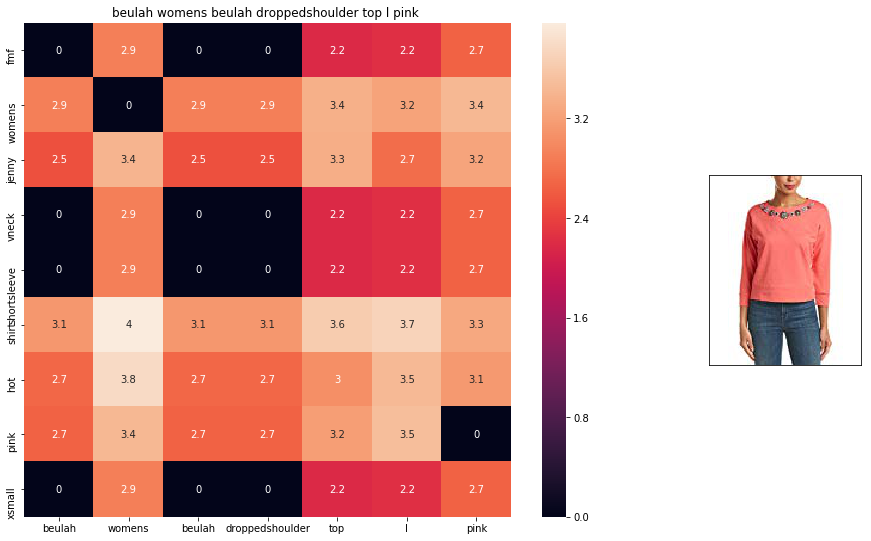

ASIN : B074RNT1P2
BRAND : Beulah
euclidean distance from given input image : 0.6253545


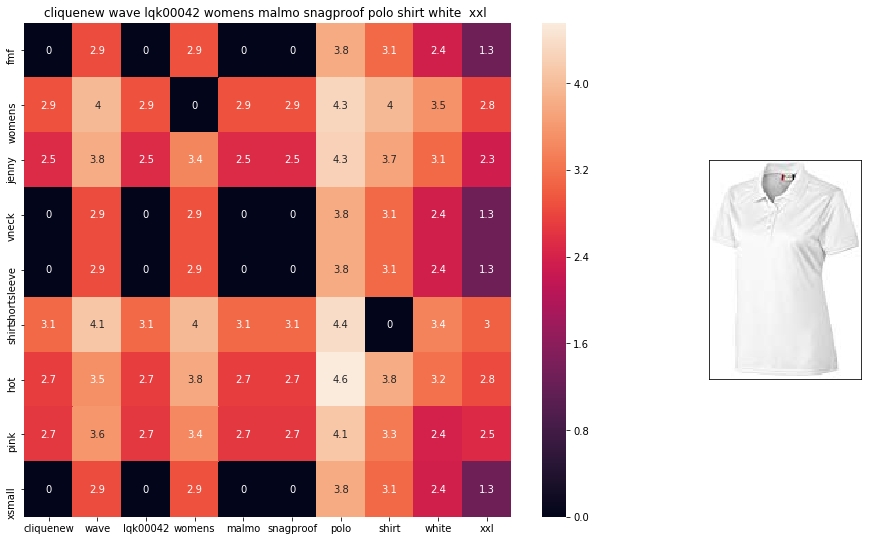

ASIN : B00PVKDP5G
BRAND : Clique
euclidean distance from given input image : 0.6267967


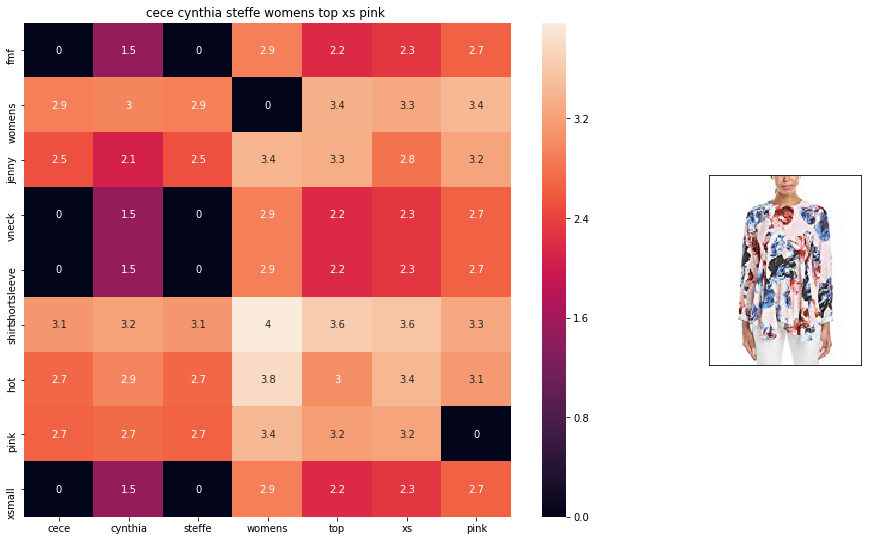

ASIN : B06Y56HLYX
BRAND : CeCe by Cynthia Steffe
euclidean distance from given input image : 0.629277


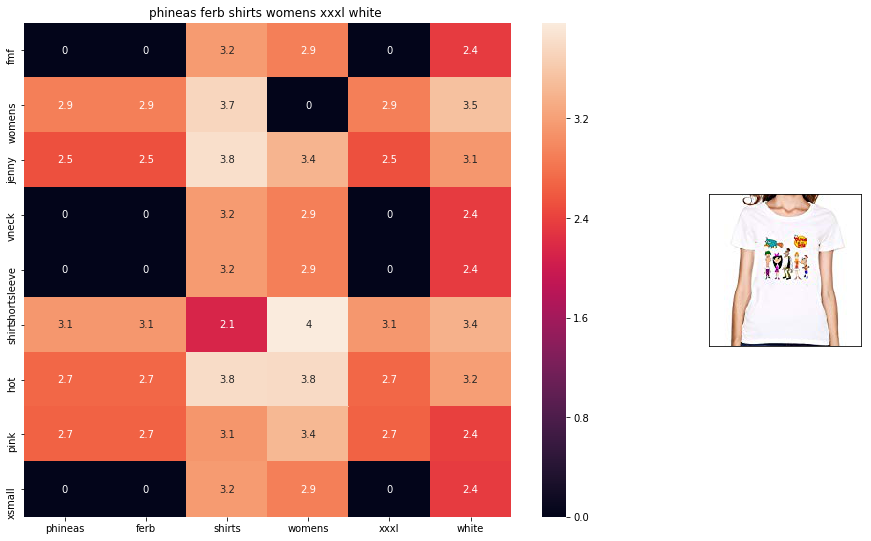

ASIN : B01KFGSUVE
BRAND : MajinaHerrera
euclidean distance from given input image : 0.6297737


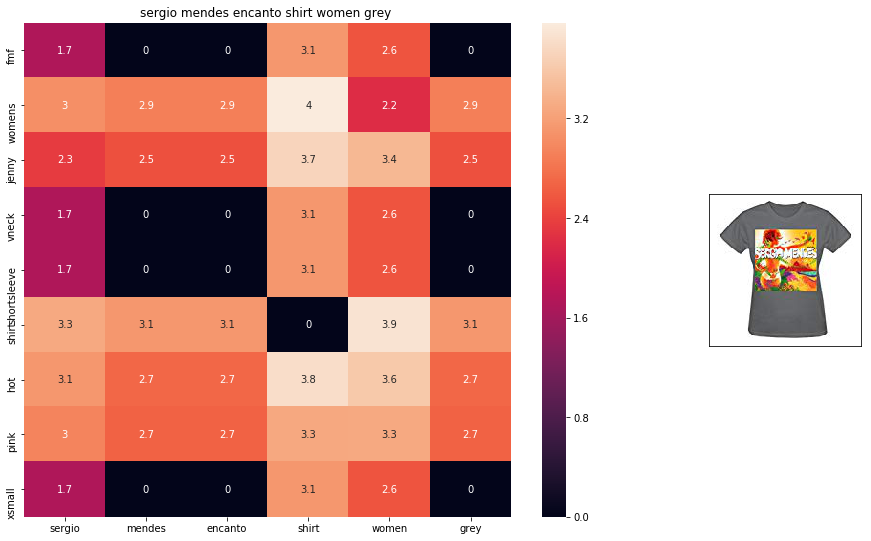

ASIN : B01I6NU1OM
BRAND : Tony Arden
euclidean distance from given input image : 0.63067895


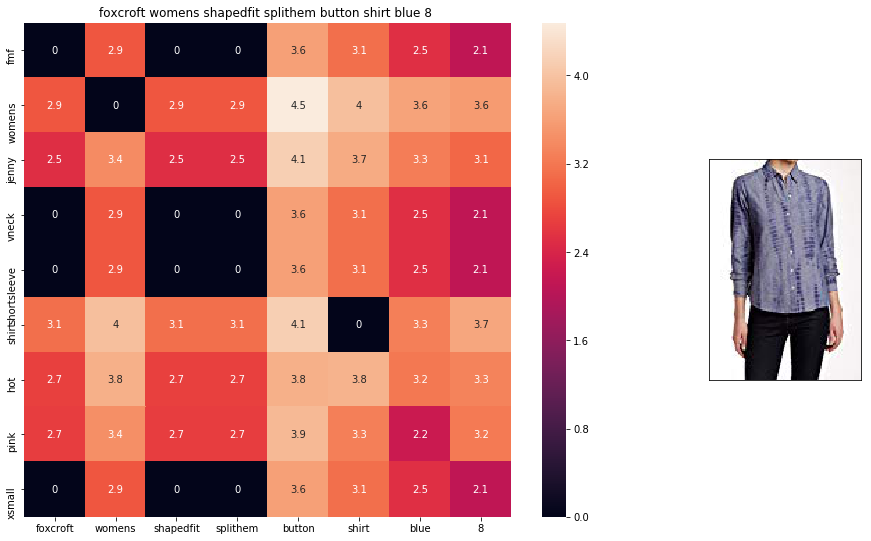

ASIN : B072J3NV8H
BRAND : Foxcroft
euclidean distance from given input image : 0.63130045


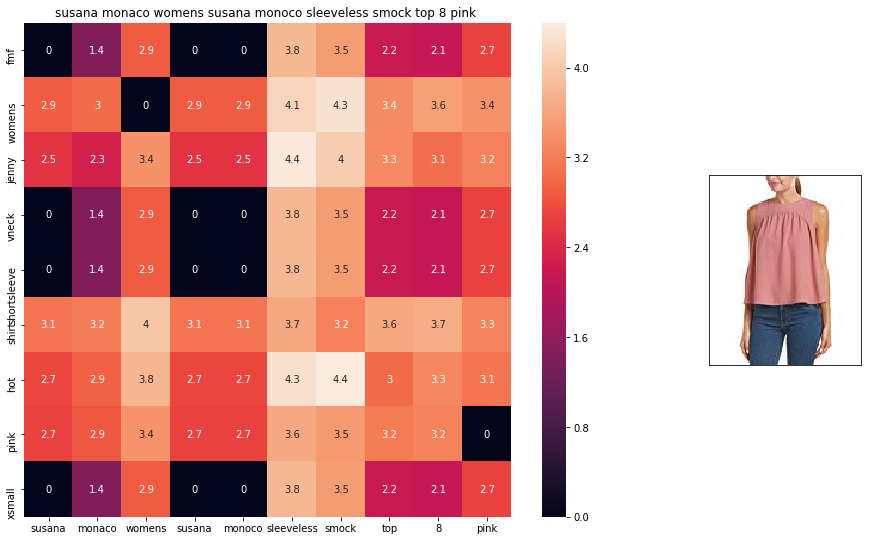

ASIN : B074L8YL5P
BRAND : susana monaco
euclidean distance from given input image : 0.63231283


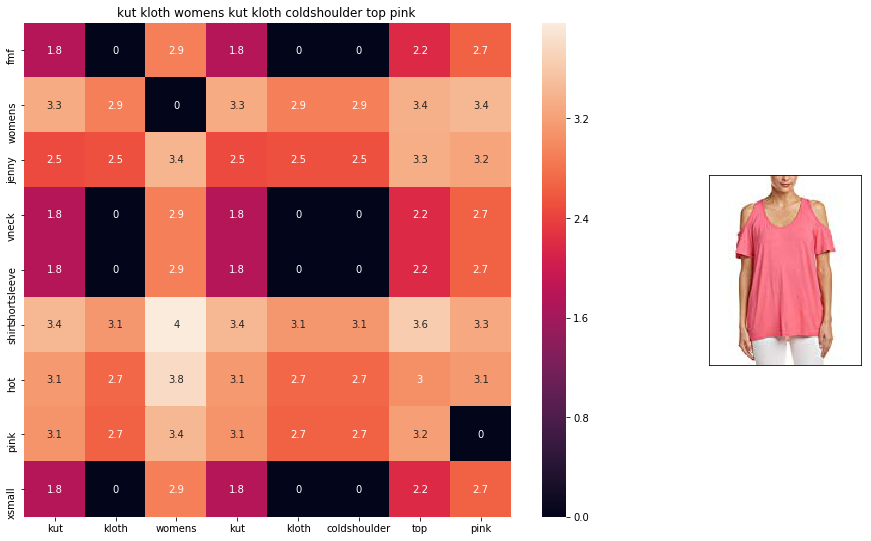

ASIN : B01LDR3SGQ
BRAND : KUT from the Kloth
euclidean distance from given input image : 0.63422996


In [183]:
avg_w2v_model(104, 20)

### [9.4]  IDF weighted Word2Vec for product similarity

In [184]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

In [1]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)


#931
#12566
# in the give heat map, each cell contains the euclidean distance between words i, j

# Lets get similar products for product ID 1152 and 104 using Avg W2V

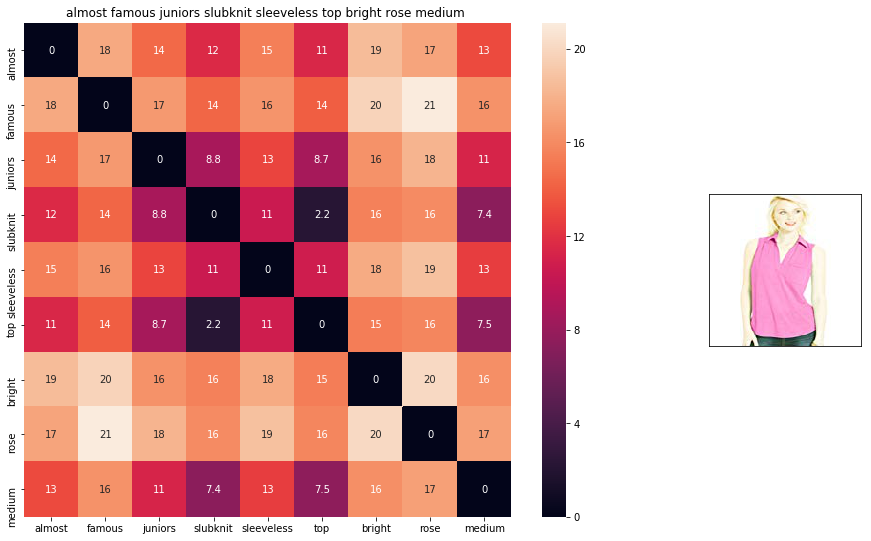

ASIN : B01CO4GLPM
Brand : Almost Famous
euclidean distance from input : 0.001953125


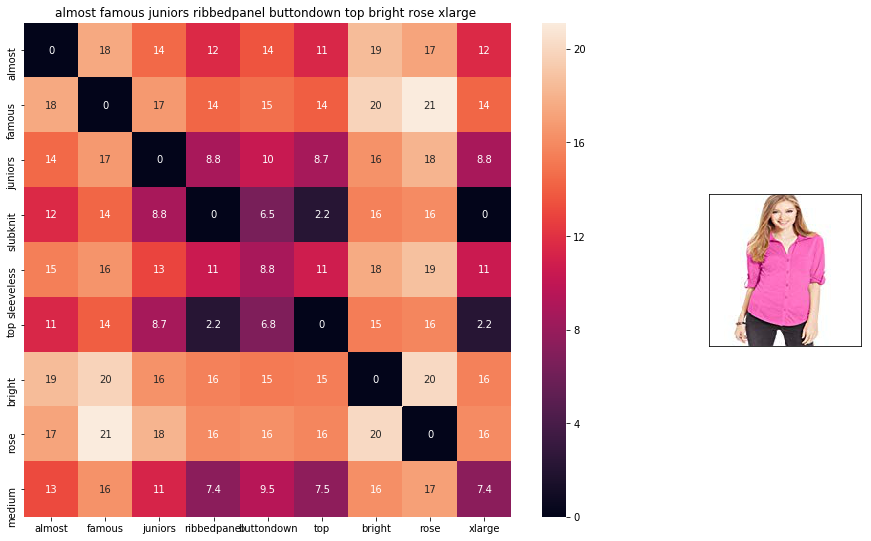

ASIN : B01CEUX0MI
Brand : Almost Famous
euclidean distance from input : 1.2826694


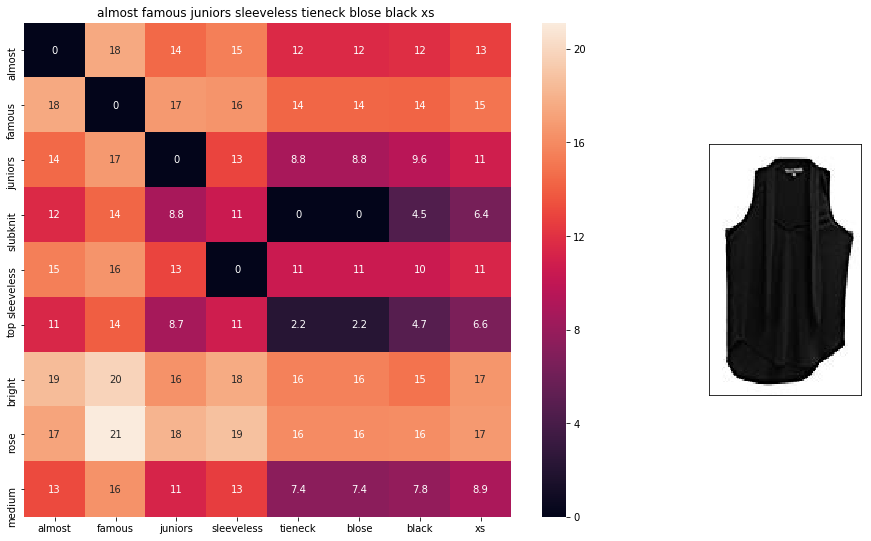

ASIN : B0745HMCJY
Brand : Almost Famous
euclidean distance from input : 2.8804522


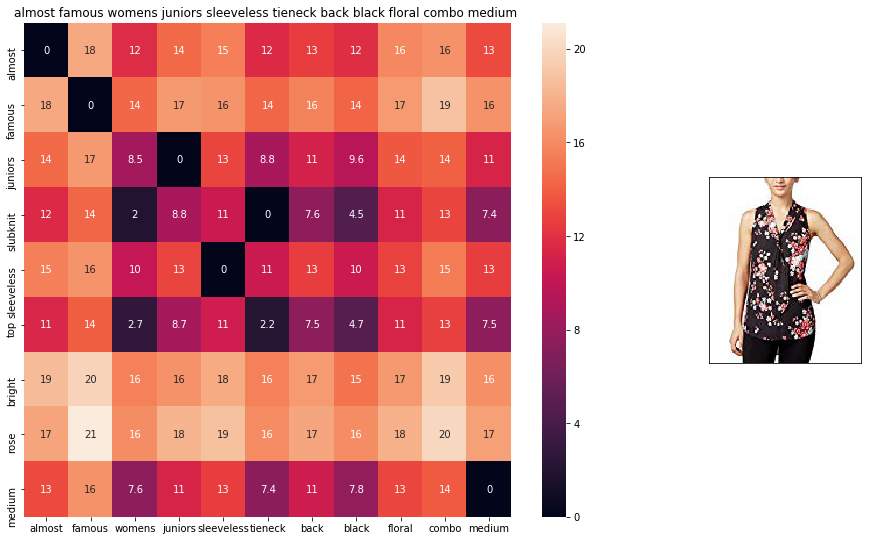

ASIN : B0738FTV95
Brand : Almost Famous
euclidean distance from input : 2.9096005


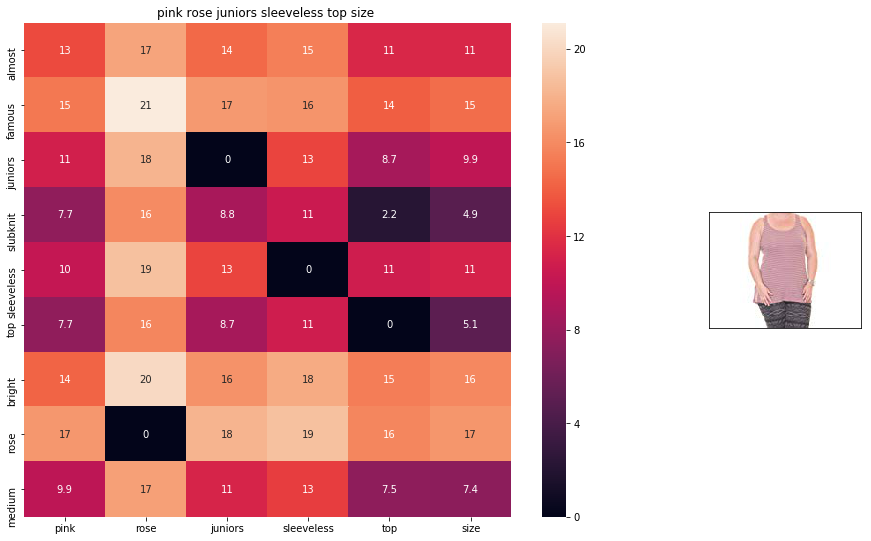

ASIN : B01MG5KJCQ
Brand : PINK ROSE
euclidean distance from input : 2.9105551


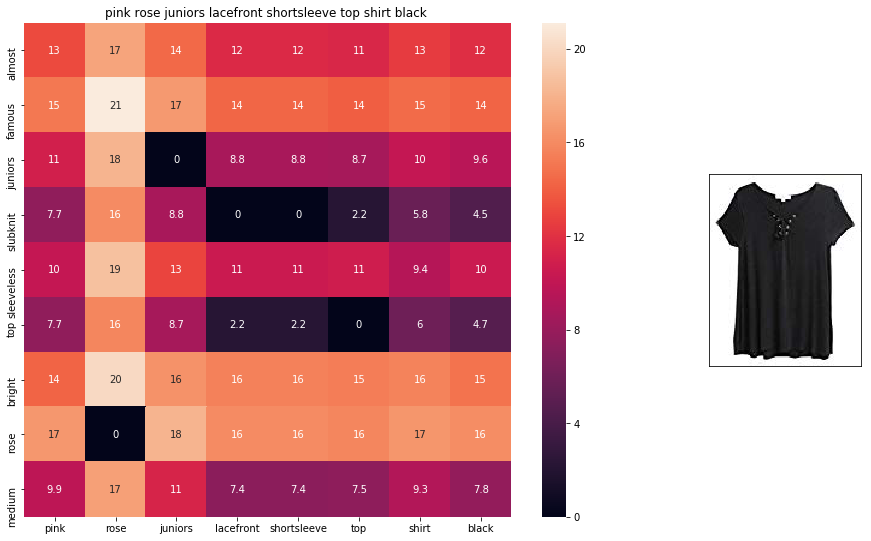

ASIN : B074RL282M
Brand : PINK ROSE
euclidean distance from input : 2.9345036


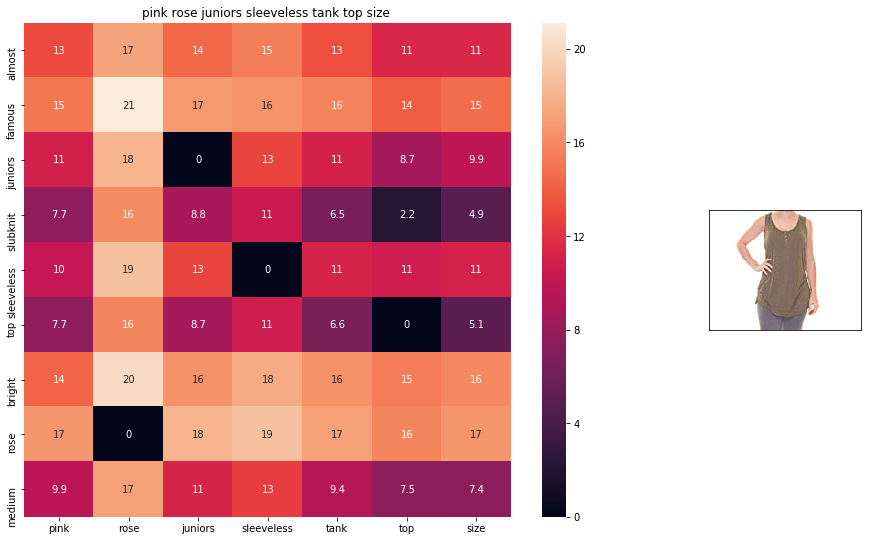

ASIN : B06XWXZJ45
Brand : PINK ROSE
euclidean distance from input : 2.9471657


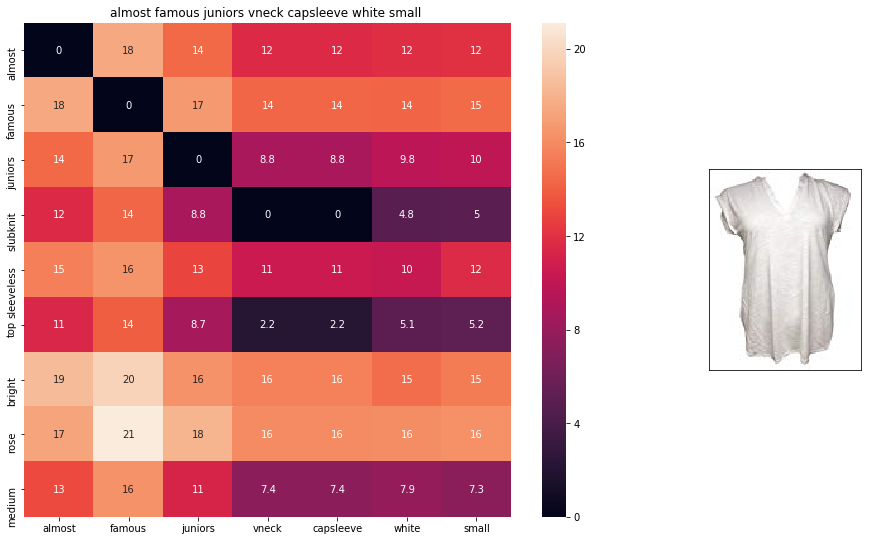

ASIN : B071HKKXW2
Brand : Almost Famous
euclidean distance from input : 2.9931269


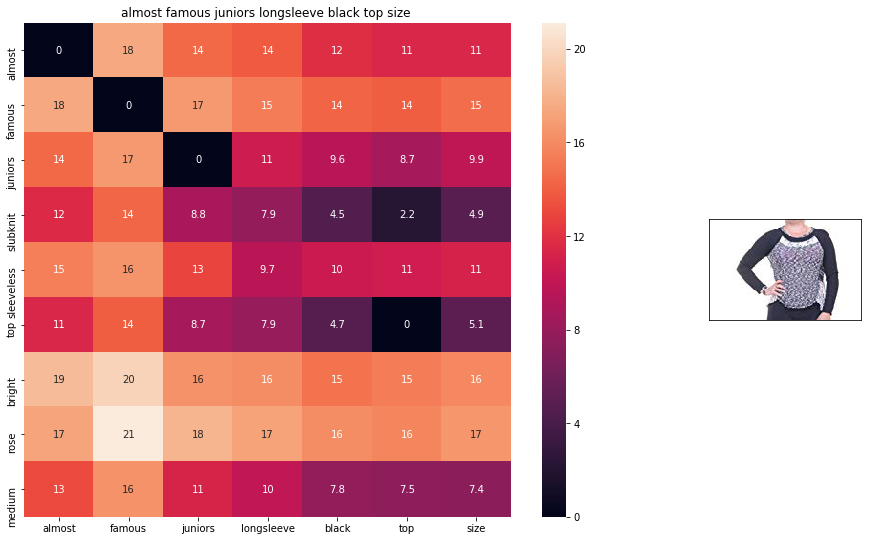

ASIN : B06XRPPVQC
Brand : Almost Famous
euclidean distance from input : 2.9953341


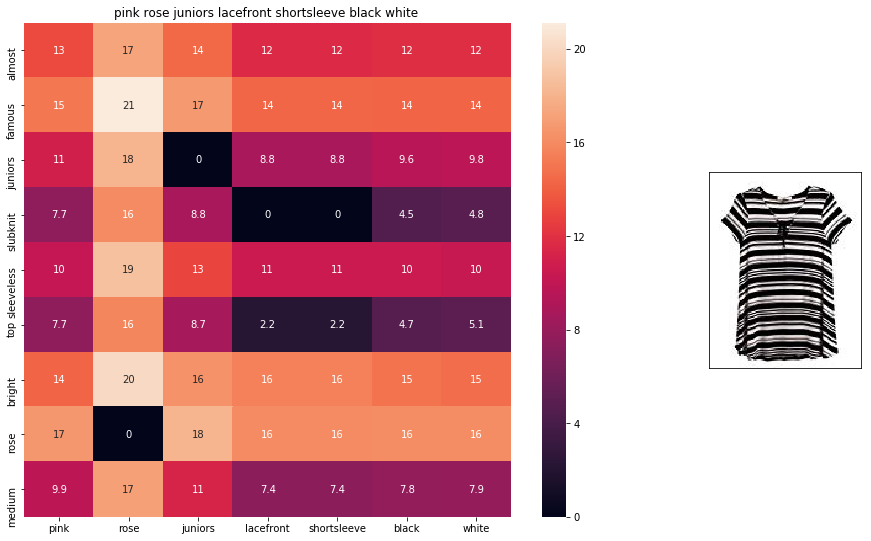

ASIN : B074RKS9Z2
Brand : PINK ROSE
euclidean distance from input : 3.0104132


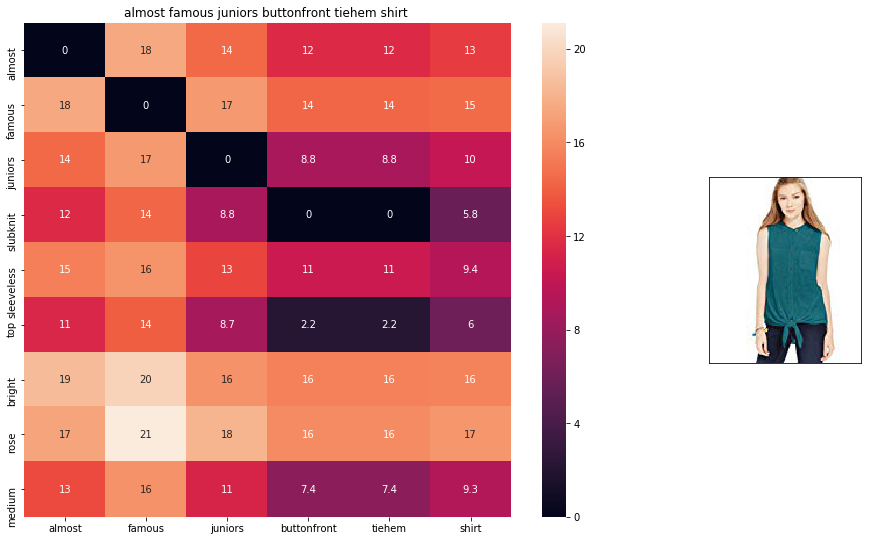

ASIN : B01L7D9KZY
Brand : Younique
euclidean distance from input : 3.1148891


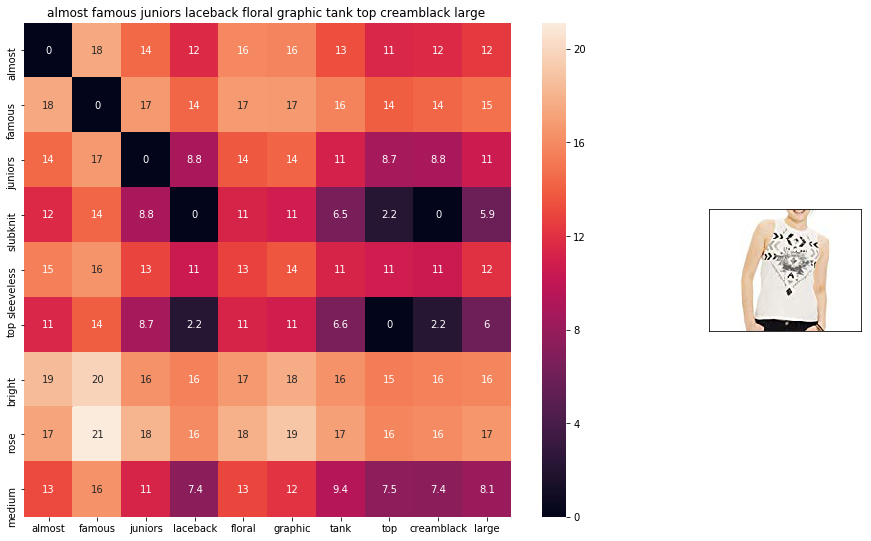

ASIN : B01JKN1FMY
Brand : Almost Famous
euclidean distance from input : 3.1885405


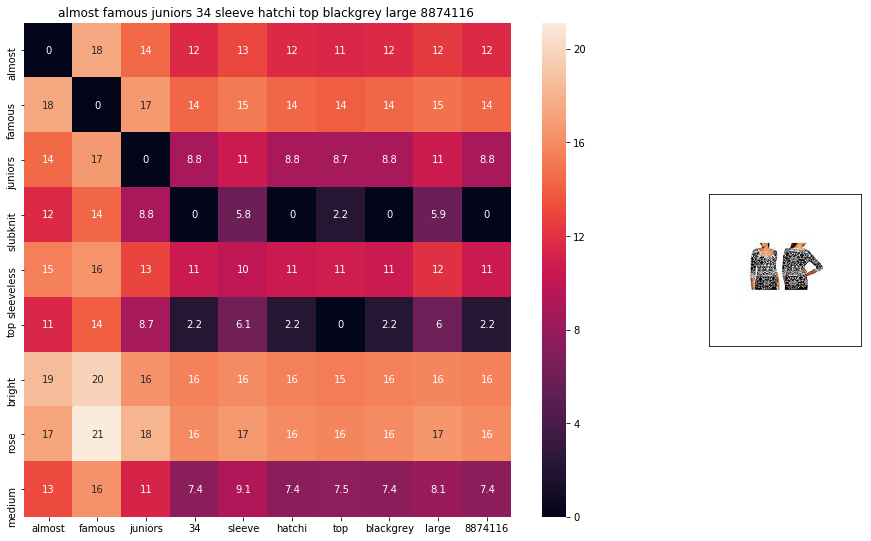

ASIN : B01GV3O5DW
Brand : Almost Famous
euclidean distance from input : 3.2152202


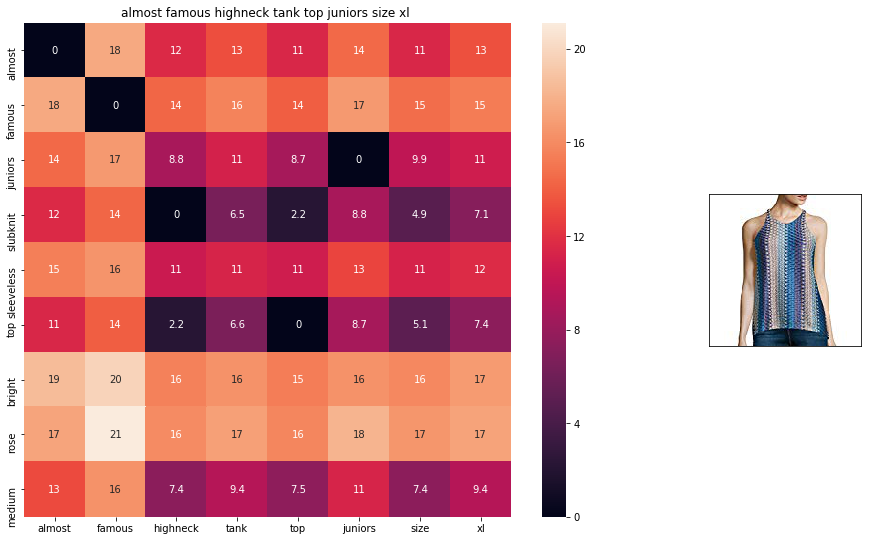

ASIN : B01MR9VMSE
Brand : Almost Famous
euclidean distance from input : 3.2167897


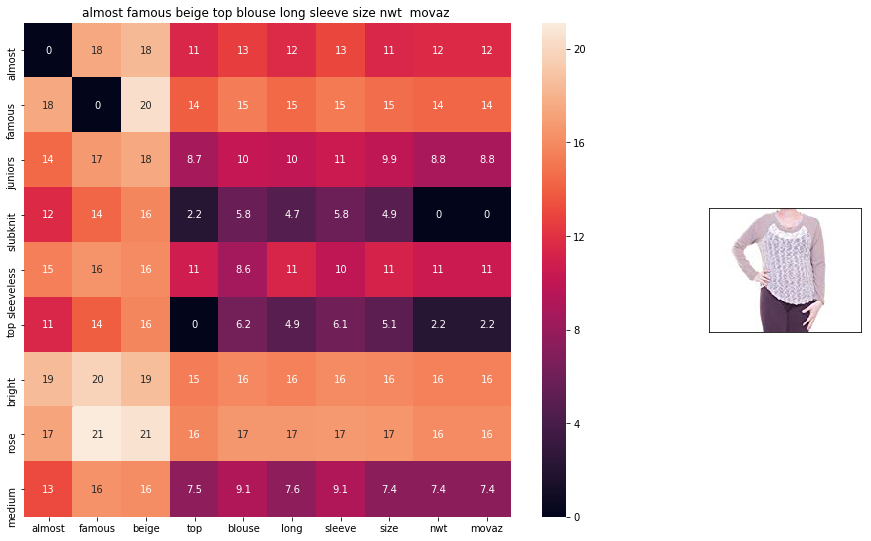

ASIN : B01NGZR1OQ
Brand : Almost Famous
euclidean distance from input : 3.249956


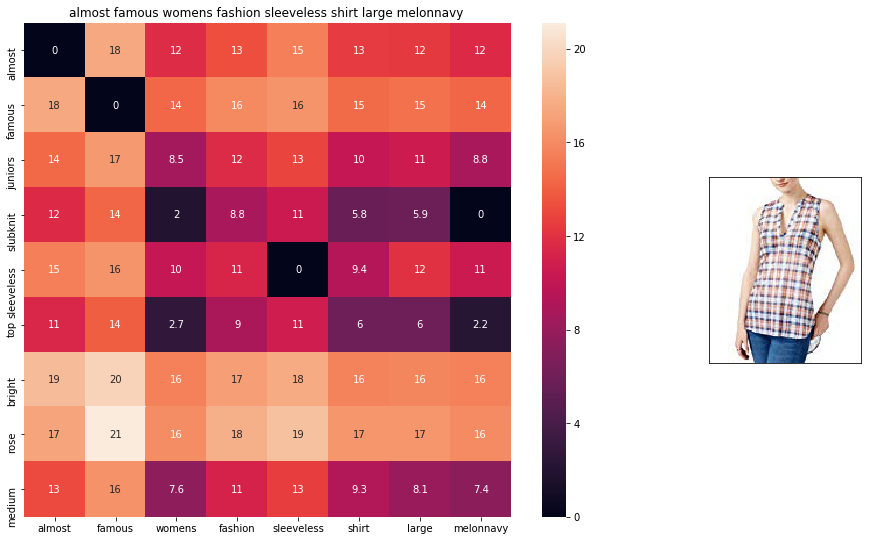

ASIN : B072NY3TZG
Brand : Almost Famous
euclidean distance from input : 3.2530143


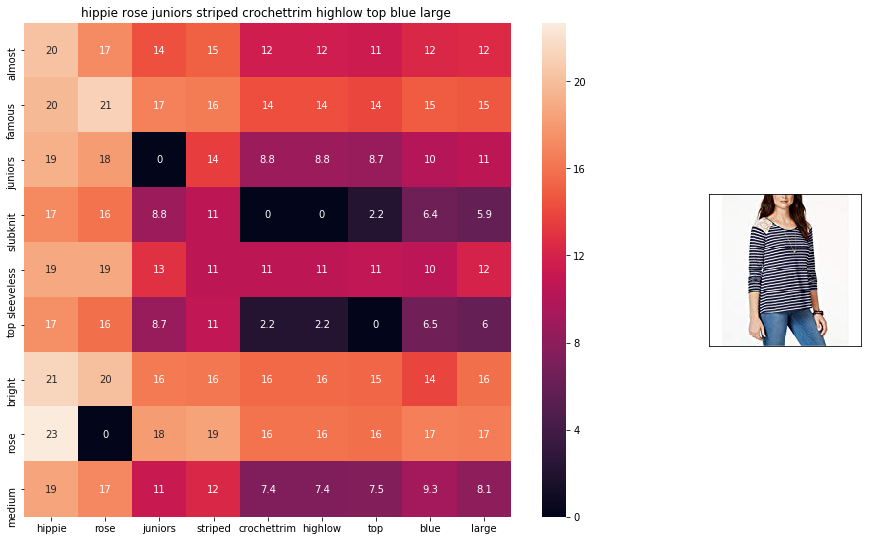

ASIN : B01N2GUQJI
Brand : Hippie Rose
euclidean distance from input : 3.270489


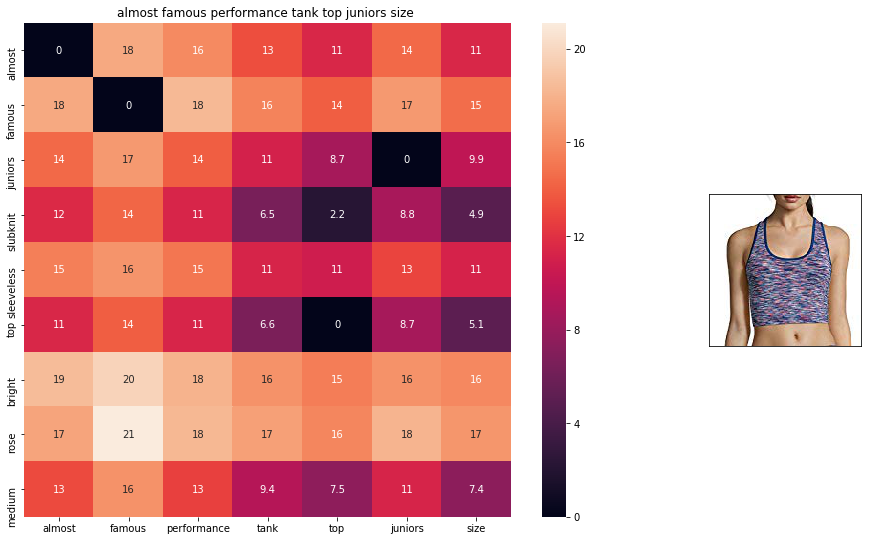

ASIN : B01N5EE096
Brand : Almost Famous
euclidean distance from input : 3.3202968


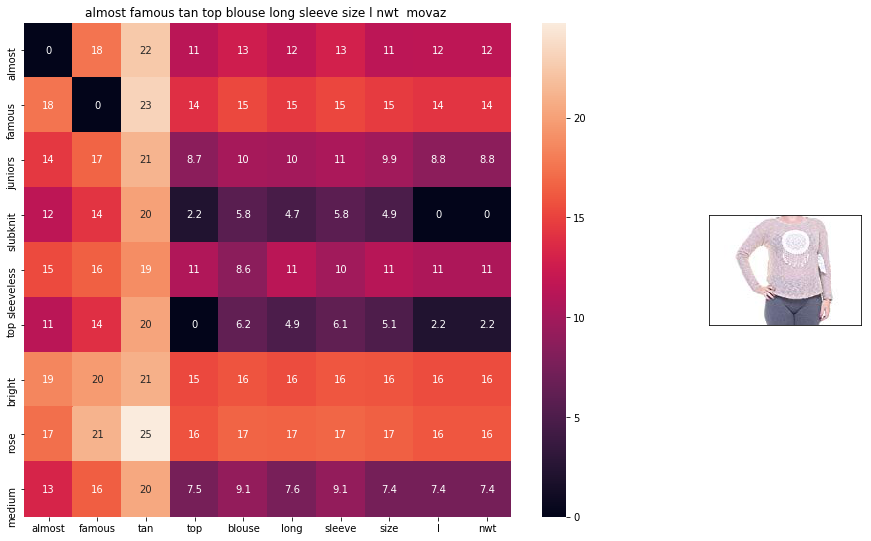

ASIN : B06XWXTP4J
Brand : Almost Famous
euclidean distance from input : 3.3396735


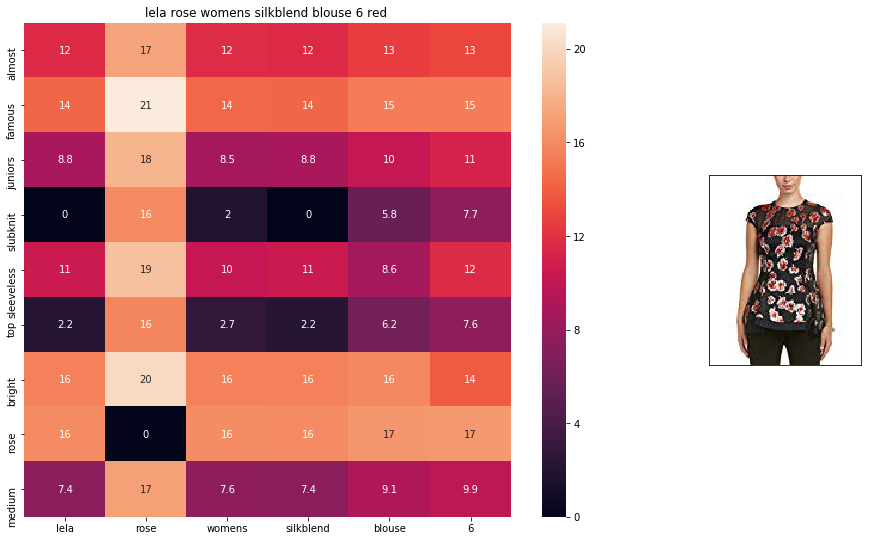

ASIN : B0755MMJQL
Brand : Lela Rose
euclidean distance from input : 3.3606997


In [186]:
weighted_w2v_model(1152, 20)

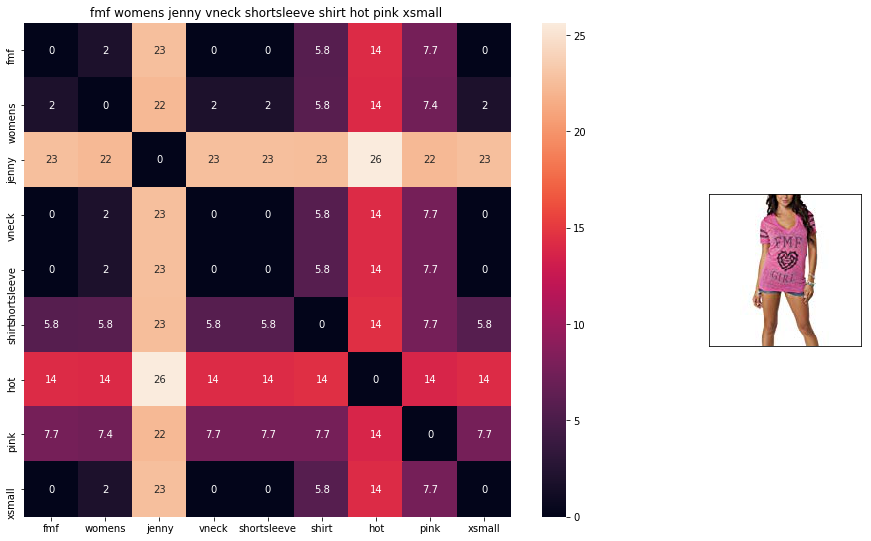

ASIN : B00HSDO8LO
Brand : FMF
euclidean distance from input : 0.0


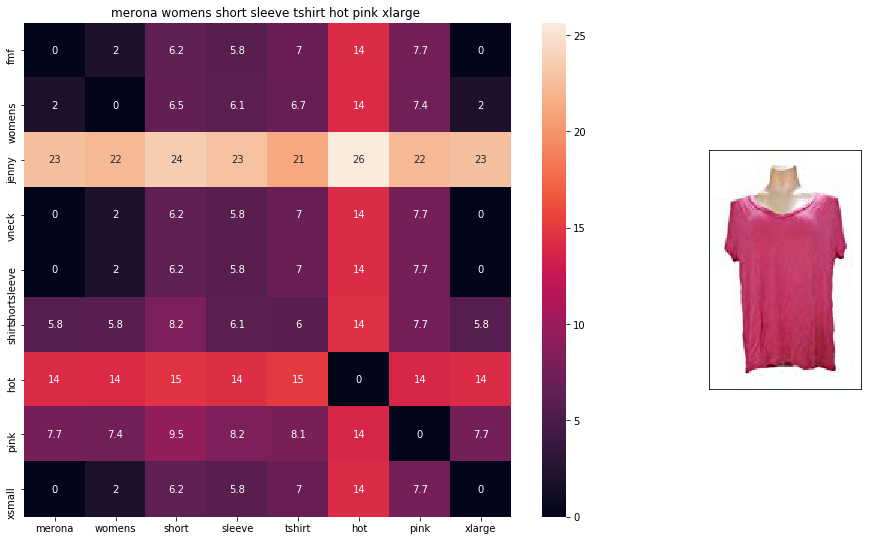

ASIN : B06XYNTBRH
Brand : Merona
euclidean distance from input : 2.5952563


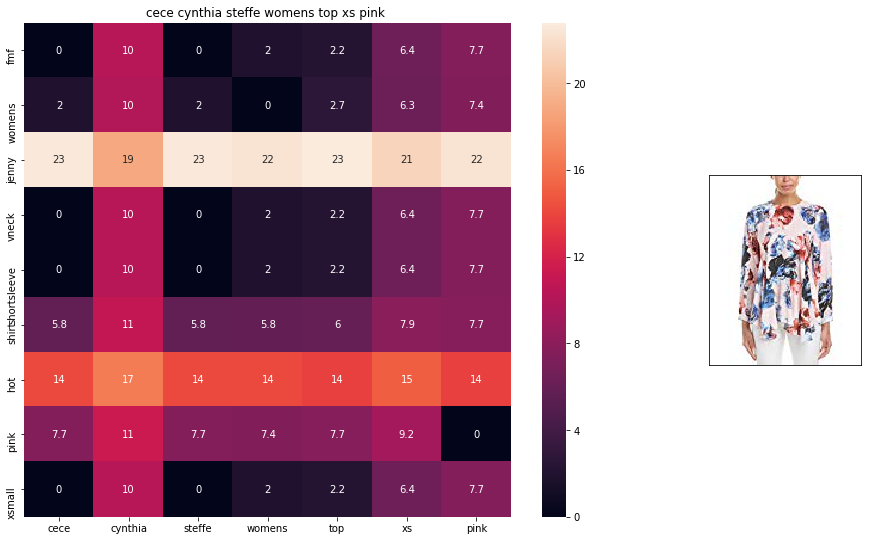

ASIN : B06Y56HLYX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 2.71715


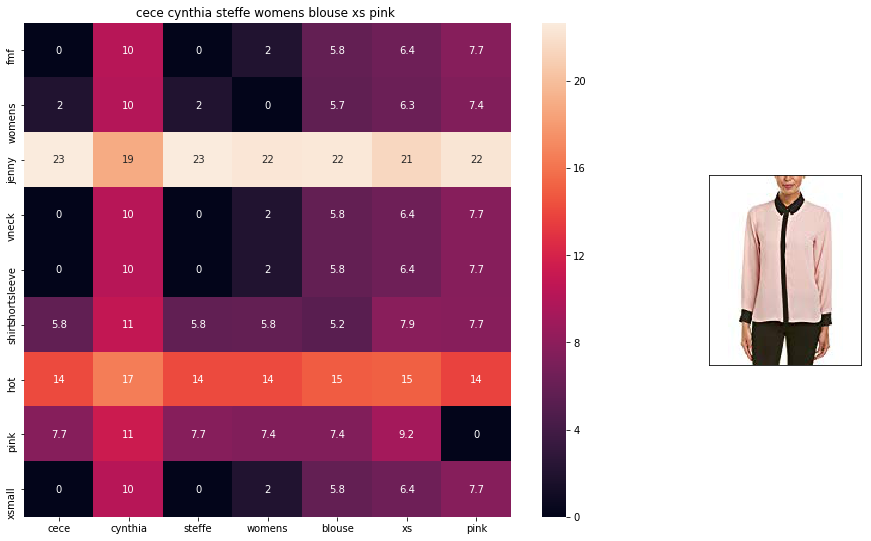

ASIN : B0753KHPD2
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 2.7950869


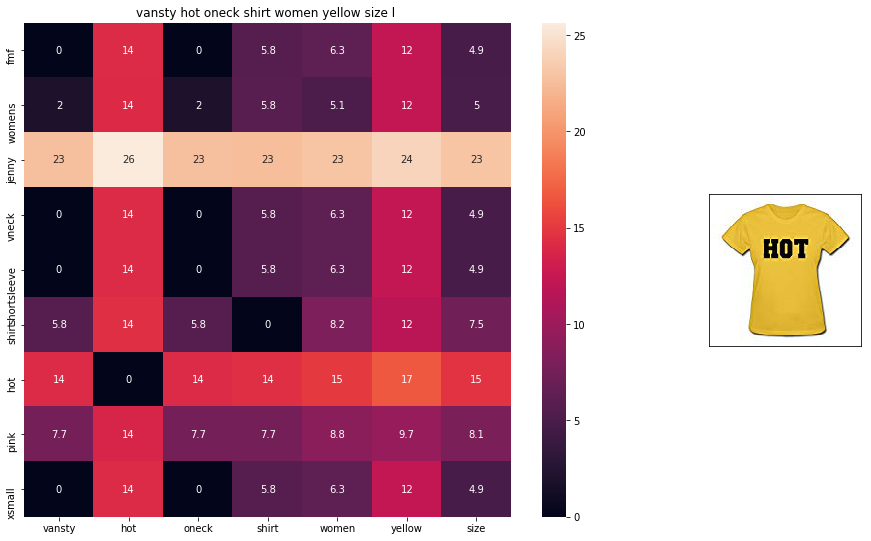

ASIN : B01EFSLASS
Brand : Vansty
euclidean distance from input : 2.8648787


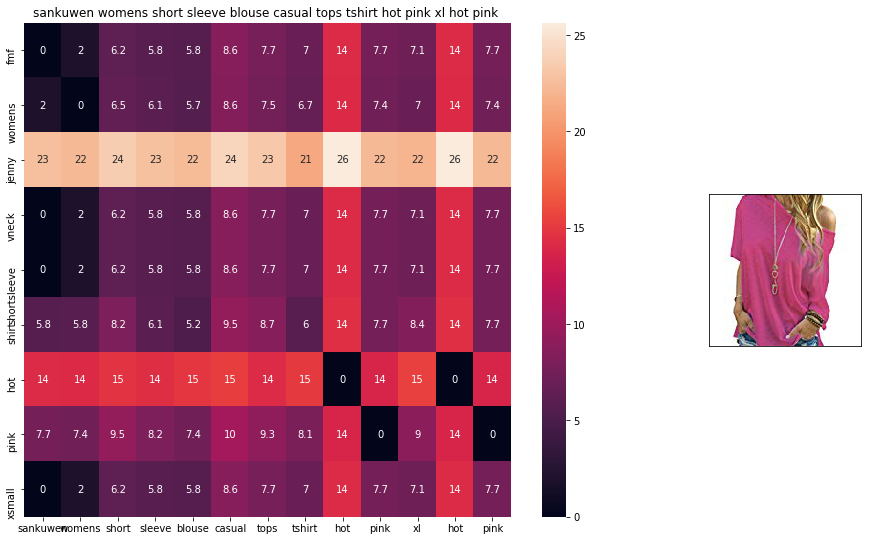

ASIN : B06X41YYZ8
Brand : Sankuwen
euclidean distance from input : 2.8695247


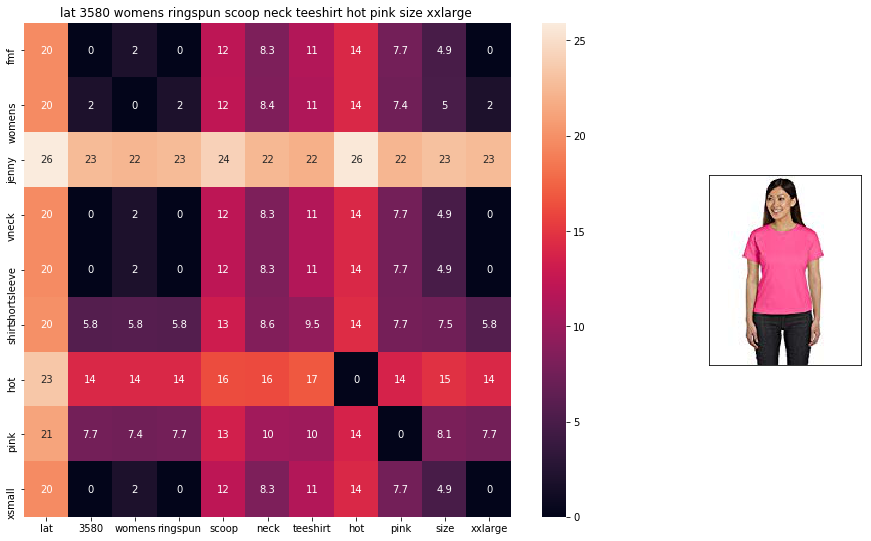

ASIN : B008P99GOE
Brand : L.A.T Sportswear
euclidean distance from input : 2.8876476


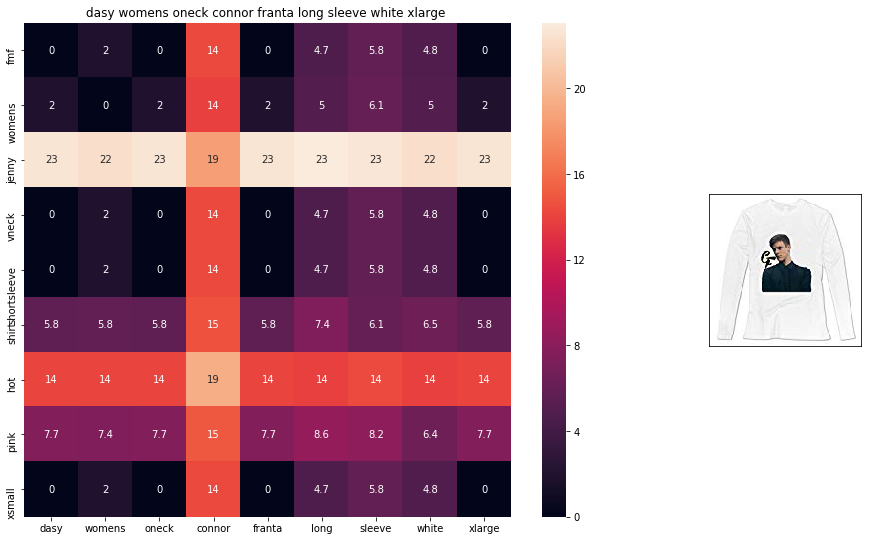

ASIN : B016XV5Y0A
Brand : Dasy
euclidean distance from input : 2.9261727


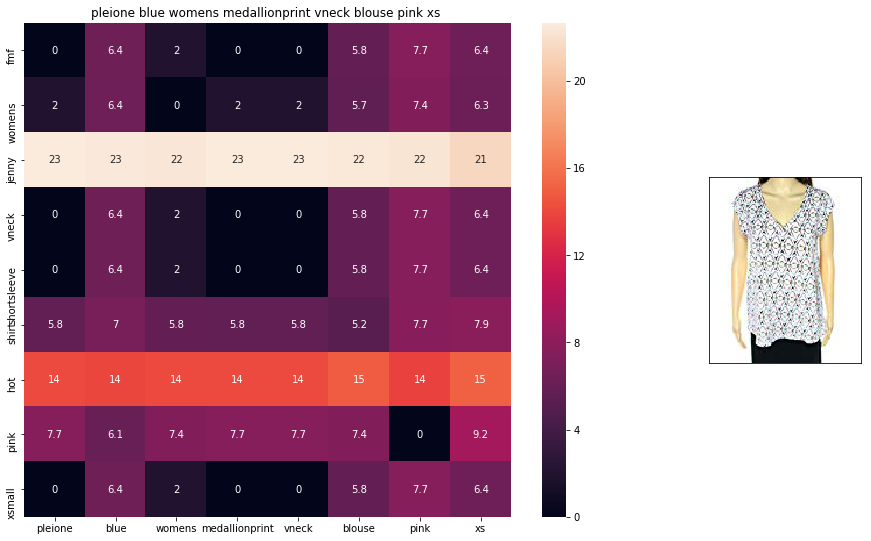

ASIN : B074VCV167
Brand : Pleione
euclidean distance from input : 2.9300616


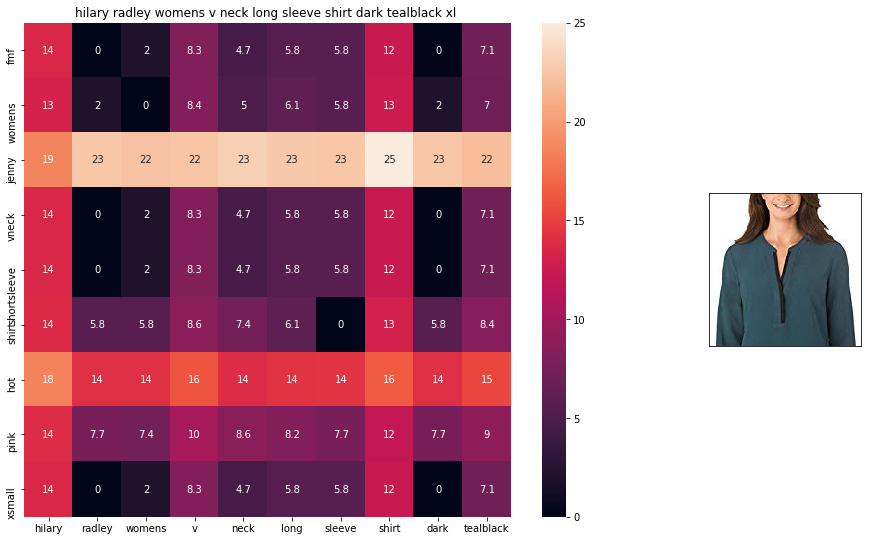

ASIN : B01NBS7Z1E
Brand : Hilary Radley
euclidean distance from input : 2.9420166


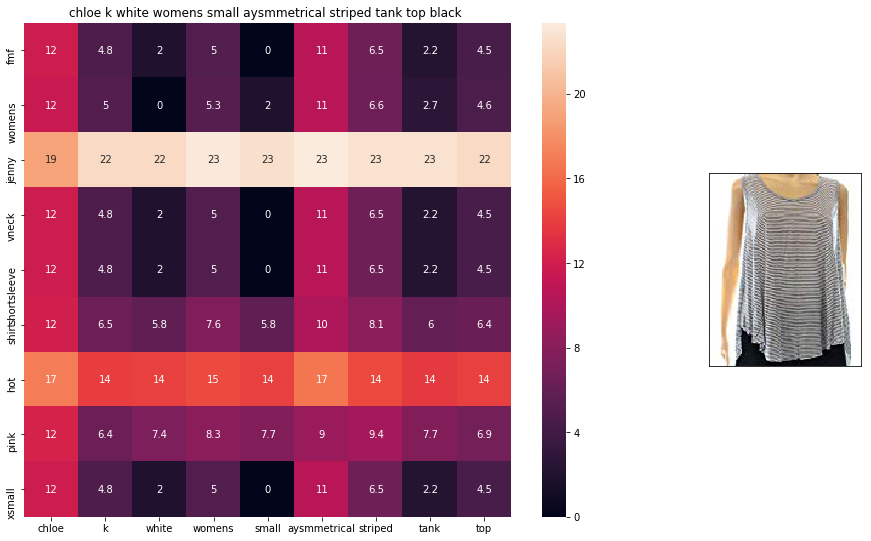

ASIN : B071SFVRZ9
Brand : Chloe K.
euclidean distance from input : 2.9482033


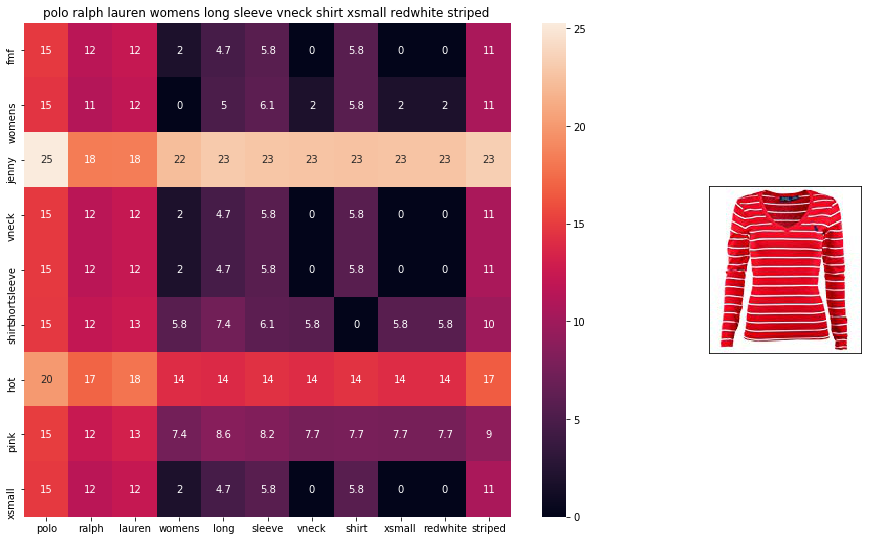

ASIN : B01MRL7J8F
Brand : Polo Ralph Lauren
euclidean distance from input : 2.9561791


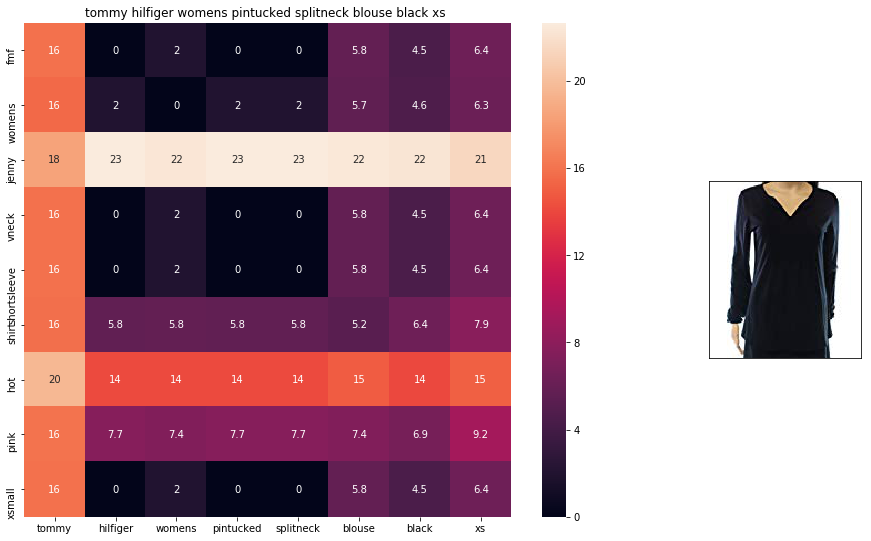

ASIN : B0759NHBZK
Brand : Tommy Hilfiger
euclidean distance from input : 2.9639406


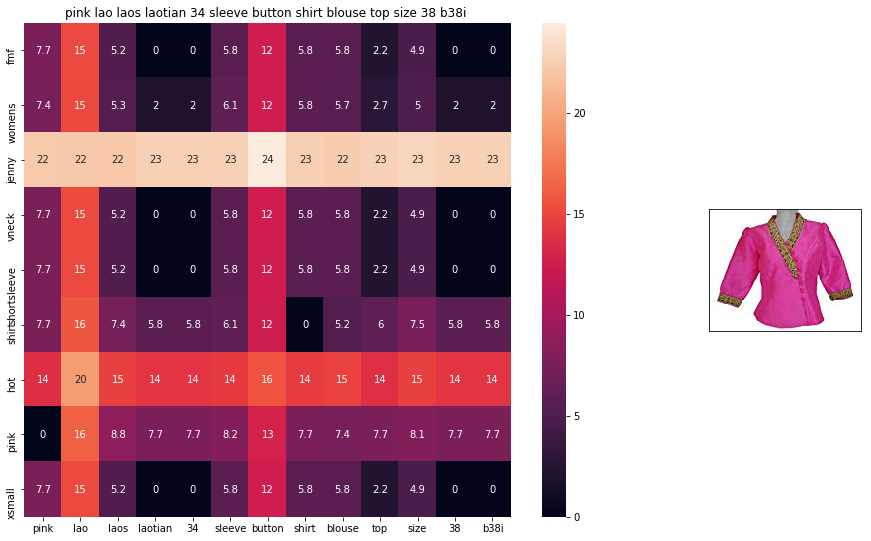

ASIN : B074GV434Q
Brand : Nanon
euclidean distance from input : 2.972928


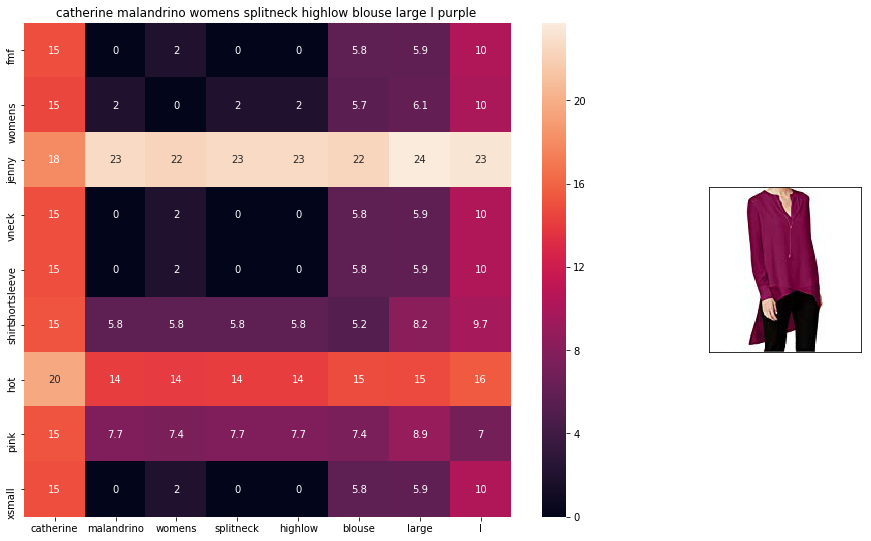

ASIN : B01N3T2WXO
Brand : Catherine Malandrino
euclidean distance from input : 2.974799


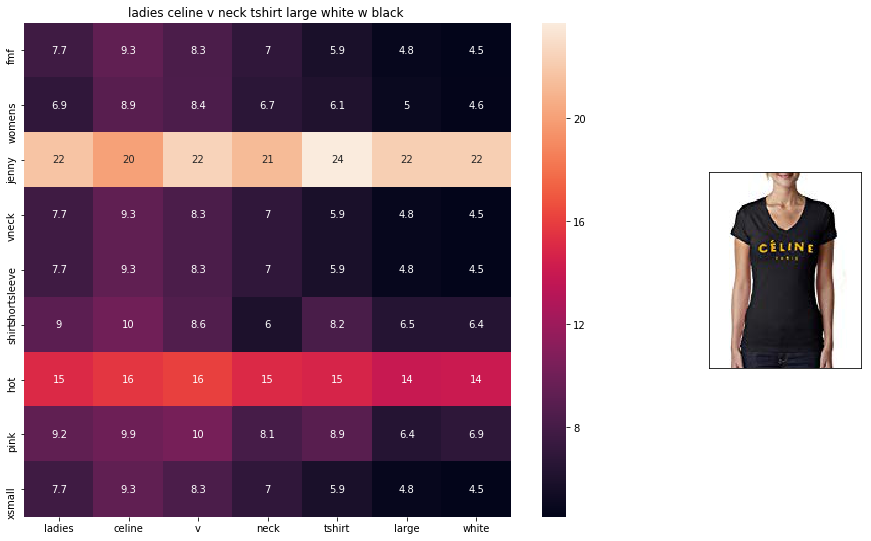

ASIN : B015S1TSNU
Brand : Fashion Place 4 Less
euclidean distance from input : 2.9800992


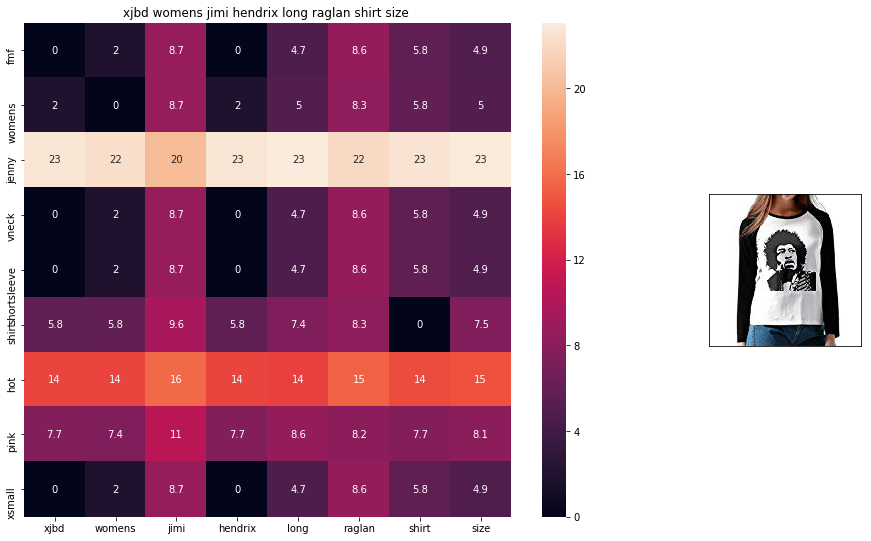

ASIN : B01M61UFBB
Brand : XJBD
euclidean distance from input : 2.9849317


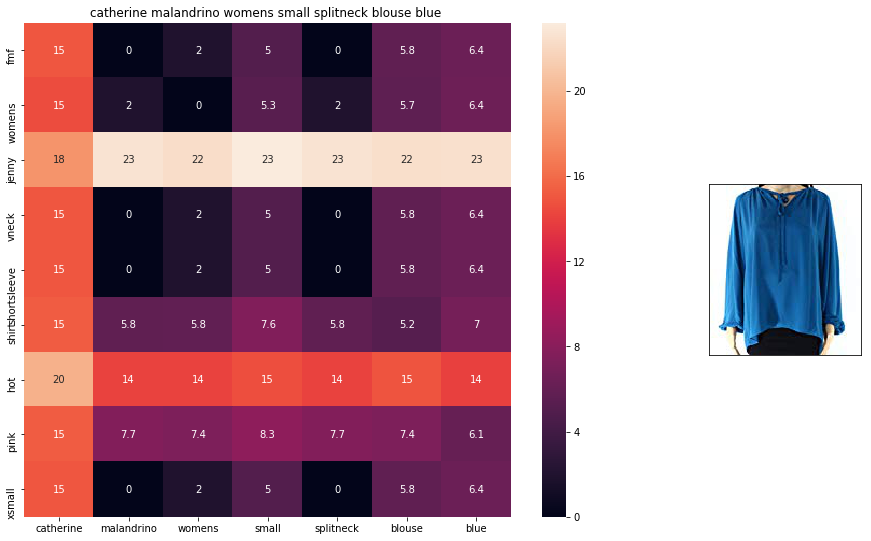

ASIN : B0756KFH85
Brand : Catherine Malandrino
euclidean distance from input : 2.987948


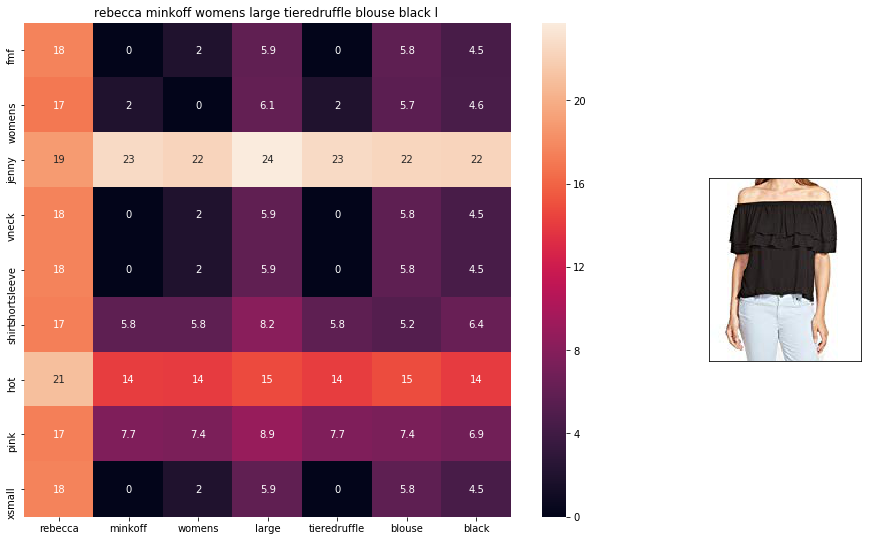

ASIN : B0758L8Q9C
Brand : Rebecca Minkoff
euclidean distance from input : 2.9927974


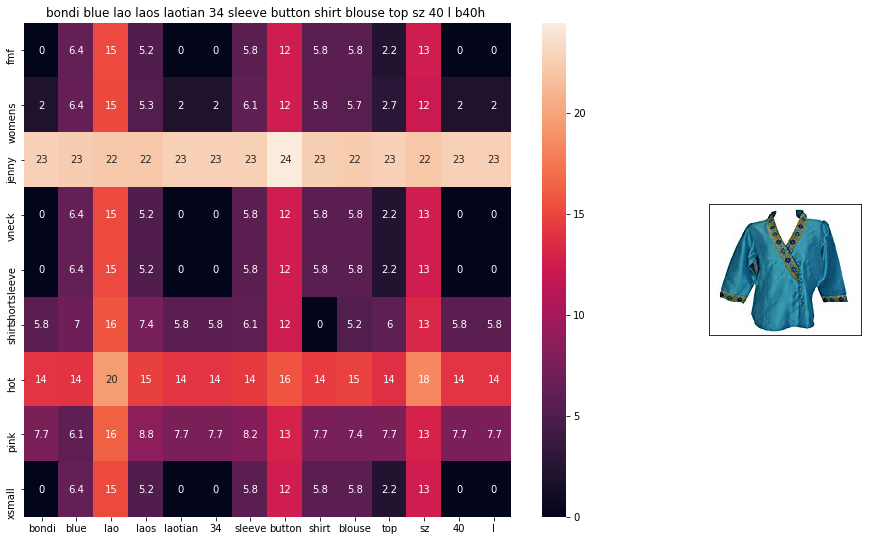

ASIN : B074J5KW4M
Brand : Nanon
euclidean distance from input : 2.9979358


In [187]:
weighted_w2v_model(104, 20)

### [9.6] Weighted similarity using brand and color.

In [188]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [189]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

In [190]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)


# in the give heat map, each cell contains the euclidean distance between words i, j

# Lets get similar products for product ID 1152 and 104 using brand and color

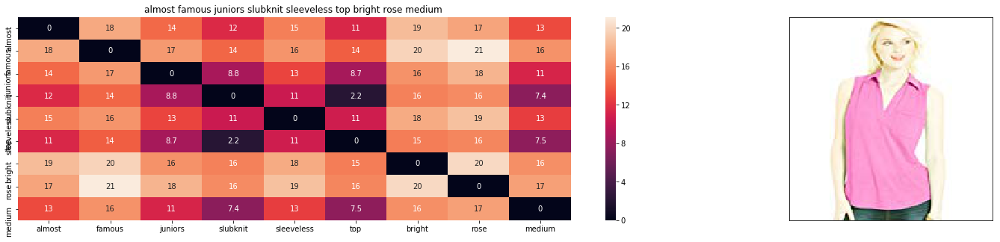

ASIN : B01CO4GLPM
Brand : Almost Famous
euclidean distance from input : 0.0009765625


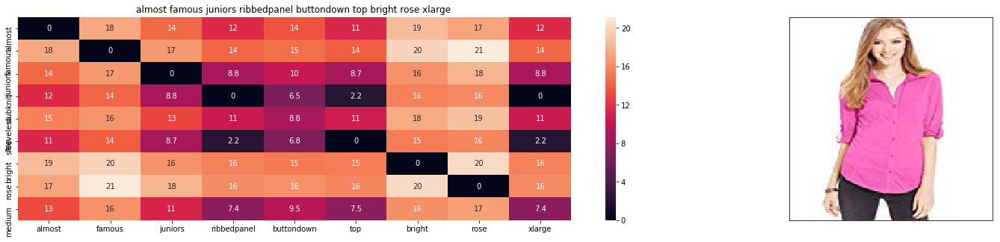

ASIN : B01CEUX0MI
Brand : Almost Famous
euclidean distance from input : 0.6413347244262695


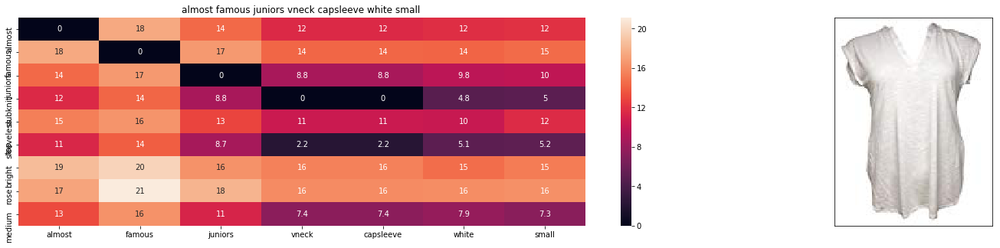

ASIN : B071HKKXW2
Brand : Almost Famous
euclidean distance from input : 2.3625888383852685


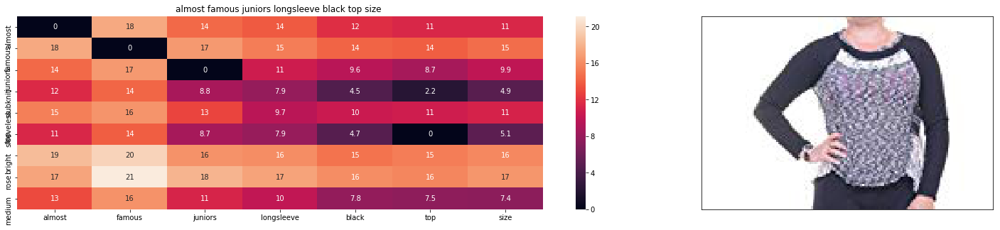

ASIN : B06XRPPVQC
Brand : Almost Famous
euclidean distance from input : 2.3636925256716457


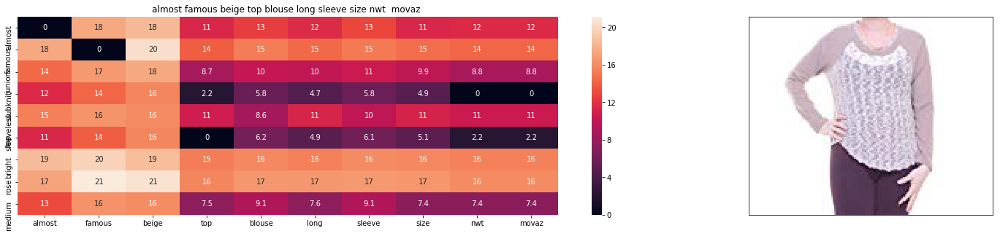

ASIN : B01NGZR1OQ
Brand : Almost Famous
euclidean distance from input : 2.491003278540298


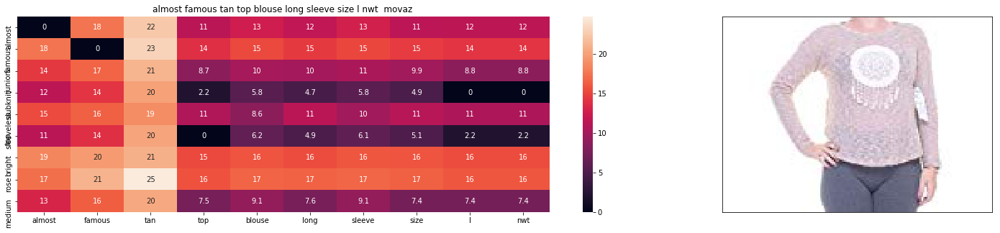

ASIN : B06XWXTP4J
Brand : Almost Famous
euclidean distance from input : 2.535862211035415


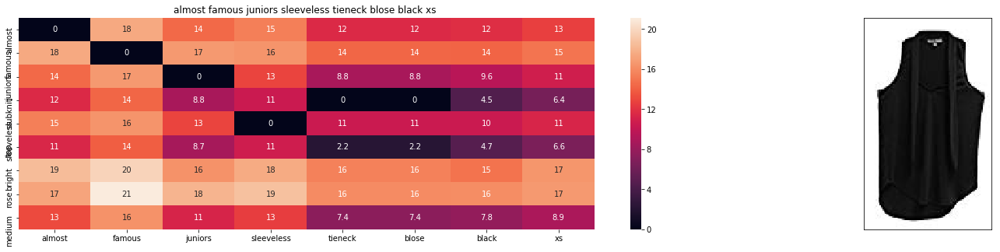

ASIN : B0745HMCJY
Brand : Almost Famous
euclidean distance from input : 2.558260066783342


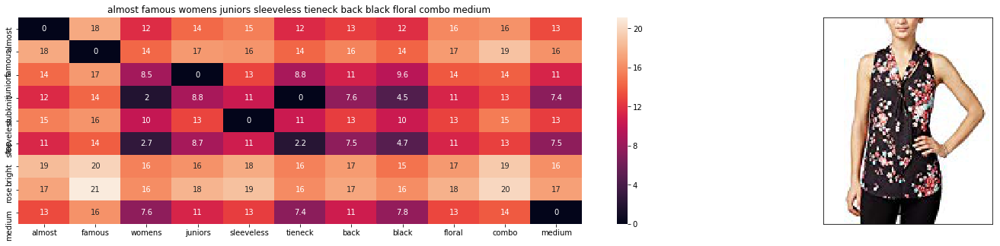

ASIN : B0738FTV95
Brand : Almost Famous
euclidean distance from input : 2.572834213054094


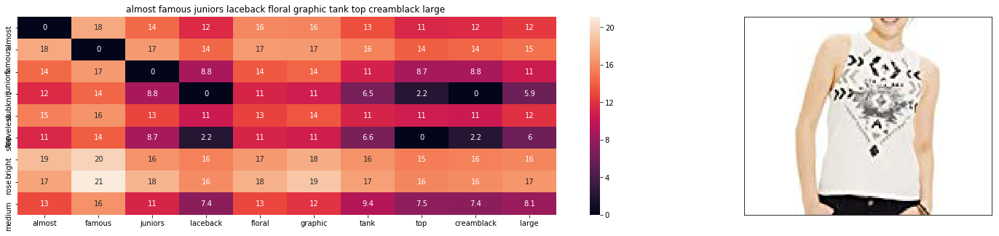

ASIN : B01JKN1FMY
Brand : Almost Famous
euclidean distance from input : 2.5942702293395996


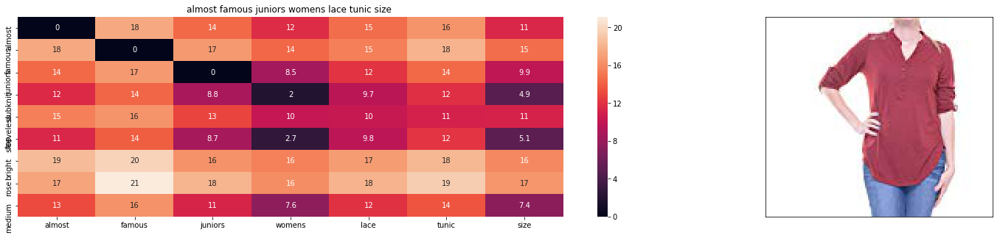

ASIN : B07289SXLV
Brand : Almost Famous
euclidean distance from input : 2.595728162573501


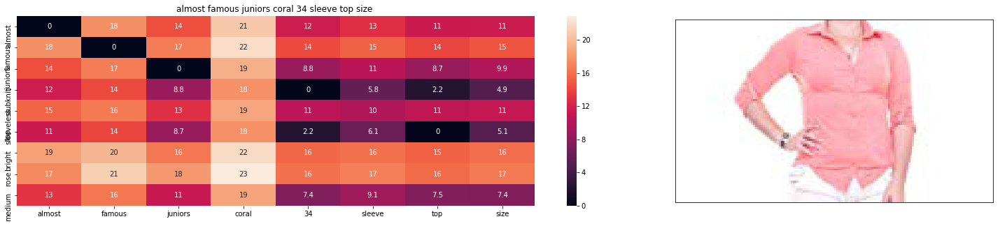

ASIN : B072NY56CZ
Brand : Almost Famous
euclidean distance from input : 2.5978077447878567


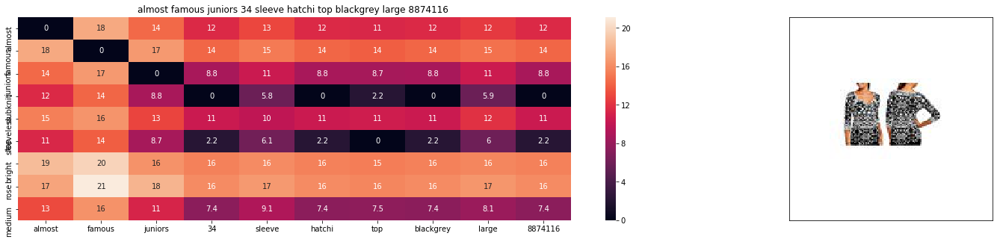

ASIN : B01GV3O5DW
Brand : Almost Famous
euclidean distance from input : 2.6076101303100585


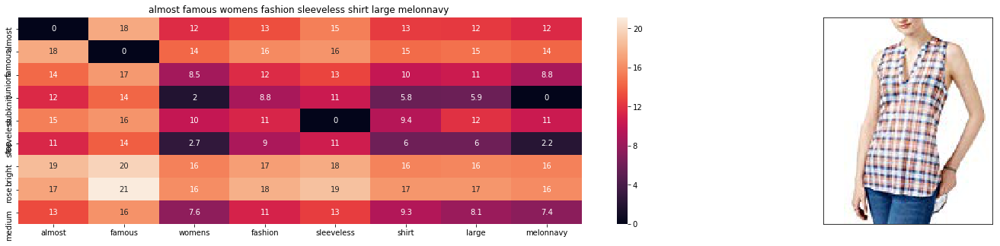

ASIN : B072NY3TZG
Brand : Almost Famous
euclidean distance from input : 2.6265071868896483


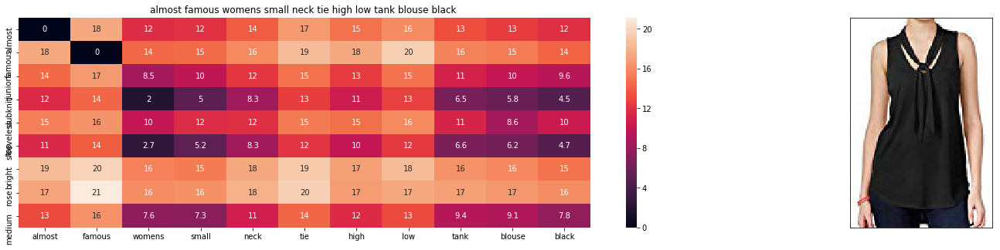

ASIN : B06XPX2JSN
Brand : Almost Famous
euclidean distance from input : 2.678464559363052


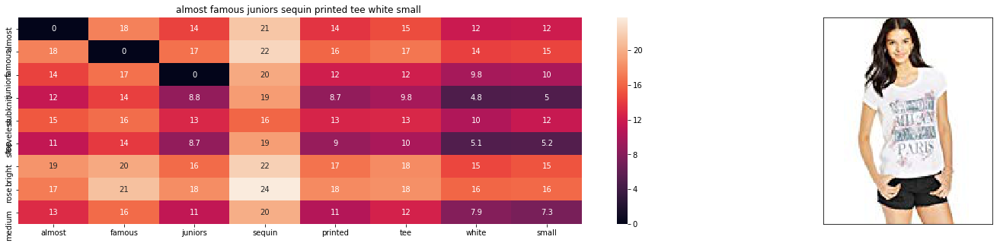

ASIN : B06XXQX6PJ
Brand : Almost Famous
euclidean distance from input : 2.745570234106704


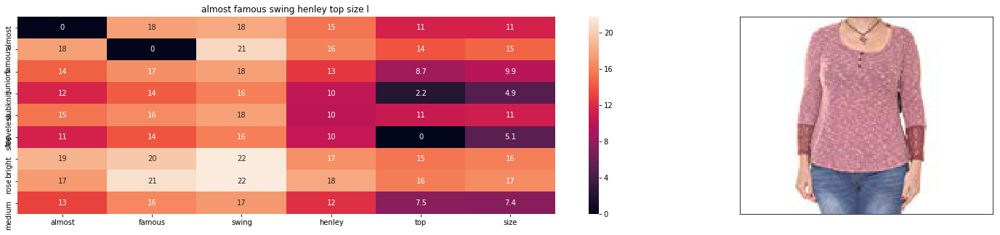

ASIN : B01MAZCL6C
Brand : Almost Famous
euclidean distance from input : 2.7818277872072903


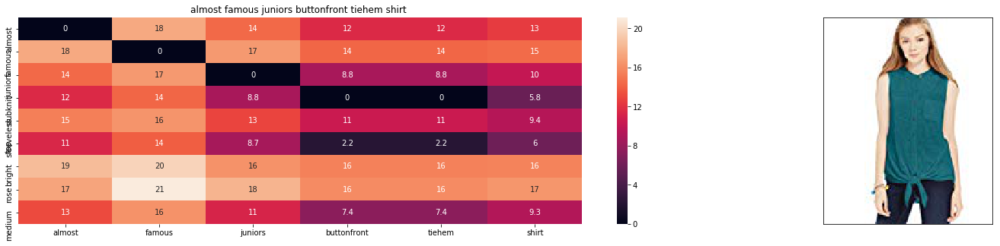

ASIN : B01L7D9KZY
Brand : Younique
euclidean distance from input : 2.7821894438403194


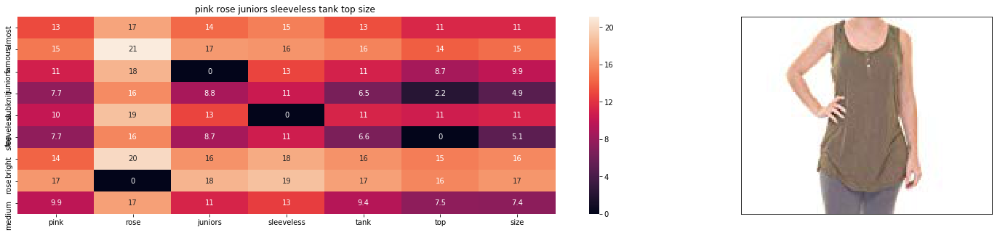

ASIN : B06XWXZJ45
Brand : PINK ROSE
euclidean distance from input : 2.7964584954981158


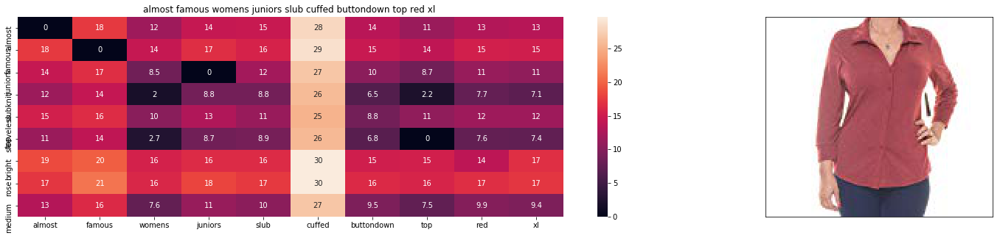

ASIN : B01M1OAUS3
Brand : Almost Famous
euclidean distance from input : 2.796913579748794


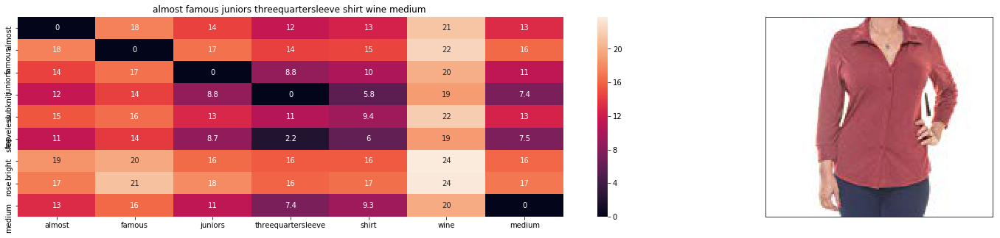

ASIN : B01MTRWVKO
Brand : Almost Famous
euclidean distance from input : 2.808156827734634


In [191]:
idf_w2v_brand(1152, 5, 5, 20)

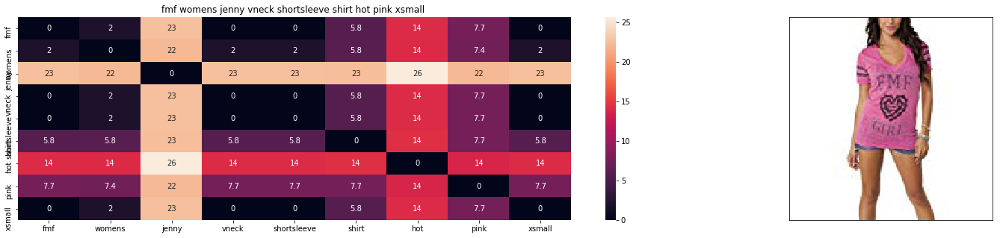

ASIN : B00HSDO8LO
Brand : FMF
euclidean distance from input : 0.0


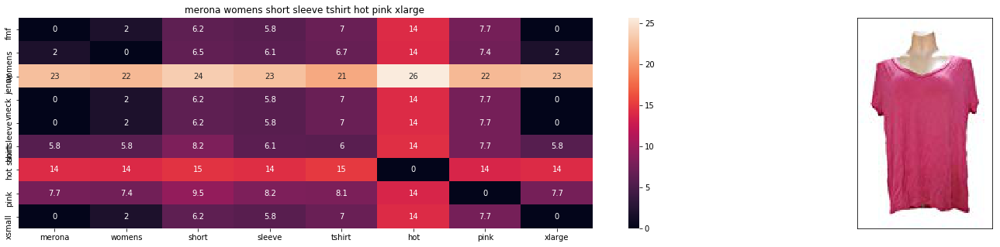

ASIN : B06XYNTBRH
Brand : Merona
euclidean distance from input : 2.0047349931616454


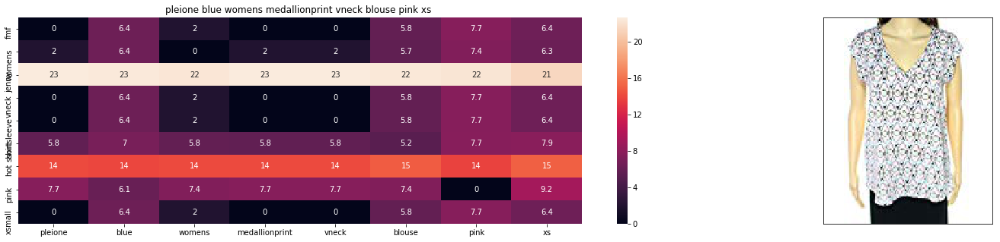

ASIN : B074VCV167
Brand : Pleione
euclidean distance from input : 2.172137546719995


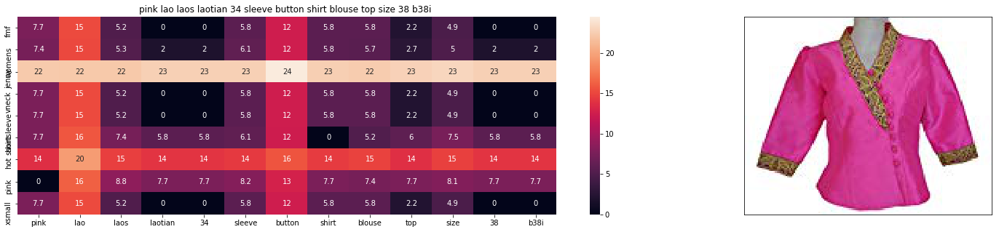

ASIN : B074GV434Q
Brand : Nanon
euclidean distance from input : 2.1935708047766354


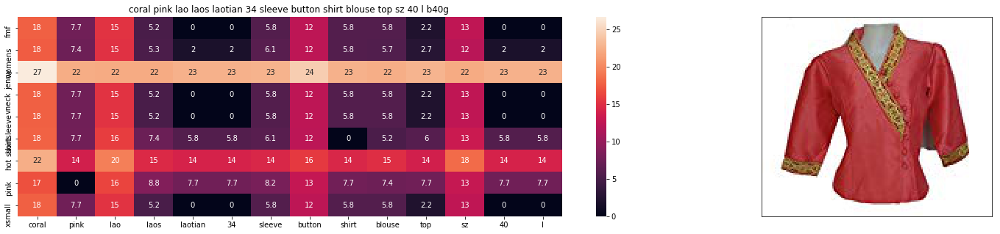

ASIN : B074HSQM6V
Brand : Nanon
euclidean distance from input : 2.2338285447973876


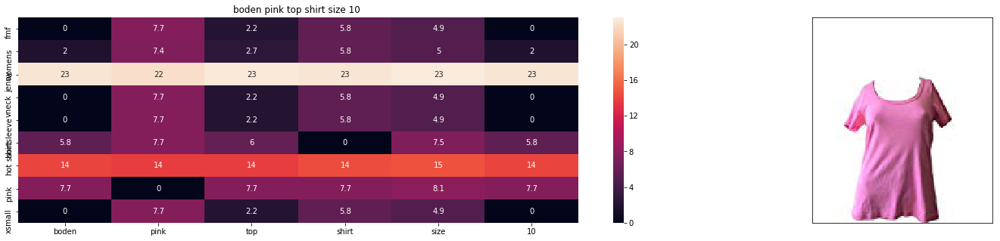

ASIN : B071NJQ5GF
Brand : BODEN
euclidean distance from input : 2.2408185960669185


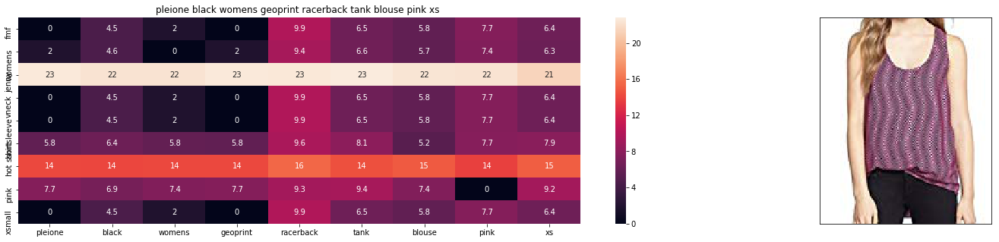

ASIN : B074MJYP1P
Brand : Pleione
euclidean distance from input : 2.2449795724768307


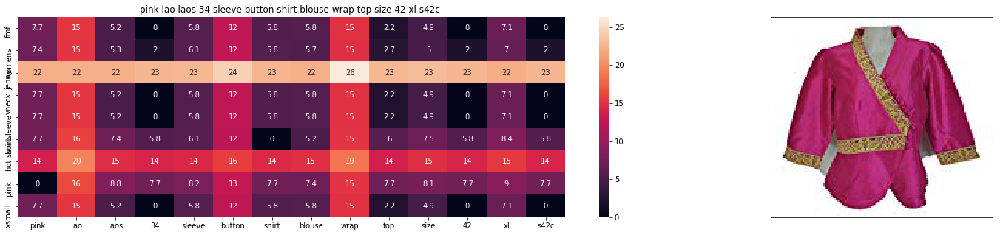

ASIN : B074J6FZ6Y
Brand : Nanon
euclidean distance from input : 2.246031952084985


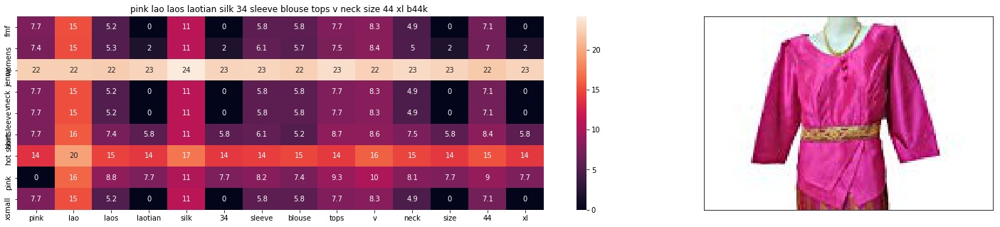

ASIN : B072DXG86D
Brand : Nanon
euclidean distance from input : 2.2526830675024656


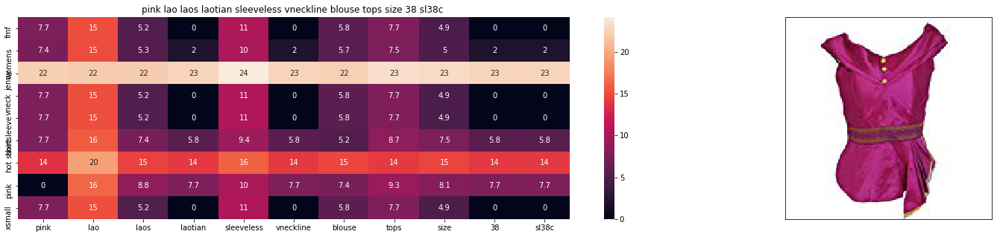

ASIN : B074J2XHK2
Brand : Nanon
euclidean distance from input : 2.264398670377221


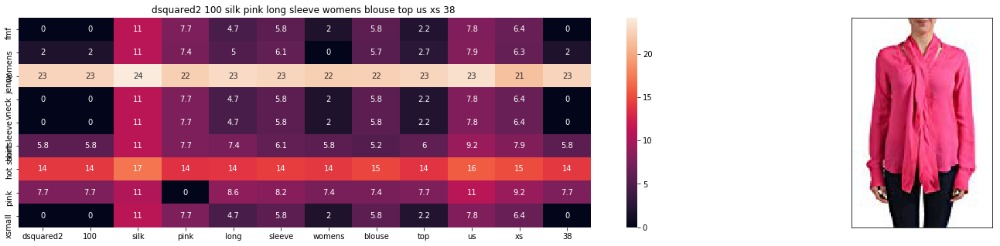

ASIN : B01M087PQ5
Brand : DSQUARED2
euclidean distance from input : 2.2669397355932857


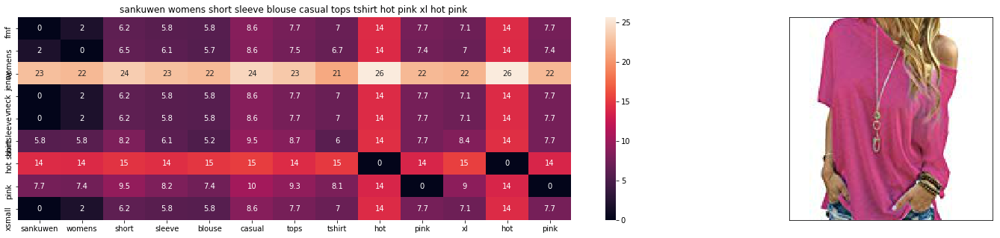

ASIN : B06X41YYZ8
Brand : Sankuwen
euclidean distance from input : 2.300787786291763


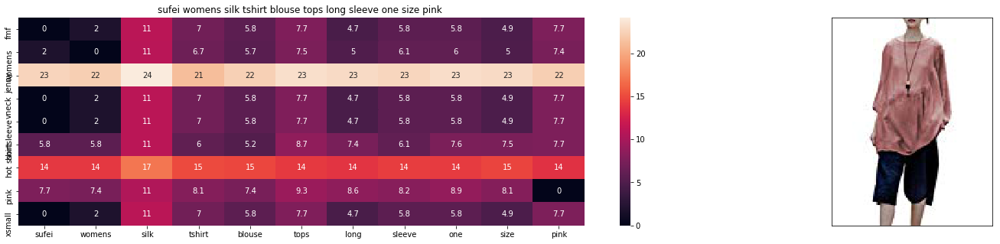

ASIN : B074N68P4F
Brand : Sufei
euclidean distance from input : 2.3022054674048094


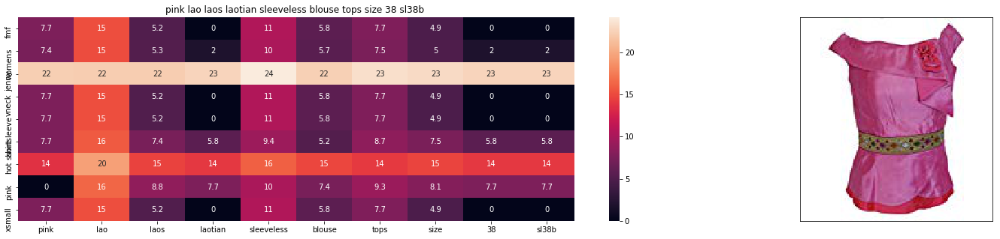

ASIN : B074J34D1V
Brand : Nanon
euclidean distance from input : 2.3037199022192625


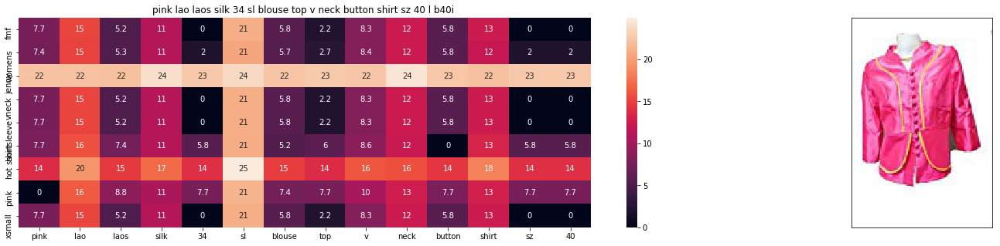

ASIN : B01IN9FY9Q
Brand : Nanon
euclidean distance from input : 2.3078872682470943


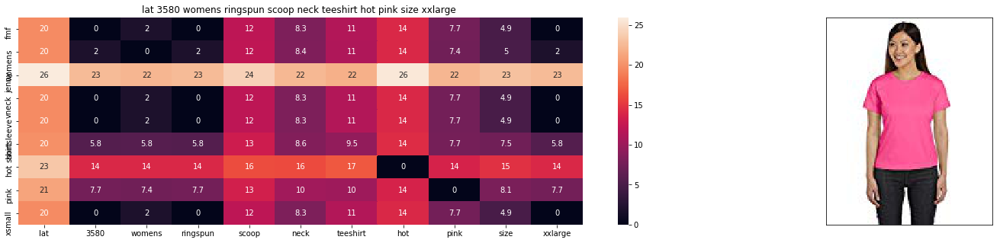

ASIN : B008P99GOE
Brand : L.A.T Sportswear
euclidean distance from input : 2.309849218176528


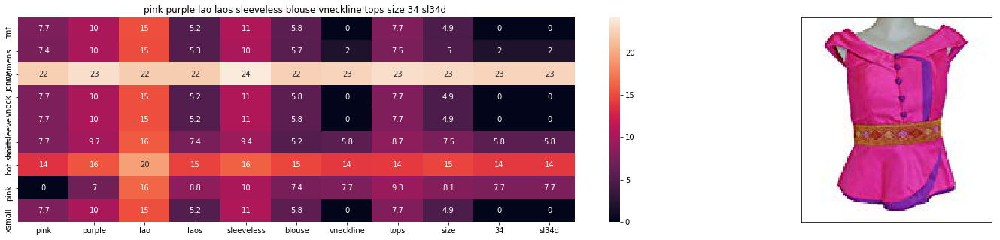

ASIN : B074KCYKJP
Brand : Nanon
euclidean distance from input : 2.314429283322778


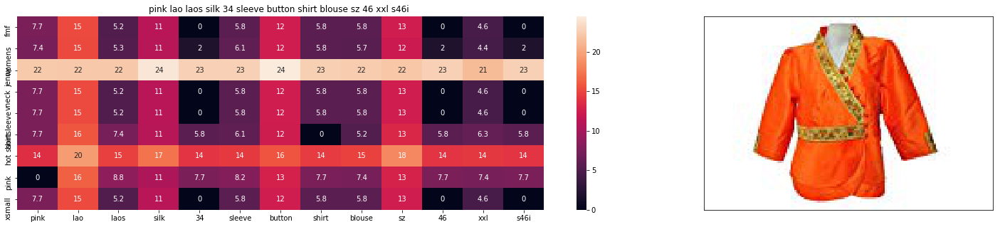

ASIN : B0727QZZV1
Brand : Nanon
euclidean distance from input : 2.321295929135766


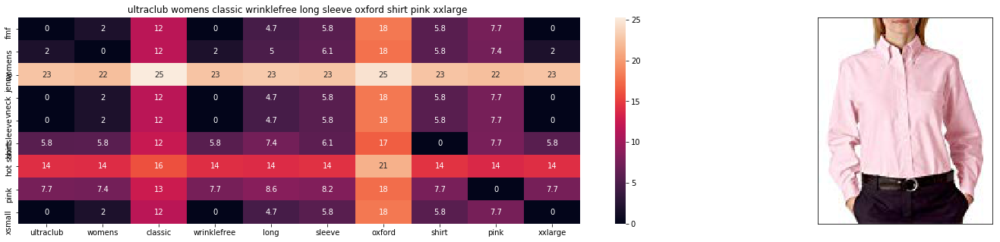

ASIN : B0038MPIKE
Brand : UltraClub
euclidean distance from input : 2.3740352632422117


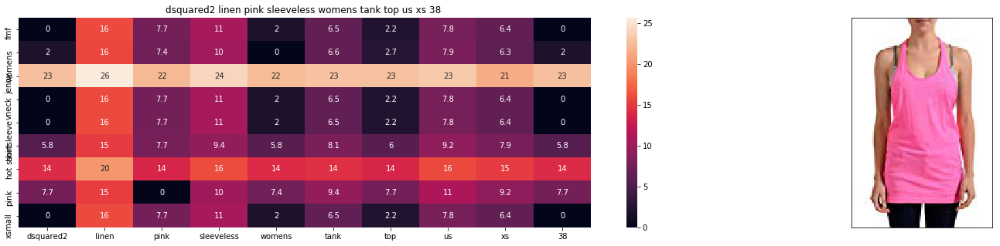

ASIN : B01M0KFIFW
Brand : DSQUARED2
euclidean distance from input : 2.3746576311010985


In [192]:
idf_w2v_brand(104, 5, 5, 20)

# [10.2] Keras and Tensorflow to extract features

In [2]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

Using TensorFlow backend.


In [158]:
import glob
c = glob.glob("images2/images/*.jpg")
asin = []
for a in range(len(c)):
    asin.append(c[a].split(".")[0].split("\\")[1])
    

In [10]:
import requests
start = datetime.datetime.now()
print("Downloading images for feature extraction using CNN")
for index,image_url in tqdm(data.iterrows()):
    if image_url[0] not in asin:
        img_data = requests.get(image_url[3]).content
        with open('images/'+image_url[0]+'.jpg', 'wb') as handler:
            handler.write(img_data)
            handler.close
    else:
        pass
        

print("Time taken to execute this cell is: ", datetime.datetime.now() - start)

16317it [1:40:31,  1.44it/s]


Time taken to execute this cell is:  1:40:31.196535


In [117]:
# https://gist.github.com/fchollet/f35fbc80e066a49d65f1688a7e99f069
# Code reference: https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html



# This code takes 40 minutes to run on a modern GPU (graphics card) 
# like Nvidia  1050.
# GPU (NVidia 1050): 0.175 seconds per image

# This codse takes 160 minutes to run on a high end i7 CPU
# CPU (i7): 0.615 seconds per image.

#Do NOT run this code unless you want to wait a few hours for it to generate output

# each image is converted into 25088 length dense-vector



# dimensions of our images.
img_width, img_height = 224, 224

top_model_weights_path = 'bottleneck_fc_model.h5'
train_data_dir ='images2/' 
nb_train_samples = 16317
epochs = 50
batch_size = 1


def save_bottlebeck_features():
    img_width, img_height = 224, 224

    top_model_weights_path = 'bottleneck_fc_model.h5'
    train_data_dir ='images2/' 
    nb_train_samples = 16317
    epochs = 50
    batch_size = 1
    #Function to compute VGG-16 CNN for image feature extraction.
    
    asins = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    
    # build the VGG16 network
    model = applications.VGG16(include_top=False, weights='imagenet')
    model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    for i in generator.filenames:
        asins.append(i[7:-5])

    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)
    bottleneck_features_train = bottleneck_features_train.reshape((16317,25088))
    
    np.save(open('16k_data_cnn_features.npy', 'wb'), bottleneck_features_train)
    np.save(open('16k_data_cnn_feature_asins.npy', 'wb'), np.array(asins))
    



In [118]:
save_bottlebeck_features()

Found 16317 images belonging to 1 classes.


# [10.3] Visual features based product similarity.

In [164]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
data = pd.read_pickle('16k_apperal_data_preprocessed')
df_asins = list(data['asin'])
#df_asins = asins

from IPython.display import display, Image, SVG, Math, YouTubeVideo


#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, num_results):
    doc_id = asin.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    
    for i in range(len(indices)):
       
        rows = data[['medium_image_url','title']].loc[data['asin']==asin[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])




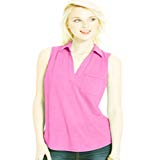

Product Title:  almost famous juniors slubknit sleeveless top bright rose medium 
Euclidean Distance from input image: 0.082679726
Amazon Url: www.amzon.com/dp/B01CO4GLP


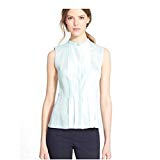

Product Title:  tory burch linensilk pleated front sleeveless tunic seaside size 6 small 
Euclidean Distance from input image: 38.77785
Amazon Url: www.amzon.com/dp/B06ZY9L8Q


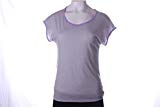

Product Title:  jenni short sleeve top bright lilac 
Euclidean Distance from input image: 39.61191
Amazon Url: www.amzon.com/dp/B01HFP47A


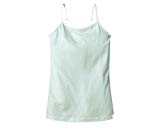

Product Title:  felina lingerie cotton stretch camisole w hint modal assorted colors medium mint green 
Euclidean Distance from input image: 39.702103
Amazon Url: www.amzon.com/dp/B0716PDM8


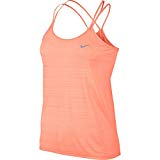

Product Title:  nike golf womens sport polo two chlorine blue  small 
Euclidean Distance from input image: 40.051567
Amazon Url: www.amzon.com/dp/B004QO9TB


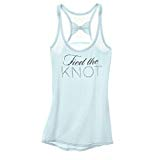

Product Title:  victorias secret womens bride rhinestones tank top large 
Euclidean Distance from input image: 40.12507
Amazon Url: www.amzon.com/dp/B06XCR8NL


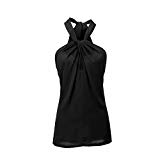

Product Title:  black sexy chiffon night club bky12store3027 
Euclidean Distance from input image: 40.338108
Amazon Url: www.amzon.com/dp/B018PKYUC


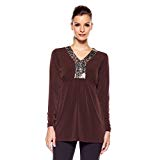

Product Title:  hot hollywood sequin leopard henley 203608 brown 
Euclidean Distance from input image: 40.569313
Amazon Url: www.amzon.com/dp/B074HF4HM


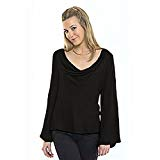

Product Title:  love sam cowl neck bell sleeve top extra small black 
Euclidean Distance from input image: 40.66513
Amazon Url: www.amzon.com/dp/B00WRSRHR


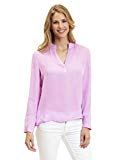

Product Title:  robert graham womens blouse trish lavender small 
Euclidean Distance from input image: 40.770866
Amazon Url: www.amzon.com/dp/B071NQ52L


In [165]:
get_similar_products_cnn(1152, 10)

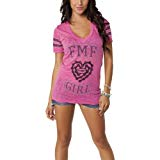

Product Title:  fmf womens jenny vneck shortsleeve shirt hot pink xsmall 
Euclidean Distance from input image: 0.044194173
Amazon Url: www.amzon.com/dp/B00HSDO8L


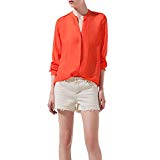

Product Title:  summer rivet chiffon blouse long sleeve orange bky50271 
Euclidean Distance from input image: 39.71173
Amazon Url: www.amzon.com/dp/B00R08HSE


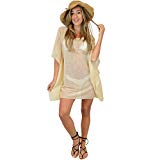

Product Title:  ohconcept collection net cover tunic nude 
Euclidean Distance from input image: 42.39933
Amazon Url: www.amzon.com/dp/B01FGDBC6


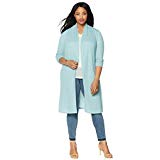

Product Title:  g giuliana rib knit boyfriend cardigan 522292 aqua ivory xs 
Euclidean Distance from input image: 43.17341
Amazon Url: www.amzon.com/dp/B0759YFWT


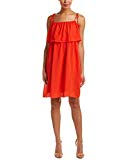

Product Title:  laundry shelli segal womens shift dress 8 red 
Euclidean Distance from input image: 43.246094
Amazon Url: www.amzon.com/dp/B074TT2J1


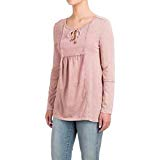

Product Title:  cable  gauge large dark blush peasant top 
Euclidean Distance from input image: 43.33209
Amazon Url: www.amzon.com/dp/B074XPJWZ


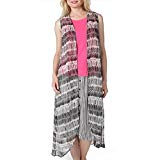

Product Title:  steve madden aztec print vest 
Euclidean Distance from input image: 43.809467
Amazon Url: www.amzon.com/dp/B01N3YL6N


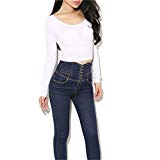

Product Title:  womens sexy bare midriff tops breathable oneck long sleeve slim tshirt 
Euclidean Distance from input image: 43.909775
Amazon Url: www.amzon.com/dp/B01MRGT3E


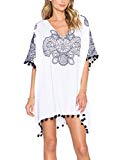

Product Title:  marolaya womens tassel totem print tops plus size blouse dresses shirt 
Euclidean Distance from input image: 43.943935
Amazon Url: www.amzon.com/dp/B01CE40V4


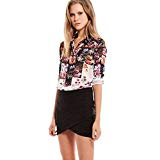

Product Title:  summer women colorful flower square chiffon blouse bky12store2009 
Euclidean Distance from input image: 43.985382
Amazon Url: www.amzon.com/dp/B011XQKR0


In [166]:
get_similar_products_cnn(104, 10)

# Stacking IDF, brand , color and image features

In [193]:
def idf_w2v_brand_image(doc_id, w1, w2,w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    image_feat_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * image_feat_dist)/float(w1 + w2 + w3)

    # np.argsort will return indices of smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)



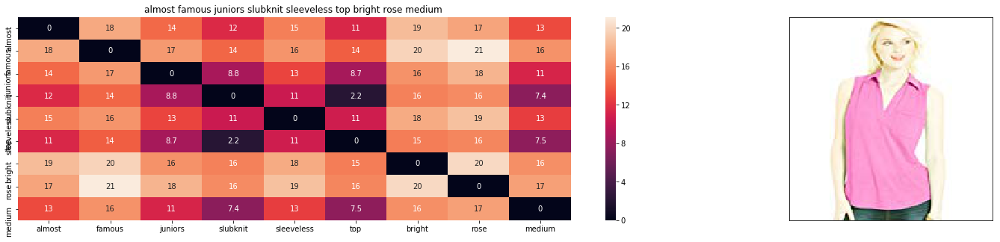

ASIN : B01CO4GLPM
Brand : Almost Famous
euclidean distance from input : 0.0006510416666666666


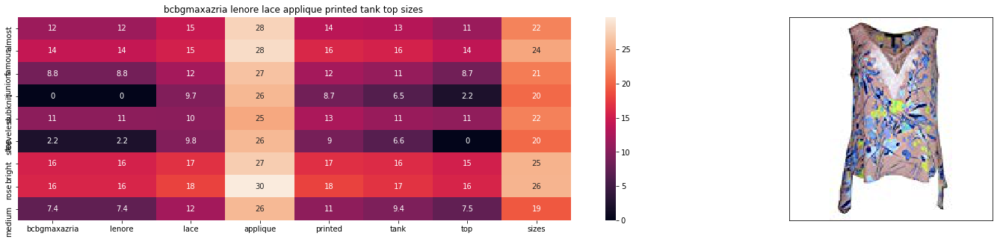

ASIN : B0734CCTKT
Brand : BCBGMAXAZRIA
euclidean distance from input : 16.411330113896884


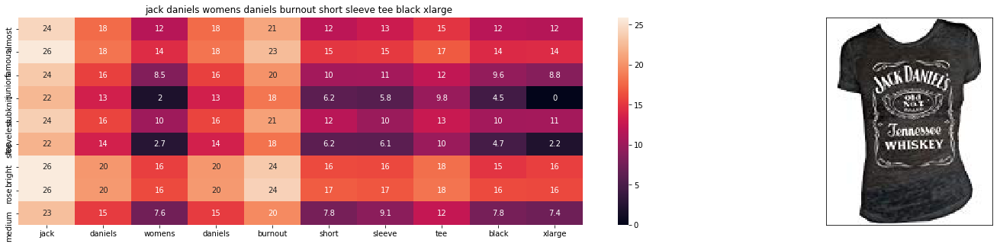

ASIN : B005G7QLU0
Brand : Jack Daniels
euclidean distance from input : 16.81269958074915


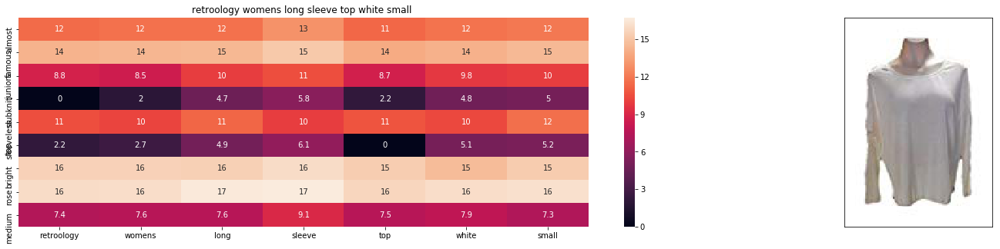

ASIN : B06XH2N9SG
Brand : Retro-ology
euclidean distance from input : 16.894240642150518


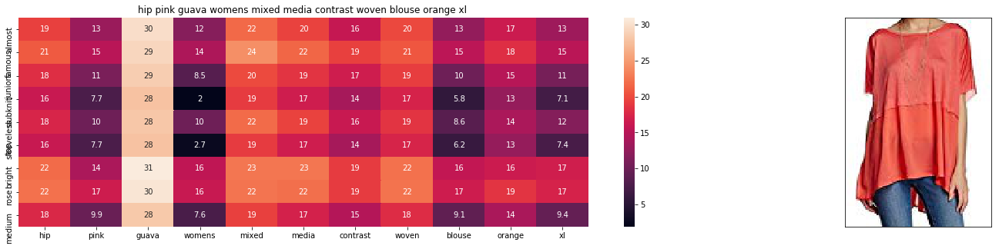

ASIN : B074MJ393Y
Brand : Hip
euclidean distance from input : 16.941090474614658


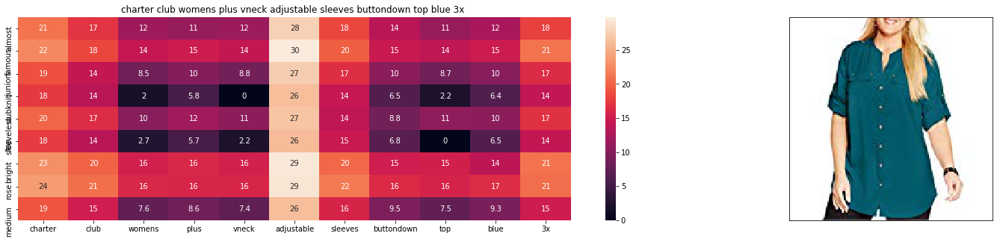

ASIN : B01MSNQS22
Brand : Charter Club
euclidean distance from input : 16.98842504080164


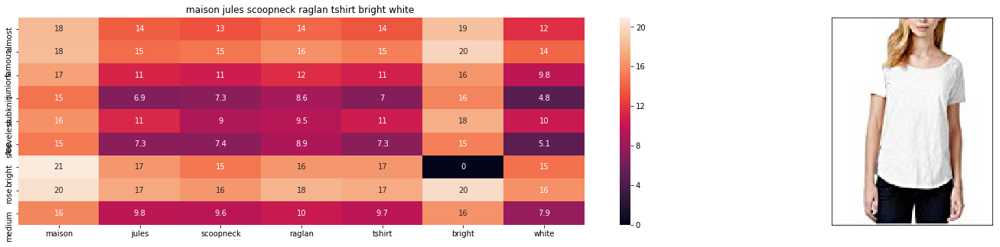

ASIN : B06XCKNRSY
Brand : Maison Jules
euclidean distance from input : 17.024191006581265


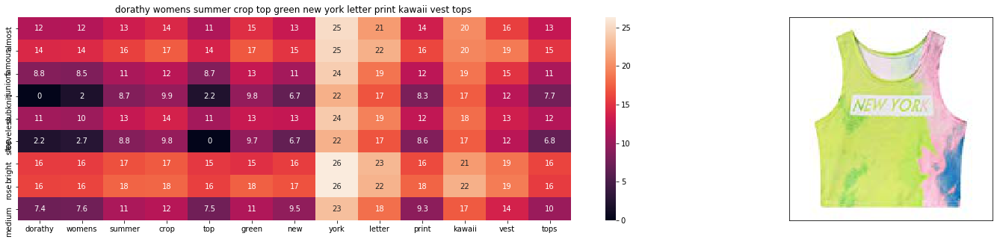

ASIN : B01HEMRIME
Brand : Dorathy
euclidean distance from input : 17.025745918441967


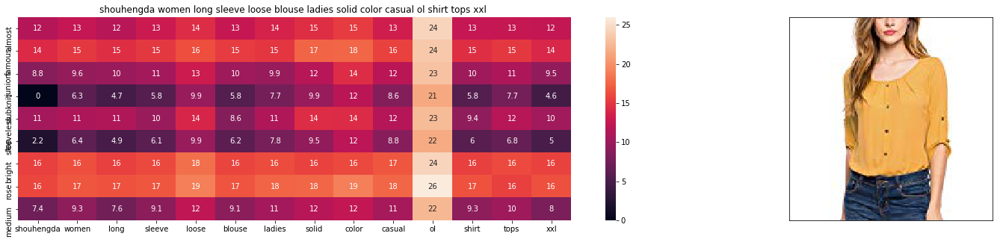

ASIN : B01MS7H2R5
Brand : Shouhengda
euclidean distance from input : 17.075694292872306


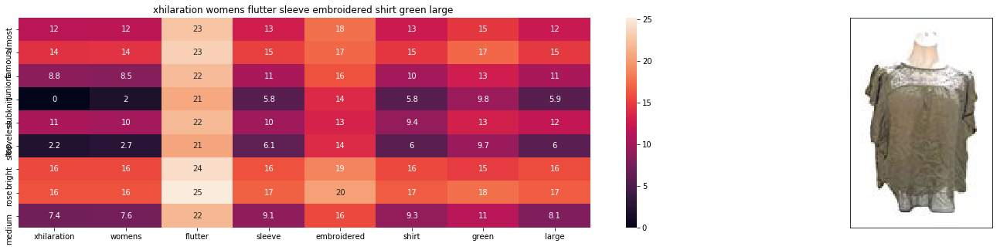

ASIN : B072M9RP4C
Brand : Xhilaration
euclidean distance from input : 17.155385385045566


In [197]:
idf_w2v_brand_image(1152,1,1,1,10)

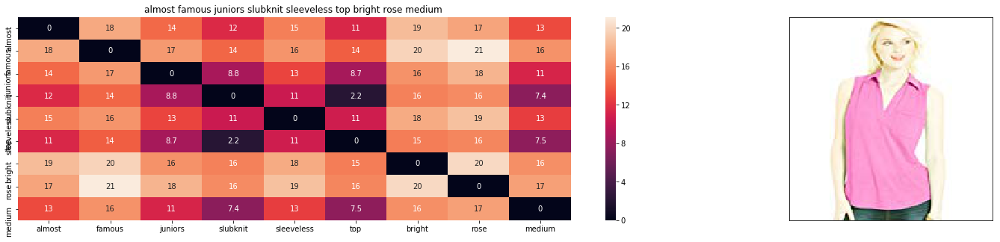

ASIN : B01CO4GLPM
Brand : Almost Famous
euclidean distance from input : 0.0013950892857142857


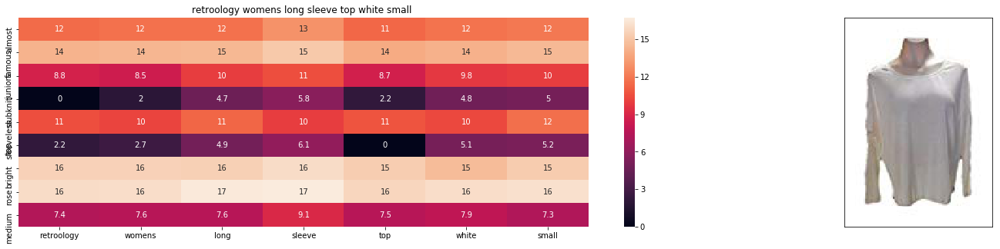

ASIN : B06XH2N9SG
Brand : Retro-ology
euclidean distance from input : 9.537382851566704


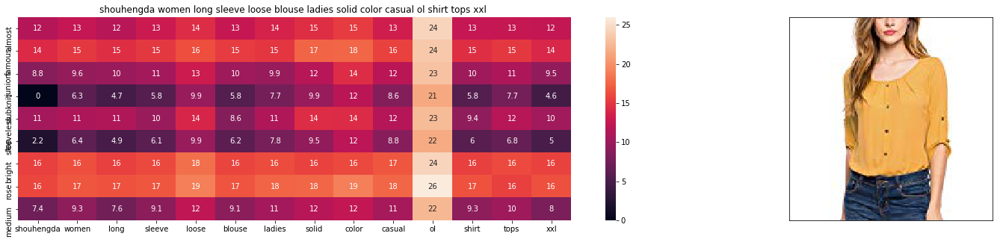

ASIN : B01MS7H2R5
Brand : Shouhengda
euclidean distance from input : 9.668196563247765


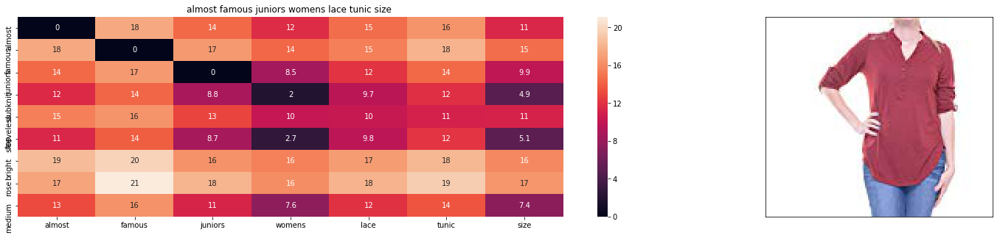

ASIN : B07289SXLV
Brand : Almost Famous
euclidean distance from input : 9.695501451164974


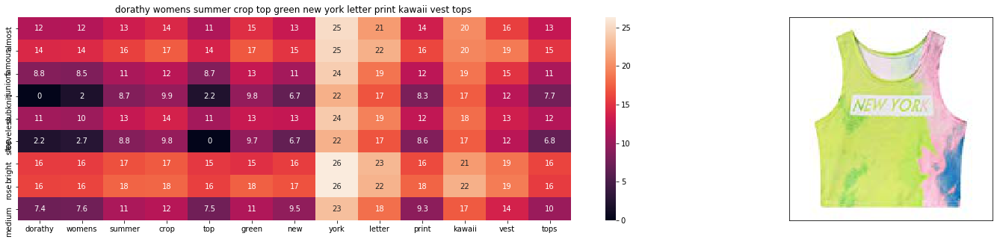

ASIN : B01HEMRIME
Brand : Dorathy
euclidean distance from input : 9.747378234390343


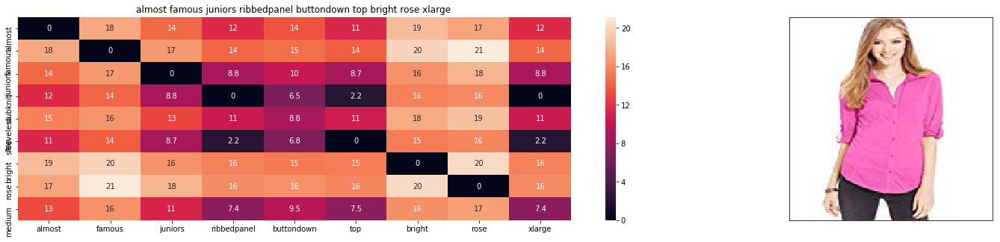

ASIN : B01CEUX0MI
Brand : Almost Famous
euclidean distance from input : 9.782379422869


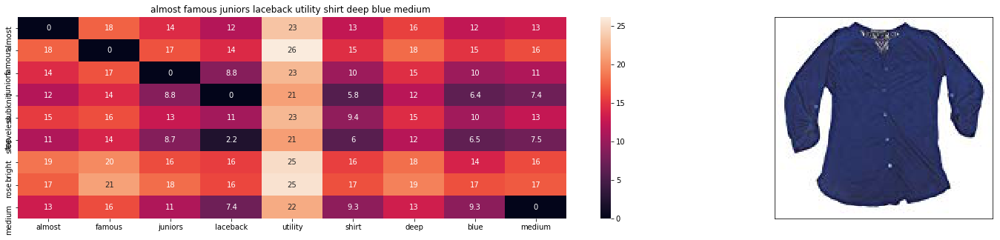

ASIN : B074RJZPN1
Brand : Almost Famous
euclidean distance from input : 9.978289195469447


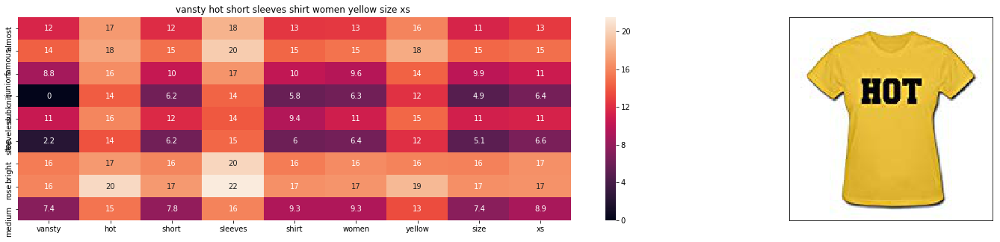

ASIN : B01EFSL5DI
Brand : Vansty
euclidean distance from input : 9.983036967789493


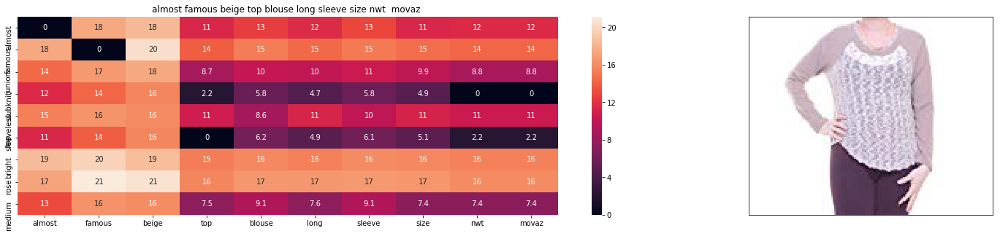

ASIN : B01NGZR1OQ
Brand : Almost Famous
euclidean distance from input : 9.985684382247564


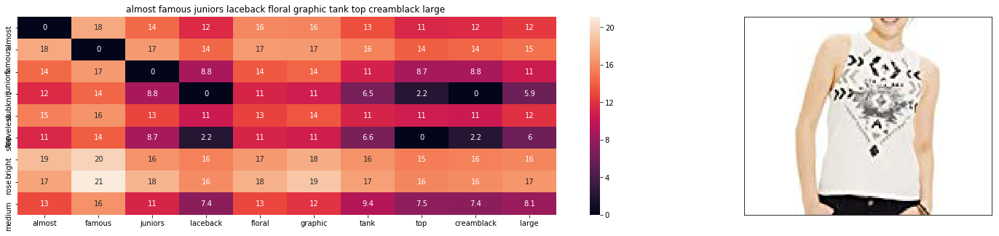

ASIN : B01JKN1FMY
Brand : Almost Famous
euclidean distance from input : 10.004372051783971


In [198]:
idf_w2v_brand_image(1152,5,1,1,10)

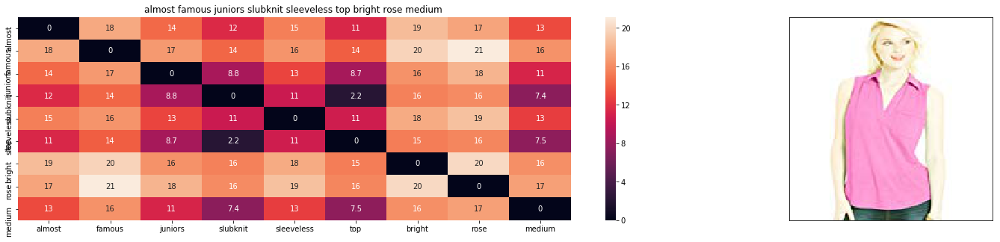

ASIN : B01CO4GLPM
Brand : Almost Famous
euclidean distance from input : 0.00027901785714285713


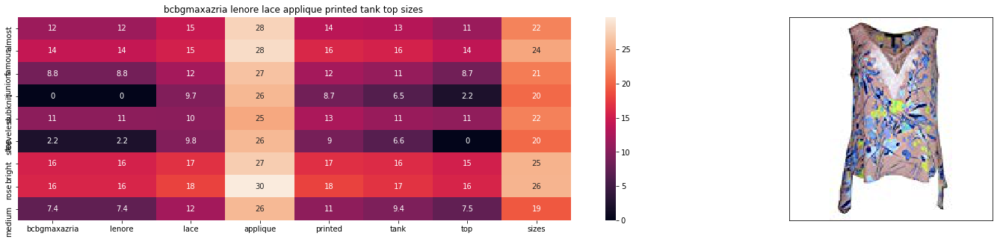

ASIN : B0734CCTKT
Brand : BCBGMAXAZRIA
euclidean distance from input : 8.433135616117623


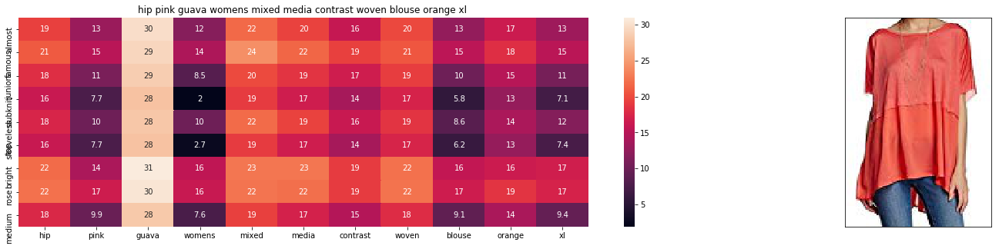

ASIN : B074MJ393Y
Brand : Hip
euclidean distance from input : 8.660175770710953


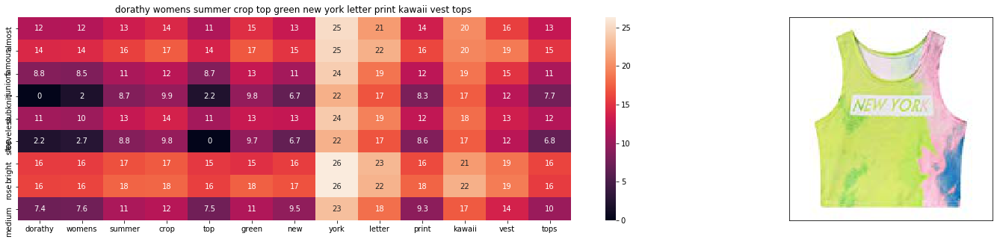

ASIN : B01HEMRIME
Brand : Dorathy
euclidean distance from input : 8.696456675208372


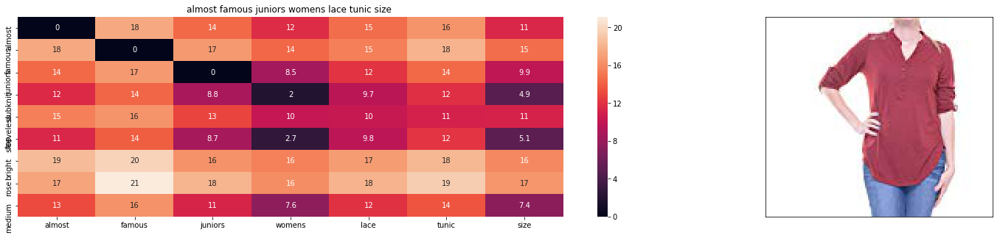

ASIN : B07289SXLV
Brand : Almost Famous
euclidean distance from input : 8.708441637309852


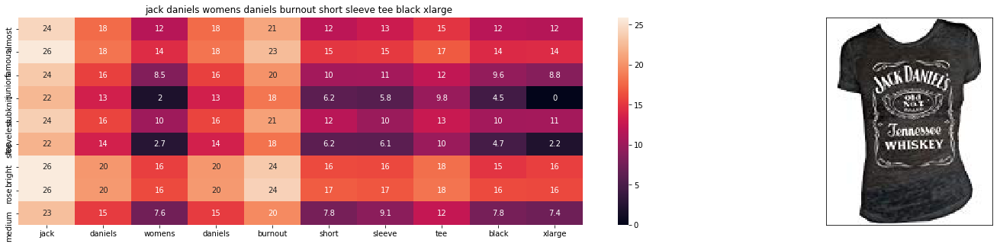

ASIN : B005G7QLU0
Brand : Jack Daniels
euclidean distance from input : 8.71730056950083


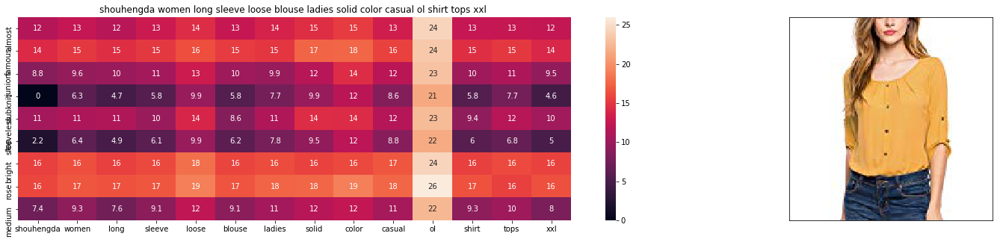

ASIN : B01MS7H2R5
Brand : Shouhengda
euclidean distance from input : 8.717863121392805


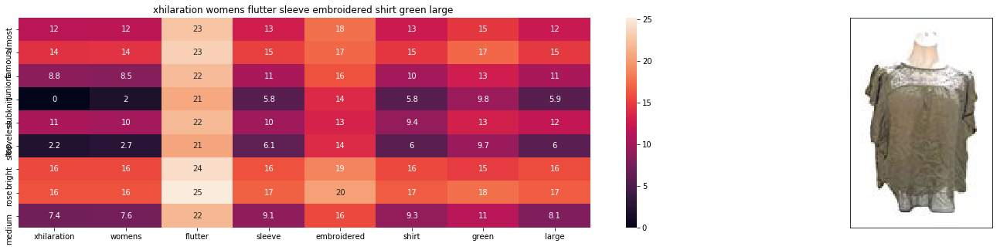

ASIN : B072M9RP4C
Brand : Xhilaration
euclidean distance from input : 8.752016446609915


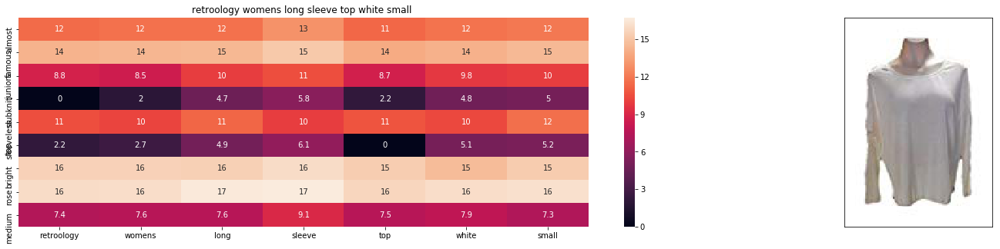

ASIN : B06XH2N9SG
Brand : Retro-ology
euclidean distance from input : 8.752246738672845


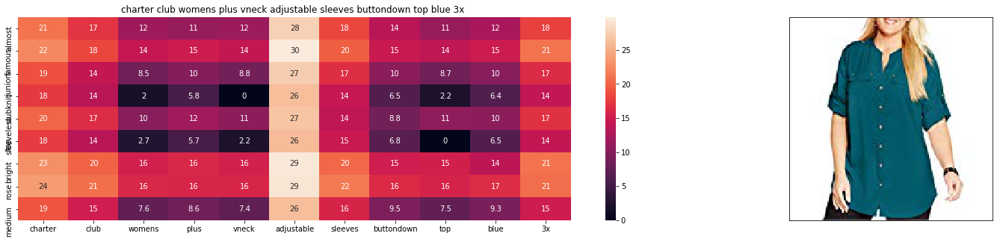

ASIN : B01MSNQS22
Brand : Charter Club
euclidean distance from input : 8.792611480951898


In [199]:
idf_w2v_brand_image(1152,1,5,1,10)

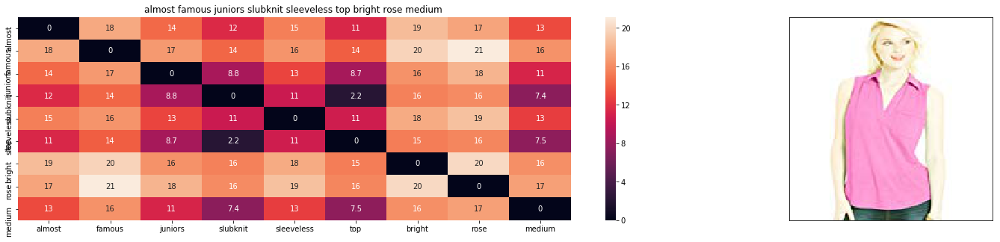

ASIN : B01CO4GLPM
Brand : Almost Famous
euclidean distance from input : 0.00027901785714285713


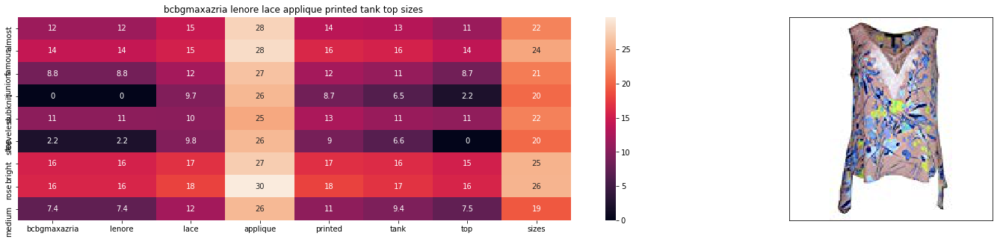

ASIN : B0734CCTKT
Brand : BCBGMAXAZRIA
euclidean distance from input : 30.408052261424558


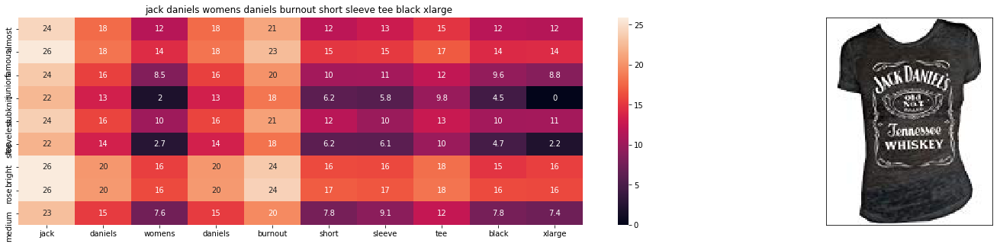

ASIN : B005G7QLU0
Brand : Jack Daniels
euclidean distance from input : 31.179452055079715


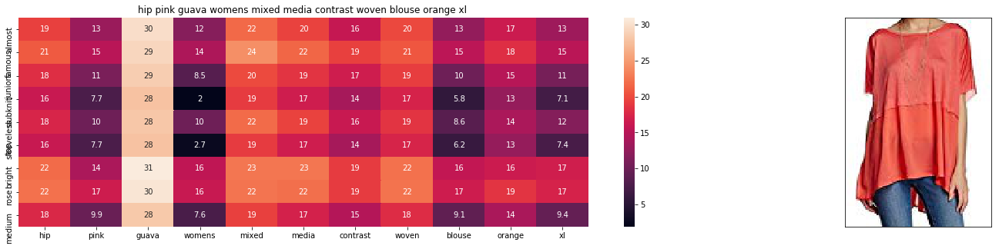

ASIN : B074MJ393Y
Brand : Hip
euclidean distance from input : 31.80741373559797


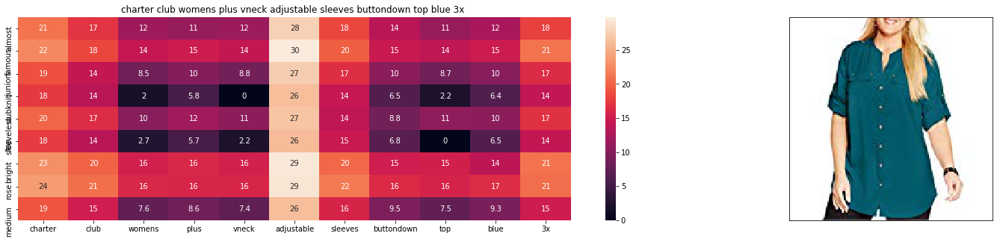

ASIN : B01MSNQS22
Brand : Charter Club
euclidean distance from input : 31.860603377035805


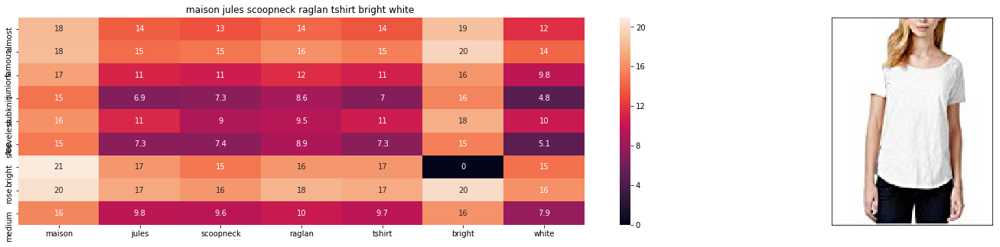

ASIN : B06XCKNRSY
Brand : Maison Jules
euclidean distance from input : 32.211026644945264


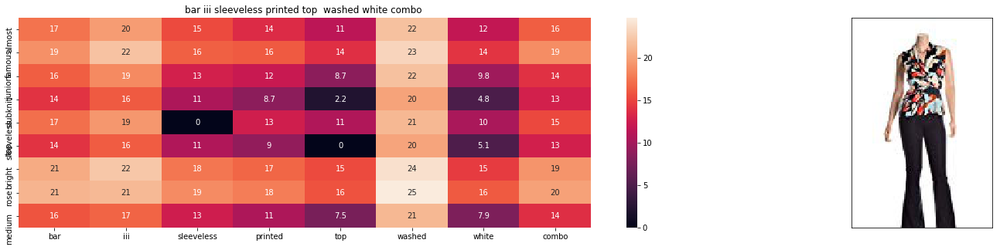

ASIN : B01F5Z30O2
Brand : Bar III
euclidean distance from input : 32.25471351170552


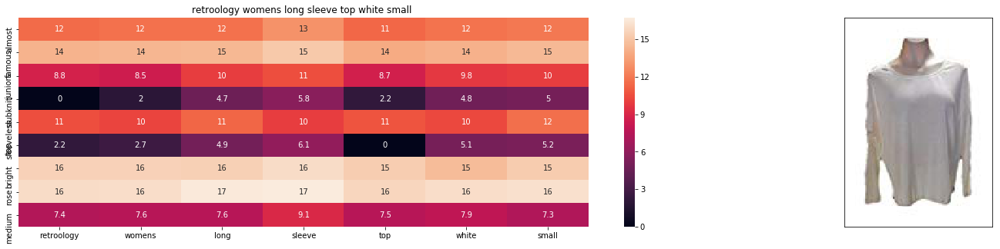

ASIN : B06XH2N9SG
Brand : Retro-ology
euclidean distance from input : 32.39309172313566


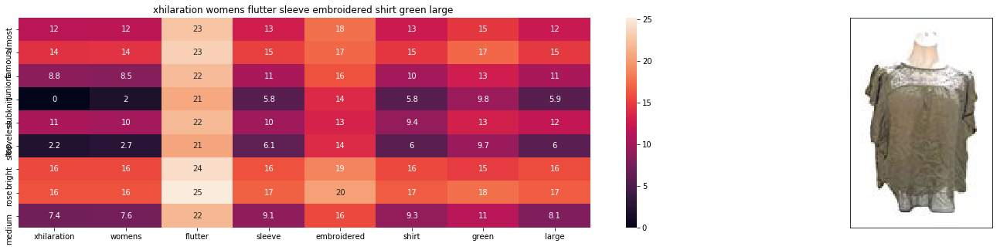

ASIN : B072M9RP4C
Brand : Xhilaration
euclidean distance from input : 32.55123740012695


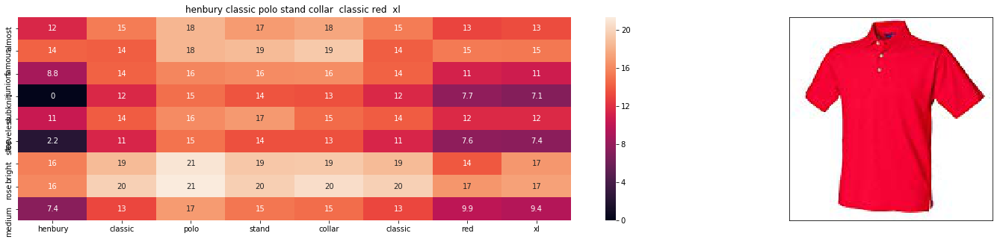

ASIN : B004X1C4PG
Brand : Henbury
euclidean distance from input : 32.577290920087385


In [200]:
idf_w2v_brand_image(1152,1,1,5,10)

# Procedure: 


- First we read the json file which has all the product details required to execute this case study.
- Number of data points :  183138 Number of features/variables: 19
- Of the 19 features provided in the dataset, only 6 features are used to implement this case study. Following 6 features are considered.  
  1. brand ( brand to which the product belongs to )
  2. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
  3. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
  4. medium_image_url  ( url of the image )
  5. title (title of the product.)
  6. formatted_price (price of the product)
- Next we examined whether the given dataset has any missing values. We also performed some basic statitics on the selected 6 features meantioned above. After removing all the missing values, the total number of data points were brought down to 28k from 183k.
- Next we examined for duplicate entires or duplicate data. Duplicate data was removed in two parts as shown in the ipython notebook. After removing duplicate data, total number of data points were 16k.
- After removing duplicate entires, next text pre processing was performed. In this, we removed all the stop words, html tags, etc,.
- After text pre- processing, Text based similarity was performed. Product title was converted from text to vector using  BOW, TFIDF, IDF, W2V, TFIDF-W2V and using this we tried to get similar products based on product title.
- Next we tried getting similar products based on brand and color.
- We also tried getting similar products based on images. We used VGG16 network with imagenet weights to convert images to vector.
- Last we tried getting similar products based on image data, product title, brand and color.

# Conculsion:
 
- Brand, color, idf_w2v and images stacking these features together gave better product similarity.idf based product similarity method also gave reasonable results.